# Import Libraries

In [785]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import VarianceThreshold
from sklearn.feature_selection import mutual_info_regression
from sklearn.feature_selection import SelectKBest
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LassoCV
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.feature_selection import RFECV
from sklearn.svm import SVR
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import StratifiedKFold, KFold
from scipy import stats
from skmultilearn.model_selection import iterative_train_test_split
%matplotlib inline

# Import Dataset

In [252]:
df = pd.read_csv('AmesHousing.csv')
df.head()

,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,...,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,1,526301100,20,RL,141.0,31770,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,NaN,0,5,2010,WD,Normal,215000
1,2,526350040,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,...,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,105000
2,3,526351010,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal,172000
3,4,526353030,20,RL,93.0,11160,Pave,NaN,Reg,Lvl,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,244000
4,5,527105010,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,...,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal,189900


In [253]:
print('Number of samples before preprocessing: {}'.format(df.shape[0]))
print('Number of columns before preprocessing: {}'.format(df.shape[1]))

Number of samples before preprocessing: 2930
Number of columns before preprocessing: 82


In [254]:
# Types Of Features
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2930 entries, 0 to 2929
Data columns (total 82 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Order            2930 non-null   int64  
 1   PID              2930 non-null   int64  
 2   MS SubClass      2930 non-null   int64  
 3   MS Zoning        2930 non-null   object 
 4   Lot Frontage     2440 non-null   float64
 5   Lot Area         2930 non-null   int64  
 6   Street           2930 non-null   object 
 7   Alley            198 non-null    object 
 8   Lot Shape        2930 non-null   object 
 9   Land Contour     2930 non-null   object 
 10  Utilities        2930 non-null   object 
 11  Lot Config       2930 non-null   object 
 12  Land Slope       2930 non-null   object 
 13  Neighborhood     2930 non-null   object 
 14  Condition 1      2930 non-null   object 
 15  Condition 2      2930 non-null   object 
 16  Bldg Type        2930 non-null   object 
 17  House Style   

In [255]:
print('Number of int64/int32 columns before preprocessing: %i '% (df.select_dtypes(include=['int64','int32']).columns.shape[0]))
print('Number of float64 columns before preprocessing: %i '% (df.select_dtypes(include=['float64']).columns.shape[0]))
print('Number of object columns before preprocessing: %i '% (df.select_dtypes(include=['object']).columns.shape[0]))

Number of int64/int32 columns before preprocessing: 28 
Number of float64 columns before preprocessing: 11 
Number of object columns before preprocessing: 43 


In [256]:
df.select_dtypes('float64').head(3)

,Lot Frontage,Mas Vnr Area,BsmtFin SF 1,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Bsmt Full Bath,Bsmt Half Bath,Garage Yr Blt,Garage Cars,Garage Area
0,141.0,112.0,639.0,0.0,441.0,1080.0,1.0,0.0,1960.0,2.0,528.0
1,80.0,0.0,468.0,144.0,270.0,882.0,0.0,0.0,1961.0,1.0,730.0
2,81.0,108.0,923.0,0.0,406.0,1329.0,0.0,0.0,1958.0,1.0,312.0


In [257]:
df.select_dtypes('int64').iloc[:,:20].head(3)

,Order,PID,MS SubClass,Lot Area,Overall Qual,Overall Cond,Year Built,Year Remod/Add,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,TotRms AbvGrd,Fireplaces,Wood Deck SF,Open Porch SF
0,1,526301100,20,31770,6,5,1960,1960,1656,0,0,1656,1,0,3,1,7,2,210,62
1,2,526350040,20,11622,5,6,1961,1961,896,0,0,896,1,0,2,1,5,0,140,0
2,3,526351010,20,14267,6,6,1958,1958,1329,0,0,1329,1,1,3,1,6,0,393,36


In [258]:
df.select_dtypes('int64').iloc[:,20:].head(3)

,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold,SalePrice
0,0,0,0,0,0,5,2010,215000
1,0,0,120,0,0,6,2010,105000
2,0,0,0,0,12500,6,2010,172000


In [259]:
df.select_dtypes('object').iloc[:,:20].head(3)

,MS Zoning,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Exter Qual,Exter Cond
0,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,Hip,CompShg,BrkFace,Plywood,Stone,TA,TA
1,RH,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,NaN,TA,TA
2,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,TA,TA


In [260]:
df.select_dtypes('object').iloc[:,20:40].head(3)

,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin Type 2,Heating,Heating QC,Central Air,Electrical,Kitchen Qual,Functional,Fireplace Qu,Garage Type,Garage Finish,Garage Qual,Garage Cond,Paved Drive,Pool QC,Fence
0,CBlock,TA,Gd,Gd,BLQ,Unf,GasA,Fa,Y,SBrkr,TA,Typ,Gd,Attchd,Fin,TA,TA,P,NaN,NaN
1,CBlock,TA,TA,No,Rec,LwQ,GasA,TA,Y,SBrkr,TA,Typ,NaN,Attchd,Unf,TA,TA,Y,NaN,MnPrv
2,CBlock,TA,TA,No,ALQ,Unf,GasA,TA,Y,SBrkr,Gd,Typ,NaN,Attchd,Unf,TA,TA,Y,NaN,NaN


In [261]:
df.select_dtypes('object').iloc[:,40:].head(3)

,Misc Feature,Sale Type,Sale Condition
0,NaN,WD,Normal
1,NaN,WD,Normal
2,Gar2,WD,Normal


# Handling Missing Values

<Axes: >

<Figure size 1200x700 with 0 Axes>

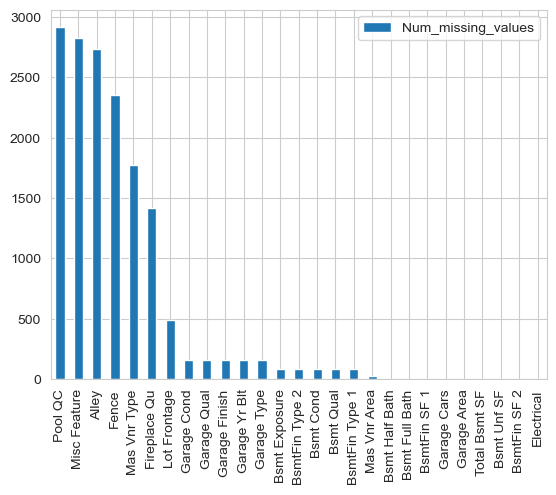

In [262]:
Null_Value = pd.DataFrame(df.isnull().sum(), columns = ['Num_missing_values'])
Mi_val_feature = Null_Value[Null_Value['Num_missing_values'] > 0]
plt.figure(figsize=(12,7))
Mi_val_feature.sort_values(by = 'Num_missing_values', ascending = False).plot.bar()

In [263]:
df['Alley'].unique()

array([nan, 'Pave', 'Grvl'], dtype=object)

In [264]:
print('Number of samples before preprocessing: {}'.format(df.shape[0]))
Mi_val_feature.sort_values(by = 'Num_missing_values', ascending = False)

Number of samples before preprocessing: 2930


,Num_missing_values
Pool QC,2917
Misc Feature,2824
Alley,2732
Fence,2358
Mas Vnr Type,1775
Fireplace Qu,1422
Lot Frontage,490
Garage Cond,159
Garage Qual,159
Garage Finish,159


#### Pool QC

In [265]:
print('Pool QC Feature Values:',df['Pool QC'].unique())
# Nan = the house does not have Pool

df['Pool QC'] = df['Pool QC'].fillna('None')
print('Number of Pool QC nan Values: ', df['Pool QC'].isnull().sum())

Pool QC Feature Values: [nan 'Ex' 'Gd' 'TA' 'Fa']
Number of Pool QC nan Values:  0


#### Misc Feature

In [266]:
print('Misc Feature Values:', df['Misc Feature'].unique())
# Nan = the house does not have miscellaneous Features

df['Misc Feature'] = df['Misc Feature'].fillna('None')
print('Number of Misc Feature nan Values: ', df['Misc Feature'].isnull().sum())

Misc Feature Values: [nan 'Gar2' 'Shed' 'Othr' 'Elev' 'TenC']
Number of Misc Feature nan Values:  0


#### Alley

In [267]:
print('Alley Feature Values:', df['Alley'].unique())
# Nan = the house does not have alley access

df['Alley'] = df['Alley'].fillna('None')
print('Number of Alley Feature nan Values: ', df['Alley'].isnull().sum())

Alley Feature Values: [nan 'Pave' 'Grvl']
Number of Alley Feature nan Values:  0


#### Fence

In [268]:
print('Fence Feature Values:', df['Fence'].unique())
# Nan = the house does not have fence 

df['Fence'] = df['Fence'].fillna('None')
print('Number of Fence Feature nan Values: ', df['Fence'].isnull().sum())

Fence Feature Values: [nan 'MnPrv' 'GdPrv' 'GdWo' 'MnWw']
Number of Fence Feature nan Values:  0


#### Mas Vnr Type

In [269]:
# Masonry Veneer Type
print('Mas Vnr Type Feature Values:', df['Mas Vnr Type'].unique())
# Nan = the house does not have Masonry Veneer  

df['Mas Vnr Type'] = df['Mas Vnr Type'].fillna('None')
print('Number of Mas Vnr Type Feature nan Values: ', df['Mas Vnr Type'].isnull().sum())

Mas Vnr Type Feature Values: ['Stone' nan 'BrkFace' 'BrkCmn' 'CBlock']
Number of Mas Vnr Type Feature nan Values:  0


#### Fireplace Qu

In [270]:
print('Fireplace Qu Feature Values:', df['Fireplace Qu'].unique())
# Nan = the house does not have fireplace 

df['Fireplace Qu'] = df['Fireplace Qu'].fillna('None')
print('Number of Fireplace Qu Feature nan Values: ', df['Fireplace Qu'].isnull().sum())

Fireplace Qu Feature Values: ['Gd' nan 'TA' 'Po' 'Ex' 'Fa']
Number of Fireplace Qu Feature nan Values:  0


#### Lot Frontage

In [271]:
df['Lot Frontage'].unique()

array([141.,  80.,  81.,  93.,  74.,  78.,  41.,  43.,  39.,  60.,  75.,
        nan,  63.,  85.,  47., 152.,  88., 140., 105.,  65.,  70.,  26.,
        21.,  53.,  24., 102.,  98.,  83.,  94.,  95.,  90.,  79., 100.,
        44., 110.,  61.,  36.,  67., 108.,  59.,  92.,  58.,  56.,  73.,
        72.,  84.,  76.,  50.,  55.,  68., 107.,  25.,  30.,  57.,  40.,
        77., 120., 137.,  87., 119.,  64.,  96.,  71.,  69.,  52.,  51.,
        54.,  86., 124.,  82.,  38.,  48.,  89.,  66.,  45.,  35., 129.,
        31.,  42.,  28.,  99., 104.,  97., 103.,  34., 117., 149., 122.,
        62., 174., 106., 112.,  32., 115., 128.,  91.,  33., 121., 144.,
       130., 109., 150., 113., 125., 101.,  46., 114., 135., 136.,  37.,
        22., 313.,  49., 123., 160., 195., 118., 134., 182., 116., 138.,
       155., 126., 200., 168., 111., 131., 153., 133.])

Text(0, 0.5, 'Counts')

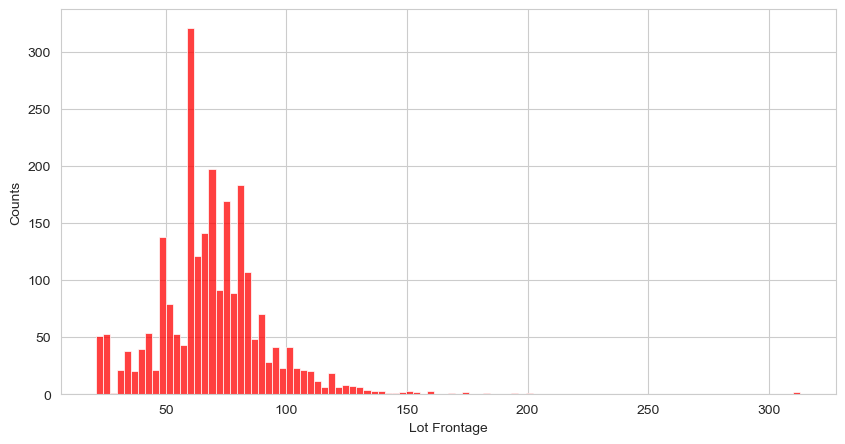

In [272]:
Lot_Frontage_Befoe_HMV = df['Lot Frontage']
plt.figure(figsize=(10,5))
sns.histplot(Lot_Frontage_Befoe_HMV, bins=100, kde=False, color='red')
plt.xlabel('Lot Frontage')
plt.ylabel('Counts')

<Axes: xlabel='MS Zoning', ylabel='Lot Frontage'>

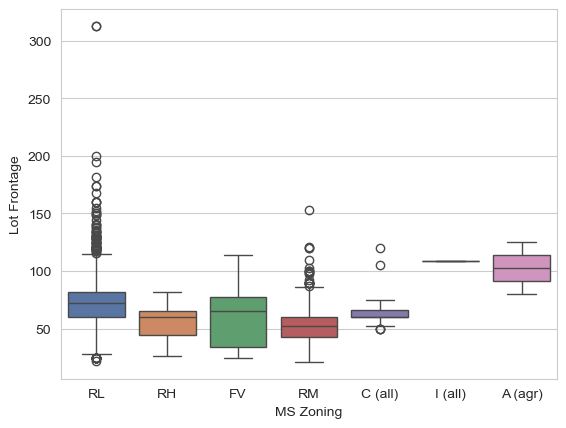

In [273]:
sns.boxplot(x='MS Zoning', y='Lot Frontage', hue='MS Zoning' , legend=False,data=df, palette = 'deep')

<Axes: xlabel='Lot Config', ylabel='Lot Frontage'>

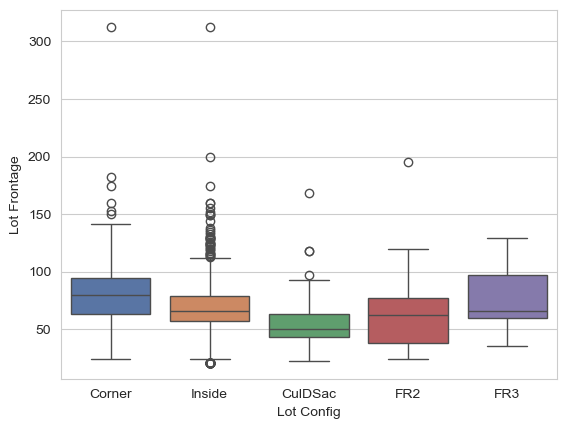

In [274]:
sns.boxplot(x='Lot Config', y='Lot Frontage', hue='Lot Config' , legend=False,data=df, palette = 'deep')

In [275]:
#def impute_missvalue(data):

#    feature_criteria = data[0]
#    feature_null = data[1]

#    if pd.isnull(feature_null):

#        if feature_criteria == 'IR1':
#            return df[df['Lot Shape'] == 'IR1'].loc[:,'Lot Frontage'].median()
#        elif feature_criteria == 'Reg':
#            return df[df['Lot Shape'] == 'Reg'].loc[:,'Lot Frontage'].median()
#        elif feature_criteria == 'IR2':
#            return df[df['Lot Shape'] == 'IR2'].loc[:,'Lot Frontage'].median()
#        else:
#            return df[df['Lot Shape'] == 'IR3'].loc[:,'Lot Frontage'].median()
#    else:
#        return feature_null

#df['Lot Frontage'] = df[['Lot Shape','Lot Frontage']].apply(impute_missvalue, axis=1)

In [276]:
df[df.isnull()['Lot Frontage']].groupby(['MS Zoning','Lot Config','Neighborhood']).size()

MS Zoning  Lot Config  Neighborhood
C (all)    Inside      OldTown          1
                       SWISU            1
FV         Corner      Somerst          2
           FR2         Somerst          4
           Inside      Somerst         14
                                       ..
RM         Inside      CollgCr          9
                       GrnHill          2
                       IDOTRR           3
                       MeadowV          4
                       OldTown          6
Length: 78, dtype: int64

In [277]:
df['Lot Frontage'] = df['Lot Frontage'].fillna(df.groupby(['MS Zoning','Lot Config','Neighborhood'])['Lot Frontage'].transform('median'))
df['Lot Frontage'] = df['Lot Frontage'].fillna(df.groupby(['Lot Config','Neighborhood'])['Lot Frontage'].transform('median'))
df['Lot Frontage'] = df['Lot Frontage'].fillna(df.groupby(['Lot Config'])['Lot Frontage'].transform('median'))
print('Number of Lot Frontage Feature nan Values: ', df['Lot Frontage'].isnull().sum())

Number of Lot Frontage Feature nan Values:  0


Text(0, 0.5, 'Counts')

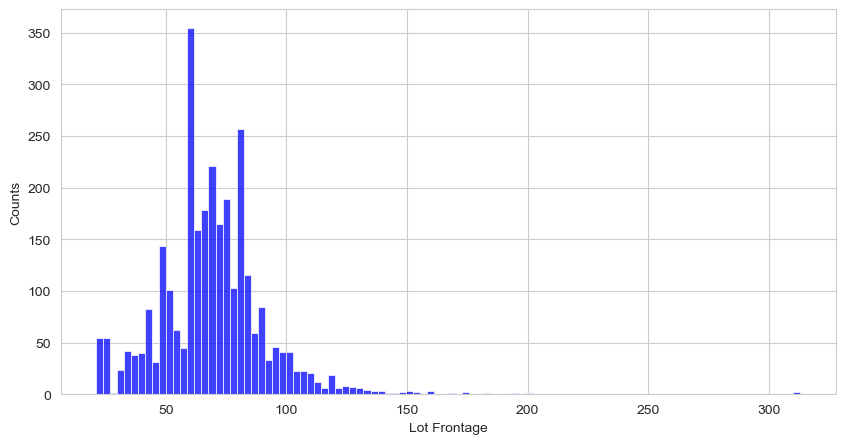

In [278]:
plt.figure(figsize=(10,5))
sns.histplot(df['Lot Frontage'], color='blue')
plt.xlabel('Lot Frontage')
plt.ylabel('Counts')

#### Garage Cond

In [279]:
print('Garage Cond Feature Values:', df['Garage Cond'].unique())
# Nan = the house does not have Garage 

df['Garage Cond'] = df['Garage Cond'].fillna('None')
print('Number of Garage Cond Feature nan Values: ', df['Garage Cond'].isnull().sum())

Garage Cond Feature Values: ['TA' nan 'Fa' 'Gd' 'Ex' 'Po']
Number of Garage Cond Feature nan Values:  0


#### Garage Qual

In [280]:
print('Garage Qual Feature Values:', df['Garage Qual'].unique())
# Nan = the house does not have Garage 

df['Garage Qual'] = df['Garage Qual'].fillna('None')
print('Number of Garage Qual Feature nan Values: ', df['Garage Qual'].isnull().sum())

Garage Qual Feature Values: ['TA' nan 'Fa' 'Gd' 'Ex' 'Po']
Number of Garage Qual Feature nan Values:  0


#### Garage Finish

In [281]:
print('Garage Finish Feature Values:', df['Garage Finish'].unique())
# Nan = the house does not have Garage 

df['Garage Finish'] = df['Garage Finish'].fillna('None')
print('Number of Garage Finish Feature nan Values: ', df['Garage Finish'].isnull().sum())

Garage Finish Feature Values: ['Fin' 'Unf' 'RFn' nan]
Number of Garage Finish Feature nan Values:  0


#### Garage Yr Blt

In [282]:
print('Garage Yr Blt Feature Values:', df['Garage Yr Blt'].unique())
# Nan = the house does not have Garage 

df['Garage Yr Blt'] = df['Garage Yr Blt'].fillna(0)
print('Number of Garage Yr Blt Feature nan Values: ', df['Garage Yr Blt'].isnull().sum())

Garage Yr Blt Feature Values: [1960. 1961. 1958. 1968. 1997. 1998. 2001. 1992. 1995. 1999. 1993. 1990.
 1985. 2003. 1988. 2010. 1951. 1978. 1977. 1974. 2000. 1970. 1971.   nan
 1975. 2009. 2008. 2005. 2004. 2002. 2006. 1996. 1994. 1980. 1979. 1984.
 1986. 1920. 1987. 1973. 1963. 1962. 1976. 1967. 1972. 1966. 1964. 1950.
 1949. 1954. 1955. 1959. 1957. 1956. 1952. 1953. 1989. 1948. 1900. 1927.
 1915. 1945. 1940. 1938. 1928. 1930. 1926. 1939. 1942. 1923. 1917. 1910.
 1965. 1969. 1947. 1946. 1941. 1924. 1922. 1896. 2007. 1983. 1981. 1991.
 1982. 1916. 1925. 1936. 1935. 1931. 1934. 1929. 1918. 1921. 1937. 1932.
 1906. 1908. 1895. 1933. 2207. 1914. 1943. 1919.]
Number of Garage Yr Blt Feature nan Values:  0


#### Garage Type

In [283]:
print('Garage Type Feature Values:', df['Garage Type'].unique())
# Nan = the house does not have Garage 

df['Garage Type'] = df['Garage Type'].fillna('None')
print('Number of Garage Type Feature nan Values: ', df['Garage Type'].isnull().sum())

Garage Type Feature Values: ['Attchd' 'BuiltIn' 'Basment' 'Detchd' nan 'CarPort' '2Types']
Number of Garage Type Feature nan Values:  0


#### Bsmt Exposure

In [284]:
print('Bsmt Exposure Feature Values:', df['Bsmt Exposure'].unique())
# Nan = the house does not have Basement 

df['Bsmt Exposure'] = df['Bsmt Exposure'].fillna('None')
print('Number of Bsmt Exposure Feature nan Values: ', df['Bsmt Exposure'].isnull().sum())

Bsmt Exposure Feature Values: ['Gd' 'No' 'Mn' 'Av' nan]
Number of Bsmt Exposure Feature nan Values:  0


#### BsmtFin Type 2

In [285]:
print('BsmtFin Type 2 Feature Values:', df['BsmtFin Type 2'].unique())
# Nan = the house does not have Basement 

df['BsmtFin Type 2'] = df['BsmtFin Type 2'].fillna('None')
print('Number of BsmtFin Type 2 Feature nan Values: ', df['BsmtFin Type 2'].isnull().sum())

BsmtFin Type 2 Feature Values: ['Unf' 'LwQ' 'BLQ' 'Rec' nan 'GLQ' 'ALQ']
Number of BsmtFin Type 2 Feature nan Values:  0


#### Bsmt Cond

In [286]:
print('Bsmt Cond Feature Values:', df['Bsmt Cond'].unique())
# Nan = the house does not have Basement 

df['Bsmt Cond'] = df['Bsmt Cond'].fillna('None')
print('Number of Bsmt Cond Feature nan Values: ', df['Bsmt Cond'].isnull().sum())

Bsmt Cond Feature Values: ['Gd' 'TA' nan 'Po' 'Fa' 'Ex']
Number of Bsmt Cond Feature nan Values:  0


#### Bsmt Qual

In [287]:
print('Bsmt Qual Feature Values:', df['Bsmt Qual'].unique())
# Nan = the house does not have Basement 

df['Bsmt Qual'] = df['Bsmt Qual'].fillna('None')
print('Number of Bsmt Qual Feature nan Values: ', df['Bsmt Qual'].isnull().sum())

Bsmt Qual Feature Values: ['TA' 'Gd' 'Ex' nan 'Fa' 'Po']
Number of Bsmt Qual Feature nan Values:  0


#### BsmtFin Type 1

In [288]:
print('BsmtFin Type 1 Feature Values:', df['BsmtFin Type 1'].unique())
# Nan = the house does not have Basement 

df['BsmtFin Type 1'] = df['BsmtFin Type 1'].fillna('None')
print('Number of BsmtFin Type 1 Feature nan Values: ', df['BsmtFin Type 1'].isnull().sum())

BsmtFin Type 1 Feature Values: ['BLQ' 'Rec' 'ALQ' 'GLQ' 'Unf' 'LwQ' nan]
Number of BsmtFin Type 1 Feature nan Values:  0


#### Mas Vnr Area

In [289]:
print('Mas Vnr Area Feature Values:', df['Mas Vnr Area'].unique())
# Nan = the house does not have masonry veneer 

df['Mas Vnr Area'] = df['Mas Vnr Area'].fillna(0)
print('Number of Mas Vnr Area Feature nan Values: ', df['Mas Vnr Area'].isnull().sum())

Mas Vnr Area Feature Values: [1.120e+02 0.000e+00 1.080e+02 2.000e+01 6.030e+02 3.500e+02 1.190e+02
 4.800e+02 8.100e+01 1.800e+02 5.040e+02 4.920e+02 3.810e+02 1.620e+02
 2.000e+02 4.500e+02 2.560e+02 2.260e+02 6.150e+02 2.400e+02 1.680e+02
 7.600e+02 1.280e+02 1.095e+03 2.320e+02 4.120e+02 1.780e+02 1.060e+02
 1.400e+01 1.600e+01       nan 1.650e+02 1.140e+02 3.380e+02 3.620e+02
 3.480e+02 3.000e+01 5.790e+02 3.600e+01 1.220e+02 1.300e+02 3.100e+01
 2.500e+02 1.200e+02 2.160e+02 4.320e+02 1.159e+03 2.890e+02 2.800e+01
 4.200e+01 1.720e+02 4.510e+02 2.680e+02 8.600e+01 1.560e+02 1.440e+02
 2.650e+02 3.400e+02 1.100e+02 1.640e+02 3.610e+02 2.870e+02 5.060e+02
 1.500e+02 2.200e+02 3.240e+02 9.100e+01 1.040e+02 3.000e+02 2.610e+02
 2.180e+02 3.510e+02 7.710e+02 2.940e+02 9.000e+01 7.200e+01 4.700e+01
 1.430e+02 3.280e+02 2.880e+02 9.600e+01 3.360e+02 1.770e+02 8.500e+01
 2.460e+02 2.400e+01 8.000e+01 1.160e+02 1.530e+02 3.200e+02 4.790e+02
 2.230e+02 4.420e+02 1.700e+02 1.690e+02 1.710e+

#### Bsmt Full Bath

In [290]:
print('Bsmt Full Bath Feature Values:', df['Bsmt Full Bath'].unique())
# I decide to convert Nan value to zero for Bsmt Full Bath Feature / Another Option is to remove these samples with a Nan value

df['Bsmt Full Bath'] = df['Bsmt Full Bath'].fillna(0)
print('Number of Bsmt Full Bath Feature nan Values: ', df['Bsmt Full Bath'].isnull().sum())


Bsmt Full Bath Feature Values: [ 1.  0.  2.  3. nan]
Number of Bsmt Full Bath Feature nan Values:  0


#### Bsmt Half Bath

In [291]:
print('Bsmt Half Bath Feature Values:', df['Bsmt Half Bath'].unique())
# I decide to convert Nan value to zero for Bsmt Half Bath Feature / Another Option is to remove these samples with a Nan value

df['Bsmt Half Bath'] = df['Bsmt Half Bath'].fillna(0)
print('Number of Bsmt Half Bath Feature nan Values: ', df['Bsmt Half Bath'].isnull().sum())

Bsmt Half Bath Feature Values: [ 0.  1. nan  2.]
Number of Bsmt Half Bath Feature nan Values:  0


#### Electrical

In [292]:
print('Electrical Feature Values:', df['Electrical'].unique())
# Fill sample with nan value by most frequent value
df['Electrical'] = df['Electrical'].fillna(df['Electrical'].mode()[0])
print('Number of Electrical Feature nan Values: ', df['Electrical'].isnull().sum())

Electrical Feature Values: ['SBrkr' 'FuseA' 'FuseF' 'FuseP' nan 'Mix']
Number of Electrical Feature nan Values:  0


#### Garage Cars

In [293]:
print('Garage Cars Feature Values:', df['Garage Cars'].unique())
# Fill sample with nan value by most frequent value
df['Garage Cars'] = df['Garage Cars'].fillna(df['Garage Cars'].mode()[0])
print('Number of Garage Cars Feature nan Values: ', df['Garage Cars'].isnull().sum())

Garage Cars Feature Values: [ 2.  1.  3.  0.  4.  5. nan]
Number of Garage Cars Feature nan Values:  0


#### Garage Area

In [294]:
print('Garage Area Feature Values:', df['Garage Area'].unique())
# Fill sample with nan value by most frequent value
df['Garage Area'] = df['Garage Area'].fillna(df['Garage Area'].median())
print('Number of Garage Area Feature nan Values: ', df['Garage Area'].isnull().sum())

Garage Area Feature Values: [ 528.  730.  312.  522.  482.  470.  582.  506.  608.  442.  440.  420.
  393.  841.  492.  834.  400.  500.  546.  663.  480.  304.  525.    0.
  511.  264.  320.  308.  751.  772.  606.  868.  532.  678.  820.  484.
  958.  756.  576.  474.  430.  437.  433.  434.  779.  962.  527.  712.
  671.  486.  666.  880.  676.  614.  750.  618.  463.  462.  457.  476.
  429.  539.  336.  280.  260.  461.  564.  762.  713.  588.  496.  852.
  592.  475.  596.  535.  660.  441.  490.  504.  517.  240.  364.  244.
  315.  578.  620.  447.  294.  531.  263.  318.  305.  246.  392.  330.
  720.  360.  551.  379.  220.  780.  288.  416.  624.  923.  560.  363.
  200.  572.  180.  516.  672.  349.  365.  231.  450.  270.  299.  591.
  533.  690.  436.  586.  366.  467.  209.  460. 1017.  574.  776.  632.
  740.  615.  594.  580.  513.  523.  850.  670.  613.  621.  598.  502.
  494.  319.  352.  216.  399.  252.  567.  473.  625.  384.  741.  573.
  888.  520.  680.  510

#### BsmtFin SF 1

In [295]:
print('BsmtFin SF 1 Feature Values:', df['BsmtFin SF 1'].unique())
# I decide to convert Nan value to zero for BsmtFin SF 1 Feature / Another Option is to remove these samples with a Nan value

df['BsmtFin SF 1'] = df['BsmtFin SF 1'].fillna(0)
print('Number of BsmtFin SF 1 Feature nan Values: ', df['BsmtFin SF 1'].isnull().sum())

BsmtFin SF 1 Feature Values: [6.390e+02 4.680e+02 9.230e+02 1.065e+03 7.910e+02 6.020e+02 6.160e+02
 2.630e+02 1.180e+03 0.000e+00 9.350e+02 6.370e+02 3.680e+02 1.416e+03
 4.270e+02 1.445e+03 1.200e+02 7.900e+02 7.050e+02 8.850e+02 5.330e+02
 5.780e+02 7.340e+02 7.750e+02 8.040e+02 4.320e+02 1.051e+03 1.560e+02
 3.000e+02 3.600e+02 5.140e+02 3.110e+02 1.218e+03 1.646e+03 1.201e+03
 1.100e+02 2.800e+01 2.000e+00 2.188e+03 7.330e+02 1.373e+03 4.560e+02
 2.400e+01 1.600e+01 3.260e+02 6.250e+02 2.500e+02 9.190e+02 1.032e+03
 5.240e+02 8.160e+02 1.078e+03 2.220e+02 1.414e+03 6.560e+02 6.950e+02
 5.430e+02 6.230e+02 4.020e+02 3.380e+02 8.990e+02 5.530e+02 4.500e+02
 8.240e+02 6.590e+02 1.260e+02 6.740e+02 1.129e+03 1.298e+03 2.800e+02
 3.760e+02 3.780e+02 4.660e+02 6.040e+02 2.440e+02 4.840e+02 7.280e+02
 1.052e+03 8.330e+02 5.060e+02 1.137e+03 1.200e+03 6.870e+02 3.940e+02
 9.820e+02 3.290e+02 6.980e+02 5.690e+02 1.059e+03 1.010e+03 1.014e+03
 7.630e+02 1.500e+03 4.900e+01 6.700e+02 6.960e+

#### BsmtFin SF 2

In [296]:
print('BsmtFin SF 2 Feature Values:', df['BsmtFin SF 2'].unique())
# I decide to convert Nan value to zero for BsmtFin SF 2 Feature / Another Option is to remove these samples with a Nan value

df['BsmtFin SF 2'] = df['BsmtFin SF 2'].fillna(0)
print('Number of BsmtFin SF 2 Feature nan Values: ', df['BsmtFin SF 2'].isnull().sum())

BsmtFin SF 2 Feature Values: [   0.  144. 1120.  163.  168.   78.  119.  121.  117.  859.  981.   42.
   46.   81. 1029.  290.  132.  713.  162.  362.  240.  258.  174.  906.
  486.  350.  263. 1073.  692.   12.  159.  712.  668.  474.  453.  684.
  387.  688.  972.  127.  252.  334.  232.  480.  590.  284.  276.  472.
  239.  180.  294.  622.  495.  539.  479.  113. 1526.  360.  774.  364.
  596.  884.  311.   92.  216.  136.   32.  147. 1127.  466.  630.  201.
  345.  512.  230.  247.  661.  620.  202.  483.  750.  690.  105.   60.
  352.  102.   95.  465.   63.  262.  500.  670.  768.  393.  286.  450.
  177.  764.  344.   72.  243.  420.  210.  694.  875.  507.  435.  419.
  250.  116.  354.  820.  624.  273.   76.  270.  110.  288.  411.  228.
  186.  449.   48.   93.  438.  613.  852.  555.  841.  799.  811.  842.
  382.  182.  456.   80.   64.  336.  306.  308.  374.  872.  108.   52.
  196.  128.  488.  319.  532.  106.  169.  608.   nan   41.  606.  645.
  492.  181.  956. 108

#### Bsmt Unf SF

In [297]:
print('Bsmt Unf SF Feature Values:', df['Bsmt Unf SF'].unique())
# I decide to convert Nan value to zero for Bsmt Unf SF Feature / Another Option is to remove these samples with a Nan value

df['Bsmt Unf SF'] = df['Bsmt Unf SF'].fillna(0)
print('Number of Bsmt Unf SF Feature nan Values: ', df['Bsmt Unf SF'].isnull().sum())

Bsmt Unf SF Feature Values: [ 441.  270.  406. ...   45. 1503.  239.]
Number of Bsmt Unf SF Feature nan Values:  0


#### Total Bsmt SF

In [298]:
print('Total Bsmt SF Feature Values:', df['Total Bsmt SF'].unique())
# I decide to convert Nan value to zero for Total Bsmt SF Feature / Another Option is to remove these samples with a Nan value

df['Total Bsmt SF'] = df['Total Bsmt SF'].fillna(0)
print('Number of Total Bsmt SF Feature nan Values: ', df['Total Bsmt SF'].isnull().sum())

Total Bsmt SF Feature Values: [1080.  882. 1329. ... 1381.  757. 1003.]
Number of Total Bsmt SF Feature nan Values:  0


In [299]:
Final_miss_value = pd.DataFrame(df.isnull().sum(), columns = ['Num_missing_values'])
print(Final_miss_value)
Num_Final_miss_value = len(Final_miss_value[Final_miss_value['Num_missing_values'] > 0])
print('Number of Feature with Missing Values:',Num_Final_miss_value)

                Num_missing_values
Order                            0
PID                              0
MS SubClass                      0
MS Zoning                        0
Lot Frontage                     0
...                            ...
Mo Sold                          0
Yr Sold                          0
Sale Type                        0
Sale Condition                   0
SalePrice                        0

[82 rows x 1 columns]
Number of Feature with Missing Values: 0


In [300]:
df.reset_index(inplace=True)
df.drop('index', axis=1, inplace=True)
df

,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,...,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,1,526301100,20,RL,141.0,31770,Pave,None,IR1,Lvl,...,0,None,None,None,0,5,2010,WD,Normal,215000
1,2,526350040,20,RH,80.0,11622,Pave,None,Reg,Lvl,...,0,None,MnPrv,None,0,6,2010,WD,Normal,105000
2,3,526351010,20,RL,81.0,14267,Pave,None,IR1,Lvl,...,0,None,None,Gar2,12500,6,2010,WD,Normal,172000
3,4,526353030,20,RL,93.0,11160,Pave,None,Reg,Lvl,...,0,None,None,None,0,4,2010,WD,Normal,244000
4,5,527105010,60,RL,74.0,13830,Pave,None,IR1,Lvl,...,0,None,MnPrv,None,0,3,2010,WD,Normal,189900
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2925,2926,923275080,80,RL,37.0,7937,Pave,None,IR1,Lvl,...,0,None,GdPrv,None,0,3,2006,WD,Normal,142500
2926,2927,923276100,20,RL,74.0,8885,Pave,None,IR1,Low,...,0,None,MnPrv,None,0,6,2006,WD,Normal,131000
2927,2928,923400125,85,RL,62.0,10441,Pave,None,Reg,Lvl,...,0,None,MnPrv,Shed,700,7,2006,WD,Normal,132000
2928,2929,924100070,20,RL,77.0,10010,Pave,None,Reg,Lvl,...,0,None,None,None,0,4,2006,WD,Normal,170000


In [301]:
print('Number of samples After Handling The Missing Values: {}'.format(df.shape[0]))
print('Number of columns After Handling The Missing Values: {}'.format(df.shape[1]))

Number of samples After Handling The Missing Values: 2930
Number of columns After Handling The Missing Values: 82


# Outliers

In [302]:
# IQR

def detect_outliers_IQR(data):
    outliers = {}
    outliers = {'index':[], 'value':[]}

    quantile1, quantile3= np.percentile(data,[25,75])
    iqr_value=quantile3-quantile1
    lower_bound_val = quantile1 - (1.5 * iqr_value) 
    upper_bound_val = quantile3 + (1.5 * iqr_value) 

    for index,value in enumerate(data):
        if value > upper_bound_val:
            outliers['index'].append(index)
            outliers['value'].append(value)
        elif value < lower_bound_val:
            outliers['index'].append(index)
            outliers['value'].append(value)

    return outliers

In [303]:
# Using Z-score

def detect_outliers(data):
    outliers = {}
    outliers = {'index':[], 'value':[]}

    threshold = 3
    mean = np.mean(data)
    std = np.std(data)

    for index,value in enumerate(data):
        z_score = (value - mean)/std
        if np.abs(z_score) > threshold:
            outliers['index'].append(index)
            outliers['value'].append(value)

    return outliers

In [304]:
def detect_outliers_freq(data):
    outlier_class=[]
    calss_prop = data.value_counts(normalize=True).reset_index()
    num_class = len(calss_prop)

    for i in range(num_class):
        if calss_prop.iloc[i,1] < 0.01:
            outlier_class.append(calss_prop.iloc[i,0])
                                 
    outliers = {'index':[], 'value':[]}
    for j in outlier_class:
        outliers['index'].extend(data[(data == j)].index)
        outliers['value'].extend(data[(data == j)].values)    
    
    return outliers

In [305]:
intfloat_features_outliers = {'index':[],'value':[]}

In [306]:
df.select_dtypes(['float64']).columns

Index(['Lot Frontage', 'Mas Vnr Area', 'BsmtFin SF 1', 'BsmtFin SF 2',
       'Bsmt Unf SF', 'Total Bsmt SF', 'Bsmt Full Bath', 'Bsmt Half Bath',
       'Garage Yr Blt', 'Garage Cars', 'Garage Area'],
      dtype='object')

#### Lot Frontage

In [307]:
np.sort(df['Lot Frontage'].unique())

array([ 21. ,  22. ,  24. ,  25. ,  26. ,  28. ,  30. ,  31. ,  32. ,
        33. ,  34. ,  35. ,  36. ,  37. ,  38. ,  39. ,  40. ,  41. ,
        41.5,  42. ,  43. ,  43.5,  44. ,  44.5,  45. ,  46. ,  47. ,
        48. ,  49. ,  50. ,  51. ,  52. ,  53. ,  54. ,  55. ,  56. ,
        57. ,  57.5,  58. ,  59. ,  59.5,  60. ,  61. ,  62. ,  63. ,
        63.5,  64. ,  65. ,  66. ,  66.5,  67. ,  68. ,  69. ,  70. ,
        71. ,  72. ,  73. ,  74. ,  75. ,  76. ,  77. ,  77.5,  78. ,
        79. ,  80. ,  81. ,  82. ,  82.5,  83. ,  84. ,  85. ,  86. ,
        86.5,  87. ,  88. ,  89. ,  90. ,  91. ,  92. ,  93. ,  94. ,
        95. ,  96. ,  97. ,  98. ,  99. , 100. , 101. , 102. , 103. ,
       104. , 105. , 106. , 107. , 108. , 108.5, 109. , 110. , 111. ,
       112. , 113. , 114. , 115. , 116. , 117. , 118. , 119. , 120. ,
       121. , 122. , 123. , 124. , 125. , 126. , 128. , 129. , 130. ,
       131. , 133. , 134. , 135. , 136. , 137. , 138. , 140. , 141. ,
       144. , 149. ,

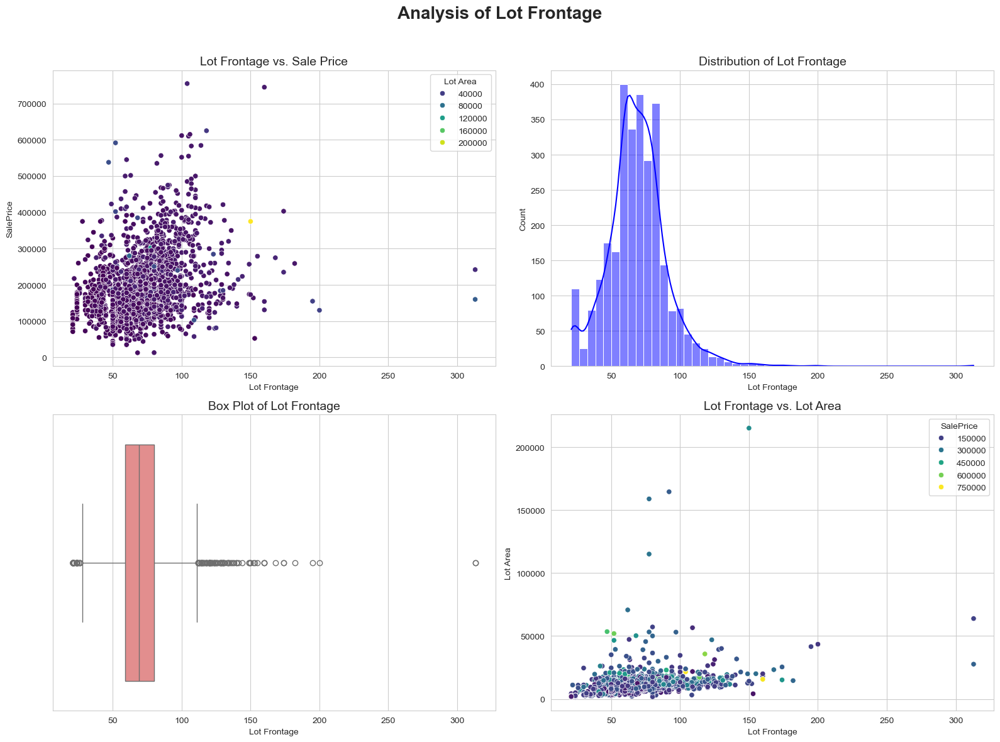

In [308]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Analysis of Lot Frontage', fontsize=20, weight='bold')

sns.scatterplot(x='Lot Frontage', y='SalePrice', hue='Lot Area', legend=True ,palette='viridis', data=df, ax=axes[0,0])
axes[0,0].set_title('Lot Frontage vs. Sale Price', fontsize=14)

sns.histplot(df['Lot Frontage'], kde=True, color='blue', bins=50, ax=axes[0, 1])
axes[0, 1].set_title('Distribution of Lot Frontage', fontsize=14)

sns.boxplot(x=df['Lot Frontage'], color='lightcoral', ax=axes[1, 0])
axes[1, 0].set_title('Box Plot of Lot Frontage', fontsize=14)

sns.scatterplot(x='Lot Frontage', y='Lot Area', hue='SalePrice', legend=True ,palette='viridis', data=df, ax=axes[1,1])
axes[1, 1].set_title('Lot Frontage vs. Lot Area', fontsize=14)

plt.tight_layout(rect=[0, 0, 1, 0.96])

In [309]:
Outliers_Lot_Frontage = detect_outliers_IQR(df['Lot Frontage'])
print(Outliers_Lot_Frontage)
print('Number of data:',len(Outliers_Lot_Frontage['index']))

# These samples are not actual outliers. Because they are true values in this concept so they can be solved by Log transform 

#intfloat_features_outliers['index'].extend(Outliers_Lot_Frontage['index'])
#intfloat_features_outliers['value'].extend(Outliers_Lot_Frontage['value'])

{'index': [0, 16, 18, 28, 29, 30, 31, 33, 34, 35, 93, 97, 98, 102, 128, 137, 150, 234, 311, 326, 329, 330, 331, 332, 368, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 435, 457, 460, 466, 467, 495, 520, 573, 607, 616, 628, 639, 719, 728, 806, 825, 840, 921, 932, 933, 934, 935, 956, 959, 962, 964, 973, 975, 977, 978, 979, 1039, 1040, 1041, 1042, 1043, 1044, 1045, 1047, 1048, 1052, 1067, 1068, 1071, 1102, 1165, 1166, 1172, 1173, 1175, 1176, 1179, 1265, 1277, 1373, 1403, 1409, 1497, 1498, 1542, 1543, 1557, 1592, 1593, 1594, 1596, 1597, 1599, 1600, 1630, 1638, 1656, 1674, 1675, 1676, 1677, 1678, 1679, 1680, 1681, 1682, 1700, 1702, 1745, 1760, 1781, 1799, 1842, 1845, 1848, 1866, 1945, 1981, 2032, 2045, 2090, 2091, 2118, 2141, 2180, 2181, 2212, 2225, 2257, 2258, 2278, 2285, 2286, 2287, 2288, 2289, 2290, 2298, 2316, 2321, 2363, 2364, 2365, 2366, 2367, 2368, 2369, 2370, 2371, 2372, 2376, 2377, 2378, 2384, 2388, 2397, 2398, 2445, 2450, 2499, 2507, 2508, 2514, 2

Text(0.5, 1.0, 'Transformed Distribution (More Normal)')

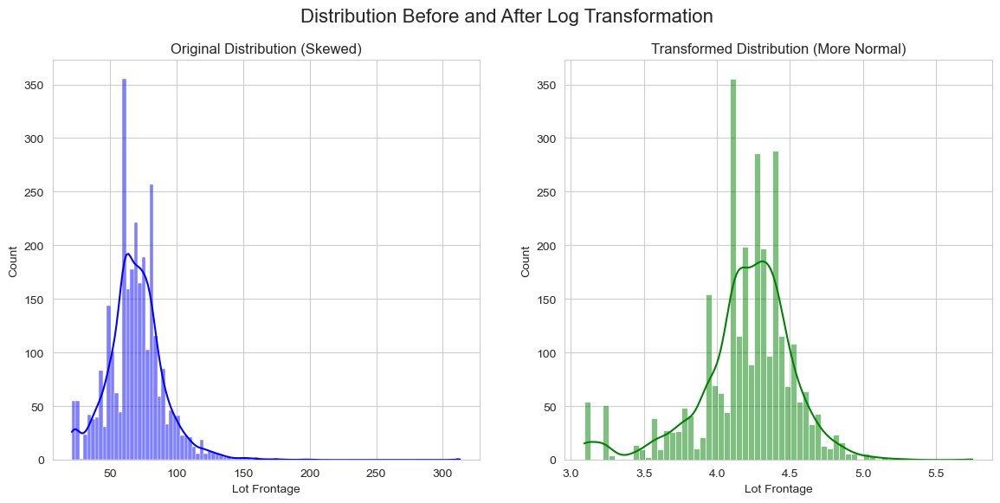

In [310]:
Lot_Frontage_log1p = np.log1p(df['Lot Frontage'])

# Create a figure with two subplots, side-by-side
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('Distribution Before and After Log Transformation', fontsize=16)

# Plot Original Distribution
sns.histplot(df['Lot Frontage'], kde=True, ax=axes[0], color='blue')
axes[0].set_title('Original Distribution (Skewed)')

# Plot Transformed Distribution
sns.histplot(Lot_Frontage_log1p, kde=True, ax=axes[1], color='green')
axes[1].set_title('Transformed Distribution (More Normal)')

In [311]:
df['Transformed Lot Frontage'] = np.round(Lot_Frontage_log1p, decimals=2)
df = df.drop(['Lot Frontage'], axis=1)

#### Mas Vnr Area

In [312]:
np.sort(df['Mas Vnr Area'].unique())

array([0.000e+00, 1.000e+00, 3.000e+00, 1.100e+01, 1.400e+01, 1.600e+01,
       1.800e+01, 2.000e+01, 2.200e+01, 2.300e+01, 2.400e+01, 2.700e+01,
       2.800e+01, 3.000e+01, 3.100e+01, 3.200e+01, 3.400e+01, 3.600e+01,
       3.800e+01, 3.900e+01, 4.000e+01, 4.100e+01, 4.200e+01, 4.400e+01,
       4.500e+01, 4.600e+01, 4.700e+01, 4.800e+01, 5.000e+01, 5.100e+01,
       5.200e+01, 5.300e+01, 5.400e+01, 5.600e+01, 5.700e+01, 5.800e+01,
       6.000e+01, 6.200e+01, 6.300e+01, 6.400e+01, 6.500e+01, 6.600e+01,
       6.700e+01, 6.800e+01, 6.900e+01, 7.000e+01, 7.200e+01, 7.400e+01,
       7.500e+01, 7.600e+01, 8.000e+01, 8.100e+01, 8.200e+01, 8.400e+01,
       8.500e+01, 8.600e+01, 8.700e+01, 8.800e+01, 8.900e+01, 9.000e+01,
       9.100e+01, 9.200e+01, 9.400e+01, 9.500e+01, 9.600e+01, 9.700e+01,
       9.800e+01, 9.900e+01, 1.000e+02, 1.010e+02, 1.020e+02, 1.040e+02,
       1.050e+02, 1.060e+02, 1.080e+02, 1.090e+02, 1.100e+02, 1.120e+02,
       1.130e+02, 1.140e+02, 1.150e+02, 1.160e+02, 

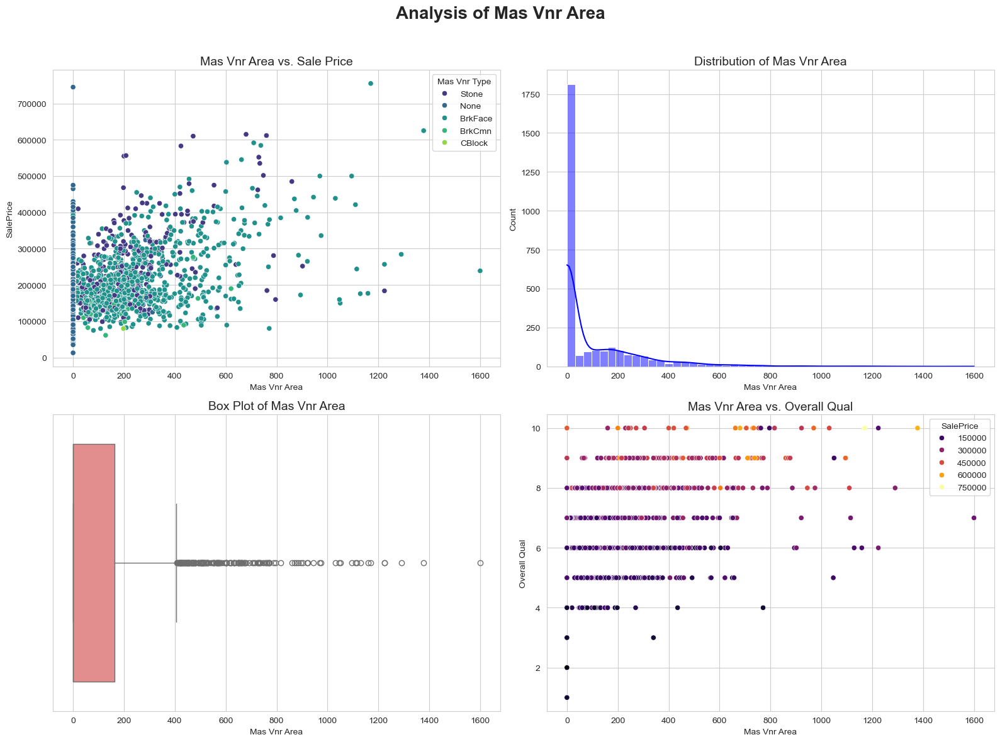

In [313]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Analysis of Mas Vnr Area', fontsize=20, weight='bold')

sns.scatterplot(x='Mas Vnr Area', y='SalePrice', hue='Mas Vnr Type', legend=True ,palette='viridis', data=df, ax=axes[0,0])
axes[0,0].set_title('Mas Vnr Area vs. Sale Price', fontsize=14)

sns.histplot(df['Mas Vnr Area'], kde=True, color='blue', bins=50, ax=axes[0, 1])
axes[0, 1].set_title('Distribution of Mas Vnr Area', fontsize=14)

sns.boxplot(x=df['Mas Vnr Area'], color='lightcoral', ax=axes[1, 0])
axes[1, 0].set_title('Box Plot of Mas Vnr Area', fontsize=14)

sns.scatterplot(x='Mas Vnr Area', y='Overall Qual', hue='SalePrice', legend=True ,palette='inferno', data=df, ax=axes[1,1])
axes[1, 1].set_title('Mas Vnr Area vs. Overall Qual', fontsize=14)

plt.tight_layout(rect=[0, 0, 1, 0.96])

In [314]:
Outliers_Mas_Vnr_Area = detect_outliers_IQR(df['Mas Vnr Area'])
print(Outliers_Mas_Vnr_Area)
print('Number of data:',len(Outliers_Mas_Vnr_Area['index']))

# These samples are not actual outliers. Because they are true values in this concept so they can be solved by Log transform 

#intfloat_features_outliers['index'].extend(Outliers_Mas_Vnr_Area['index'])
#intfloat_features_outliers['value'].extend(Outliers_Mas_Vnr_Area['value'])

{'index': [15, 20, 29, 30, 38, 41, 44, 46, 48, 65, 91, 99, 101, 118, 139, 147, 169, 264, 267, 294, 342, 366, 367, 402, 405, 406, 421, 422, 425, 429, 431, 432, 433, 445, 447, 448, 456, 457, 459, 494, 495, 497, 498, 499, 500, 504, 570, 571, 573, 574, 580, 597, 627, 640, 641, 666, 687, 737, 873, 887, 931, 955, 967, 972, 1022, 1023, 1030, 1041, 1044, 1050, 1052, 1055, 1056, 1057, 1059, 1063, 1064, 1066, 1067, 1069, 1070, 1072, 1073, 1074, 1093, 1098, 1099, 1102, 1104, 1105, 1106, 1108, 1109, 1115, 1124, 1158, 1174, 1175, 1176, 1182, 1197, 1229, 1233, 1280, 1425, 1498, 1537, 1563, 1587, 1613, 1637, 1641, 1648, 1675, 1685, 1691, 1695, 1697, 1701, 1706, 1707, 1761, 1763, 1764, 1767, 1769, 1771, 1774, 1780, 1782, 1786, 1843, 1844, 1846, 1848, 1849, 1854, 1864, 1907, 1983, 2030, 2053, 2115, 2151, 2155, 2180, 2181, 2209, 2216, 2223, 2228, 2245, 2246, 2258, 2268, 2269, 2308, 2309, 2316, 2329, 2330, 2333, 2334, 2335, 2336, 2341, 2364, 2366, 2370, 2371, 2384, 2388, 2396, 2397, 2398, 2399, 2400, 240

Text(0.5, 1.0, 'Transformed Distribution (More Normal)')

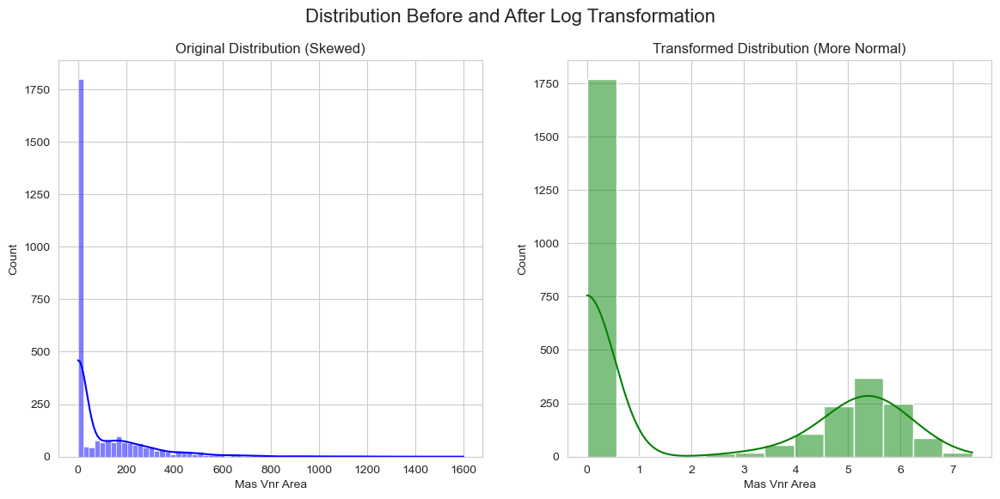

In [315]:
Mas_Vnr_Area_log1p = np.log1p(df['Mas Vnr Area'])

# Create a figure with two subplots, side-by-side
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('Distribution Before and After Log Transformation', fontsize=16)

# Plot Original Distribution
sns.histplot(df['Mas Vnr Area'], kde=True, ax=axes[0], color='blue')
axes[0].set_title('Original Distribution (Skewed)')

# Plot Transformed Distribution
sns.histplot(Mas_Vnr_Area_log1p, kde=True, ax=axes[1], color='green')
axes[1].set_title('Transformed Distribution (More Normal)')

In [316]:
df['Transformed Mas Vnr Area'] = np.round(Mas_Vnr_Area_log1p, decimals=2)
df = df.drop(['Mas Vnr Area'], axis=1)

#### BsmtFin SF 1

In [317]:
df['BsmtFin SF 1'].unique()

array([6.390e+02, 4.680e+02, 9.230e+02, 1.065e+03, 7.910e+02, 6.020e+02,
       6.160e+02, 2.630e+02, 1.180e+03, 0.000e+00, 9.350e+02, 6.370e+02,
       3.680e+02, 1.416e+03, 4.270e+02, 1.445e+03, 1.200e+02, 7.900e+02,
       7.050e+02, 8.850e+02, 5.330e+02, 5.780e+02, 7.340e+02, 7.750e+02,
       8.040e+02, 4.320e+02, 1.051e+03, 1.560e+02, 3.000e+02, 3.600e+02,
       5.140e+02, 3.110e+02, 1.218e+03, 1.646e+03, 1.201e+03, 1.100e+02,
       2.800e+01, 2.000e+00, 2.188e+03, 7.330e+02, 1.373e+03, 4.560e+02,
       2.400e+01, 1.600e+01, 3.260e+02, 6.250e+02, 2.500e+02, 9.190e+02,
       1.032e+03, 5.240e+02, 8.160e+02, 1.078e+03, 2.220e+02, 1.414e+03,
       6.560e+02, 6.950e+02, 5.430e+02, 6.230e+02, 4.020e+02, 3.380e+02,
       8.990e+02, 5.530e+02, 4.500e+02, 8.240e+02, 6.590e+02, 1.260e+02,
       6.740e+02, 1.129e+03, 1.298e+03, 2.800e+02, 3.760e+02, 3.780e+02,
       4.660e+02, 6.040e+02, 2.440e+02, 4.840e+02, 7.280e+02, 1.052e+03,
       8.330e+02, 5.060e+02, 1.137e+03, 1.200e+03, 

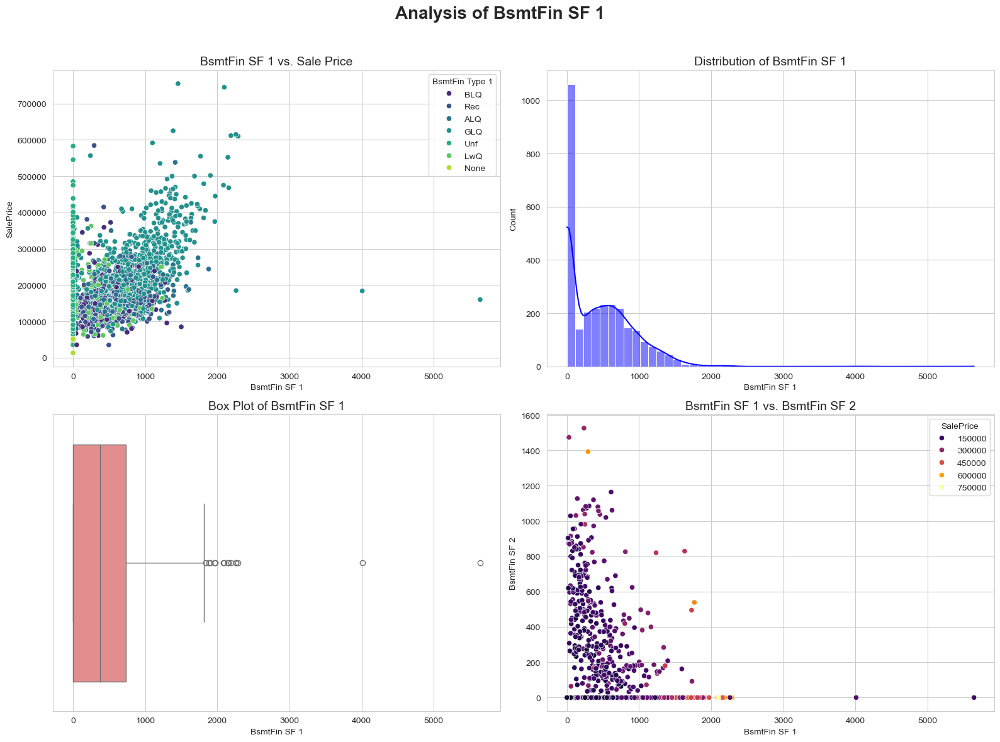

In [318]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Analysis of BsmtFin SF 1', fontsize=20, weight='bold')

sns.scatterplot(x='BsmtFin SF 1', y='SalePrice', hue='BsmtFin Type 1', legend=True ,palette='viridis', data=df, ax=axes[0,0])
axes[0,0].set_title('BsmtFin SF 1 vs. Sale Price', fontsize=14)

sns.histplot(df['BsmtFin SF 1'], kde=True, color='blue', bins=50, ax=axes[0, 1])
axes[0, 1].set_title('Distribution of BsmtFin SF 1', fontsize=14)

sns.boxplot(x=df['BsmtFin SF 1'], color='lightcoral', ax=axes[1, 0])
axes[1, 0].set_title('Box Plot of BsmtFin SF 1', fontsize=14)

sns.scatterplot(x='BsmtFin SF 1', y='BsmtFin SF 2', hue='SalePrice', legend=True ,palette='inferno', data=df, ax=axes[1,1])
axes[1, 1].set_title('BsmtFin SF 1 vs. BsmtFin SF 2', fontsize=14)

plt.tight_layout(rect=[0, 0, 1, 0.96])

In [319]:
Outliers_BsmtFin_SF_1 = detect_outliers_IQR(df['BsmtFin SF 1'])
print(Outliers_BsmtFin_SF_1)
print('Number of data:',len(Outliers_BsmtFin_SF_1['index']))

# These samples are not actual outliers. Because they are true values in this concept so they can be solved by Log transform 

#intfloat_features_outliers['index'].extend(Outliers_BsmtFin_SF_1['index'])
#intfloat_features_outliers['value'].extend(Outliers_BsmtFin_SF_1['value'])

{'index': [44, 349, 366, 432, 448, 456, 513, 1063, 1425, 1498, 1613, 1760, 2180, 2181, 2461], 'value': [2188.0, 1965.0, 1904.0, 2288.0, 1972.0, 2146.0, 2158.0, 2257.0, 2085.0, 5644.0, 1880.0, 2096.0, 4010.0, 2260.0, 1836.0]}
Number of data: 15


Text(0.5, 1.0, 'Transformed Distribution (More Normal)')

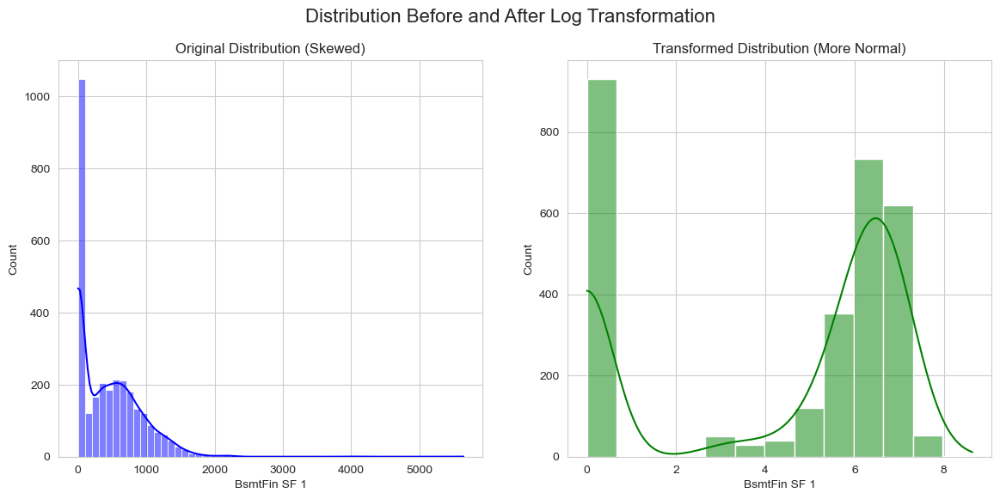

In [320]:
BsmtFin_SF_1_log1p = np.log1p(df['BsmtFin SF 1'])

# Create a figure with two subplots, side-by-side
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('Distribution Before and After Log Transformation', fontsize=16)

# Plot Original Distribution
sns.histplot(df['BsmtFin SF 1'], kde=True, ax=axes[0], color='blue')
axes[0].set_title('Original Distribution (Skewed)')

# Plot Transformed Distribution
sns.histplot(BsmtFin_SF_1_log1p, kde=True, ax=axes[1], color='green')
axes[1].set_title('Transformed Distribution (More Normal)')

In [321]:
df['Transformed BsmtFin SF 1'] = np.round(BsmtFin_SF_1_log1p, decimals=2)
df = df.drop(['BsmtFin SF 1'], axis=1)

#### BsmtFin SF 2

In [322]:
df['BsmtFin SF 2'].unique()

array([   0.,  144., 1120.,  163.,  168.,   78.,  119.,  121.,  117.,
        859.,  981.,   42.,   46.,   81., 1029.,  290.,  132.,  713.,
        162.,  362.,  240.,  258.,  174.,  906.,  486.,  350.,  263.,
       1073.,  692.,   12.,  159.,  712.,  668.,  474.,  453.,  684.,
        387.,  688.,  972.,  127.,  252.,  334.,  232.,  480.,  590.,
        284.,  276.,  472.,  239.,  180.,  294.,  622.,  495.,  539.,
        479.,  113., 1526.,  360.,  774.,  364.,  596.,  884.,  311.,
         92.,  216.,  136.,   32.,  147., 1127.,  466.,  630.,  201.,
        345.,  512.,  230.,  247.,  661.,  620.,  202.,  483.,  750.,
        690.,  105.,   60.,  352.,  102.,   95.,  465.,   63.,  262.,
        500.,  670.,  768.,  393.,  286.,  450.,  177.,  764.,  344.,
         72.,  243.,  420.,  210.,  694.,  875.,  507.,  435.,  419.,
        250.,  116.,  354.,  820.,  624.,  273.,   76.,  270.,  110.,
        288.,  411.,  228.,  186.,  449.,   48.,   93.,  438.,  613.,
        852.,  555.,

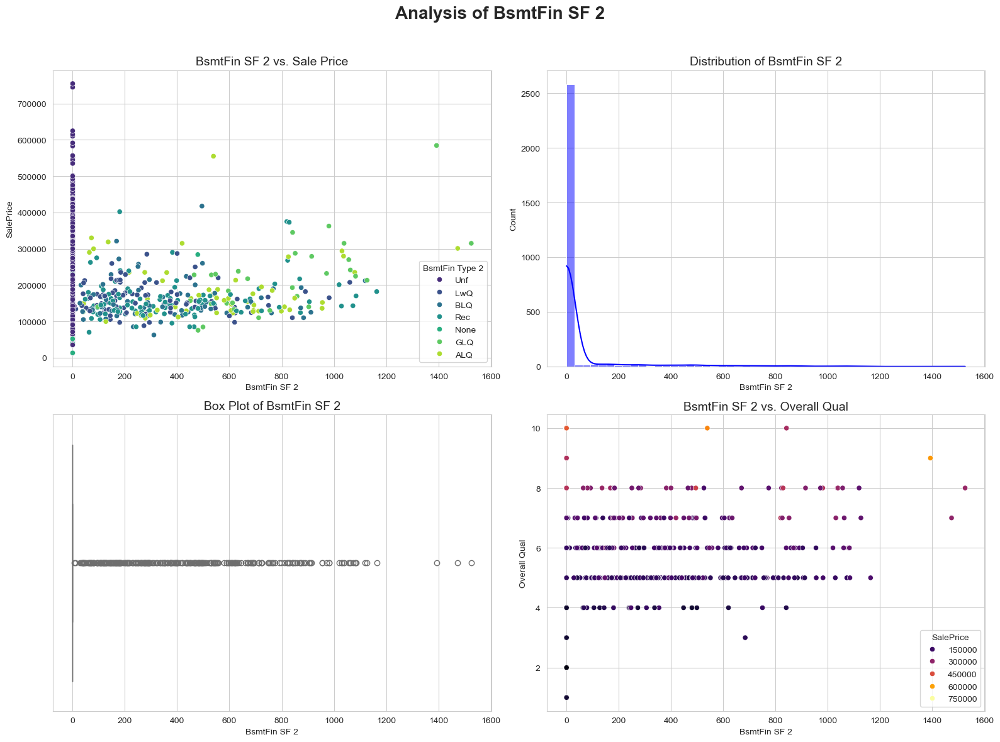

In [323]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Analysis of BsmtFin SF 2', fontsize=20, weight='bold')

sns.scatterplot(x='BsmtFin SF 2', y='SalePrice', hue='BsmtFin Type 2', legend=True ,palette='viridis', data=df, ax=axes[0,0])
axes[0,0].set_title('BsmtFin SF 2 vs. Sale Price', fontsize=14)

sns.histplot(df['BsmtFin SF 2'], kde=True, color='blue', bins=50, ax=axes[0, 1])
axes[0, 1].set_title('Distribution of BsmtFin SF 2', fontsize=14)

sns.boxplot(x=df['BsmtFin SF 2'], color='lightcoral', ax=axes[1, 0])
axes[1, 0].set_title('Box Plot of BsmtFin SF 2', fontsize=14)

sns.scatterplot(x='BsmtFin SF 2', y='Overall Qual', hue='SalePrice', legend=True ,palette='inferno', data=df, ax=axes[1,1])
axes[1, 1].set_title('BsmtFin SF 2 vs. Overall Qual', fontsize=14)

plt.tight_layout(rect=[0, 0, 1, 0.96])

In [324]:
# Most of the houses do not have second finished basement
Outliers_BsmtFin_SF_2 = detect_outliers_IQR(df['BsmtFin SF 2'])
print(Outliers_BsmtFin_SF_2)
print('Number of data:',len(Outliers_BsmtFin_SF_2['index']))

# These samples are not actual outliers. Because they are true values in this concept so they can be solved by Log transform 

#intfloat_features_outliers['index'].extend(Outliers_BsmtFin_SF_2['index'])
#intfloat_features_outliers['value'].extend(Outliers_BsmtFin_SF_2['value'])

{'index': [1, 14, 19, 21, 26, 75, 78, 85, 89, 91, 97, 113, 118, 126, 131, 132, 137, 140, 155, 156, 159, 161, 162, 164, 166, 167, 173, 177, 194, 196, 205, 221, 222, 226, 234, 236, 259, 261, 270, 279, 293, 314, 328, 330, 335, 339, 386, 387, 394, 398, 400, 405, 411, 412, 423, 444, 486, 500, 504, 531, 537, 546, 549, 554, 561, 562, 563, 564, 574, 582, 583, 587, 591, 595, 598, 603, 605, 606, 608, 613, 631, 634, 636, 637, 638, 639, 643, 646, 663, 668, 679, 682, 683, 722, 759, 760, 770, 776, 785, 795, 799, 800, 802, 834, 838, 854, 855, 894, 904, 914, 926, 928, 929, 931, 937, 946, 951, 955, 956, 964, 979, 980, 981, 984, 988, 989, 991, 1018, 1020, 1021, 1023, 1024, 1034, 1036, 1047, 1056, 1107, 1132, 1147, 1149, 1156, 1177, 1179, 1183, 1189, 1191, 1194, 1199, 1201, 1209, 1213, 1217, 1225, 1229, 1235, 1236, 1237, 1246, 1247, 1270, 1271, 1272, 1281, 1299, 1300, 1327, 1337, 1345, 1350, 1355, 1366, 1372, 1375, 1384, 1392, 1401, 1413, 1417, 1427, 1429, 1444, 1447, 1449, 1471, 1488, 1492, 1494, 1522, 

Text(0.5, 1.0, 'Transformed Distribution (More Normal)')

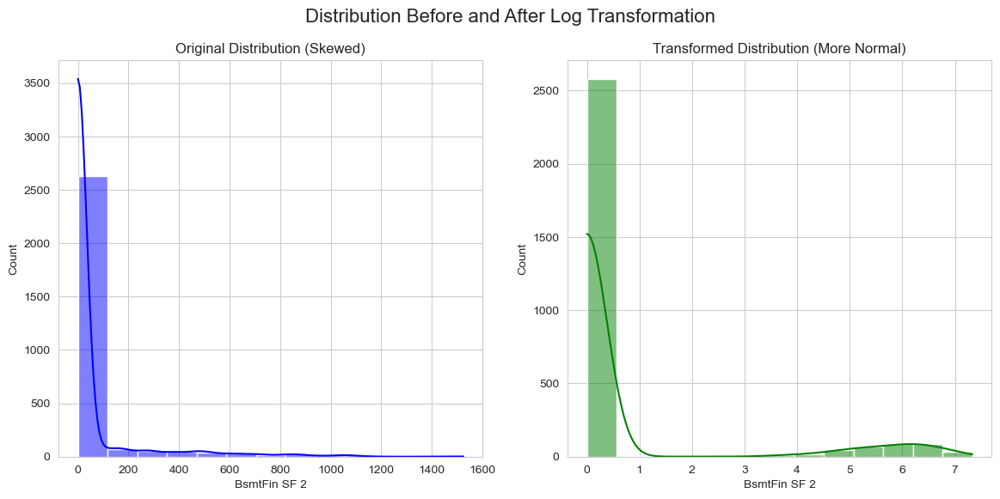

In [325]:
BsmtFin_SF_2_log1p = np.log1p(df['BsmtFin SF 2'])

# Create a figure with two subplots, side-by-side
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('Distribution Before and After Log Transformation', fontsize=16)

# Plot Original Distribution
sns.histplot(df['BsmtFin SF 2'], kde=True, ax=axes[0], color='blue')
axes[0].set_title('Original Distribution (Skewed)')

# Plot Transformed Distribution
sns.histplot(BsmtFin_SF_2_log1p, kde=True, ax=axes[1], color='green')
axes[1].set_title('Transformed Distribution (More Normal)')

In [326]:
df['Transformed BsmtFin SF 2'] = np.round(BsmtFin_SF_2_log1p, decimals=2)
df = df.drop(['BsmtFin SF 2'], axis=1)

#### Bsmt Unf SF

In [327]:
df['Bsmt Unf SF'].unique()

array([ 441.,  270.,  406., ...,   45., 1503.,  239.])

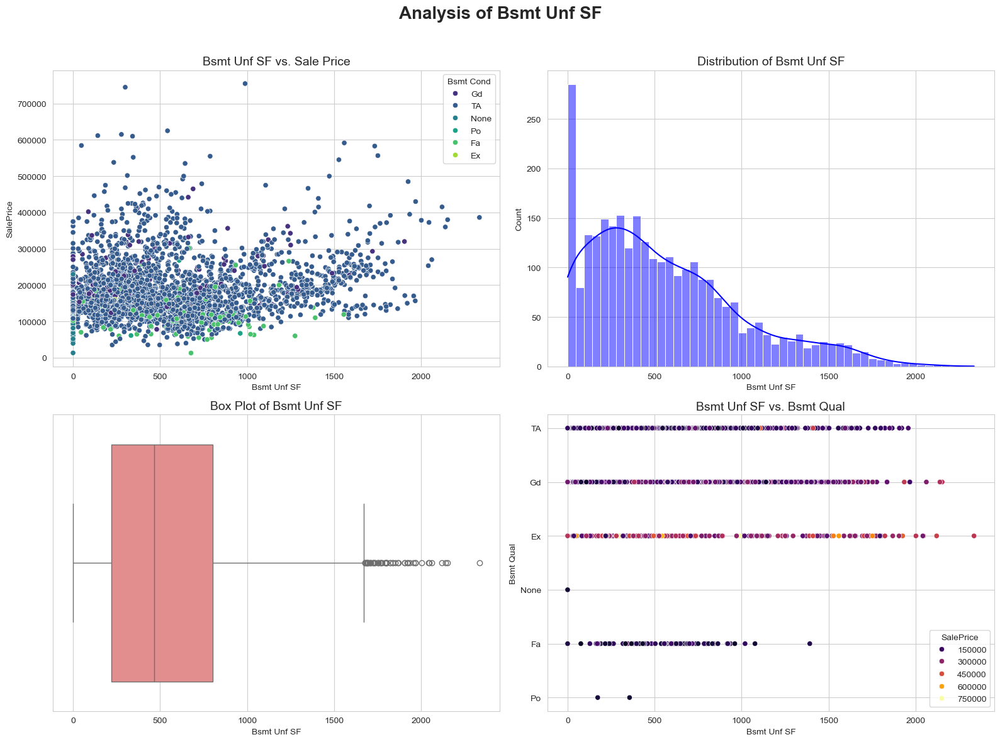

In [328]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Analysis of Bsmt Unf SF', fontsize=20, weight='bold')

sns.scatterplot(x='Bsmt Unf SF', y='SalePrice', hue='Bsmt Cond', legend=True ,palette='viridis', data=df, ax=axes[0,0])
axes[0,0].set_title('Bsmt Unf SF vs. Sale Price', fontsize=14)

sns.histplot(df['Bsmt Unf SF'], kde=True, color='blue', bins=50, ax=axes[0, 1])
axes[0, 1].set_title('Distribution of Bsmt Unf SF', fontsize=14)

sns.boxplot(x=df['Bsmt Unf SF'], color='lightcoral', ax=axes[1, 0])
axes[1, 0].set_title('Box Plot of Bsmt Unf SF', fontsize=14)

sns.scatterplot(x='Bsmt Unf SF', y='Bsmt Qual', hue='SalePrice', legend=True ,palette='inferno', data=df, ax=axes[1,1])
axes[1, 1].set_title('Bsmt Unf SF vs. Bsmt Qual', fontsize=14)

plt.tight_layout(rect=[0, 0, 1, 0.96])

In [329]:
Outliers_Bsmt_Unf_SF = detect_outliers_IQR(df['Bsmt Unf SF'])
print(Outliers_Bsmt_Unf_SF)
print('Number of data:',len(Outliers_Bsmt_Unf_SF['index']))

# These samples are not actual outliers. Because they are true values in this concept so they can be solved by Log transform 

#intfloat_features_outliers['index'].extend(Outliers_Bsmt_Unf_SF['index'])
#intfloat_features_outliers['value'].extend(Outliers_Bsmt_Unf_SF['value'])

{'index': [42, 217, 249, 313, 321, 367, 422, 426, 433, 434, 437, 447, 507, 527, 568, 641, 825, 864, 899, 948, 1068, 1195, 1253, 1277, 1453, 1685, 1686, 1687, 1690, 1696, 1697, 1700, 1706, 1707, 1724, 1772, 1777, 1782, 1785, 1803, 1870, 1967, 2099, 2226, 2259, 2275, 2309, 2322, 2332, 2383, 2699, 2717, 2793, 2801, 2890, 2894], 'value': [1794.0, 1768.0, 1694.0, 1958.0, 2002.0, 2046.0, 1926.0, 2042.0, 1734.0, 1736.0, 1709.0, 2336.0, 1696.0, 1836.0, 1726.0, 1866.0, 1800.0, 1753.0, 1678.0, 1710.0, 1765.0, 1728.0, 1824.0, 1800.0, 1777.0, 1774.0, 1694.0, 1694.0, 2121.0, 1935.0, 2153.0, 1704.0, 1802.0, 1706.0, 1869.0, 1969.0, 1905.0, 1795.0, 1689.0, 1685.0, 1680.0, 1800.0, 2140.0, 1680.0, 1689.0, 1824.0, 1851.0, 2062.0, 1752.0, 1721.0, 1921.0, 1967.0, 1753.0, 1836.0, 1907.0, 1686.0]}
Number of data: 56


Text(0.5, 1.0, 'Transformed Distribution (More Normal)')

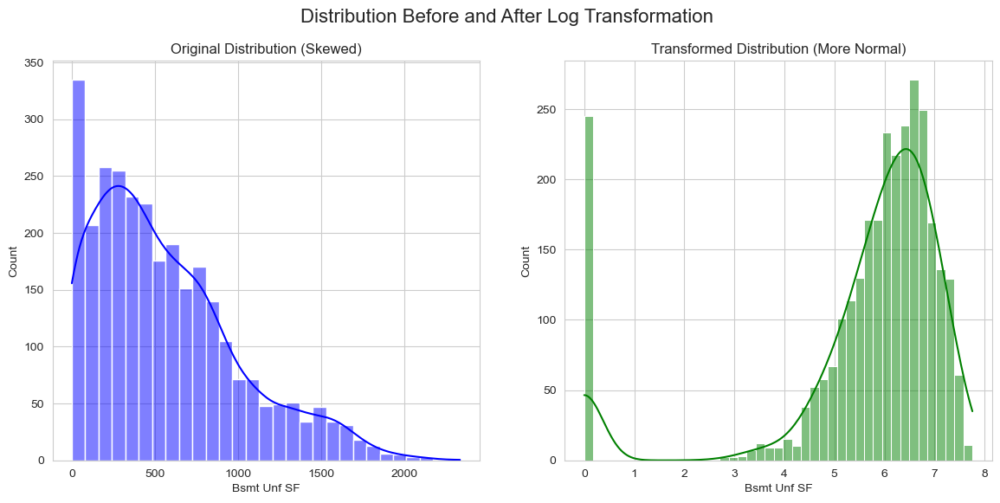

In [330]:
Bsmt_Unf_SF_log1p = np.log1p(df['Bsmt Unf SF'])

# Create a figure with two subplots, side-by-side
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('Distribution Before and After Log Transformation', fontsize=16)

# Plot Original Distribution
sns.histplot(df['Bsmt Unf SF'], kde=True, ax=axes[0], color='blue')
axes[0].set_title('Original Distribution (Skewed)')

# Plot Transformed Distribution
sns.histplot(Bsmt_Unf_SF_log1p, kde=True, ax=axes[1], color='green')
axes[1].set_title('Transformed Distribution (More Normal)')

In [331]:
df['Transformed Bsmt Unf SF'] = np.round(Bsmt_Unf_SF_log1p, decimals=2)
df = df.drop(['Bsmt Unf SF'], axis=1)

#### Total Bsmt SF

In [332]:
df['Total Bsmt SF'].unique()

array([1080.,  882., 1329., ..., 1381.,  757., 1003.])

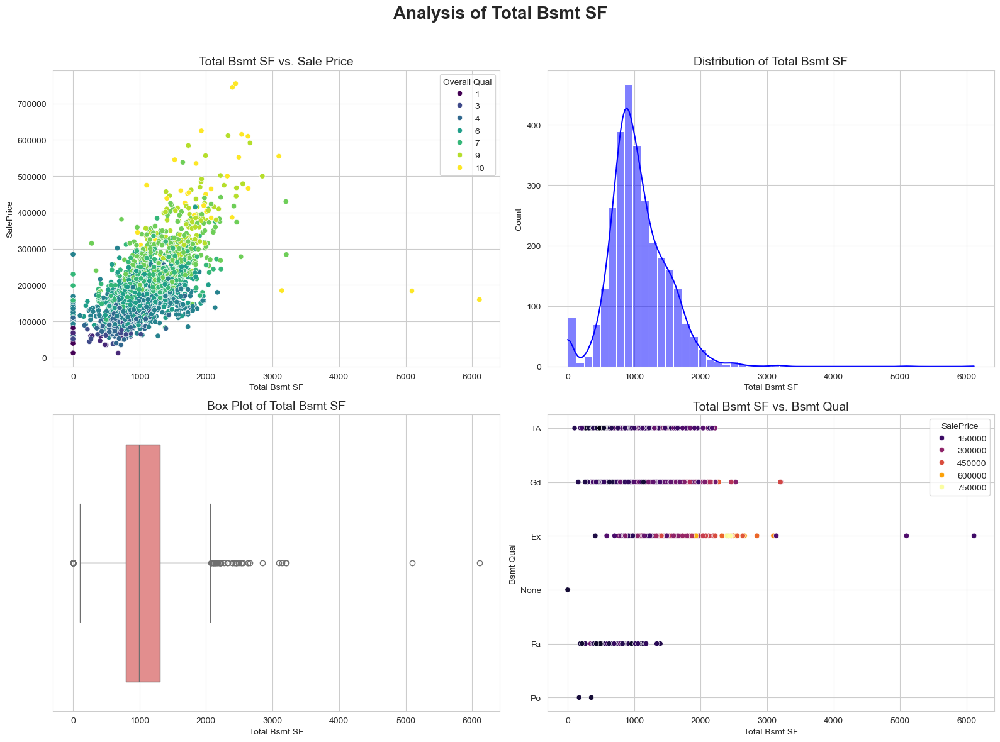

In [333]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Analysis of Total Bsmt SF', fontsize=20, weight='bold')

sns.scatterplot(x='Total Bsmt SF', y='SalePrice', hue='Overall Qual', legend=True ,palette='viridis', data=df, ax=axes[0,0])
axes[0,0].set_title('Total Bsmt SF vs. Sale Price', fontsize=14)

sns.histplot(df['Total Bsmt SF'], kde=True, color='blue', bins=50, ax=axes[0, 1])
axes[0, 1].set_title('Distribution of Total Bsmt SF', fontsize=14)

sns.boxplot(x=df['Total Bsmt SF'], color='lightcoral', ax=axes[1, 0])
axes[1, 0].set_title('Box Plot of Total Bsmt SF', fontsize=14)

sns.scatterplot(x='Total Bsmt SF', y='Bsmt Qual', hue='SalePrice', legend=True ,palette='inferno', data=df, ax=axes[1,1])
axes[1, 1].set_title('Total Bsmt SF vs. Bsmt Qual', fontsize=14)

plt.tight_layout(rect=[0, 0, 1, 0.96])

In [334]:
Outliers_Total_Bsmt_SF = detect_outliers_IQR(df['Total Bsmt SF'])
print(Outliers_Total_Bsmt_SF)
print('Number of data:',len(Outliers_Total_Bsmt_SF['index']))

# These samples are not actual outliers. Because they are true values in this concept so they can be solved by Log transform 

#intfloat_features_outliers['index'].extend(Outliers_Total_Bsmt_SF['index'])
#intfloat_features_outliers['value'].extend(Outliers_Total_Bsmt_SF['value'])

{'index': [3, 44, 46, 83, 154, 206, 243, 273, 275, 290, 349, 366, 379, 423, 432, 444, 447, 448, 456, 457, 513, 551, 649, 676, 678, 708, 780, 786, 787, 794, 802, 806, 807, 809, 810, 811, 812, 814, 884, 887, 896, 898, 945, 952, 956, 959, 970, 1052, 1056, 1063, 1105, 1204, 1219, 1251, 1254, 1259, 1268, 1325, 1341, 1343, 1374, 1425, 1497, 1498, 1500, 1501, 1503, 1506, 1553, 1568, 1613, 1614, 1637, 1641, 1689, 1690, 1695, 1697, 1701, 1760, 1763, 1767, 1772, 1817, 1860, 1879, 1886, 1898, 1901, 1968, 2003, 2004, 2070, 2081, 2088, 2099, 2176, 2180, 2181, 2184, 2212, 2241, 2278, 2337, 2382, 2456, 2487, 2561, 2592, 2616, 2621, 2622, 2624, 2625, 2626, 2679, 2700, 2702, 2706, 2739, 2744, 2879, 2892, 2903], 'value': [2110.0, 2330.0, 2846.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2208.0, 2216.0, 2524.0, 3094.0, 2630.0, 3206.0, 2392.0, 2452.0, 2492.0, 2200.0, 2458.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2158.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2136.0, 2190.0, 0.0, 

Text(0.5, 1.0, 'Transformed Distribution (More Normal)')

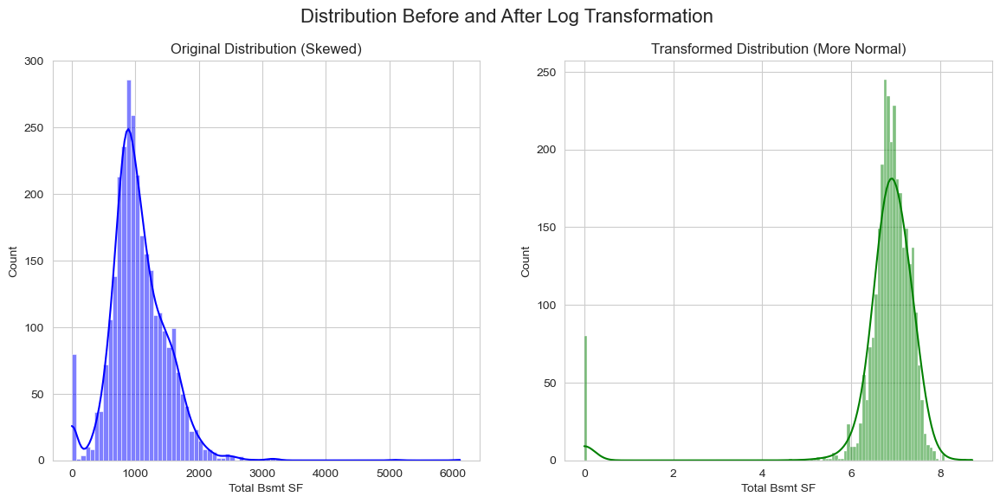

In [335]:
Total_Bsmt_SF_log1p = np.log1p(df['Total Bsmt SF'])

# Create a figure with two subplots, side-by-side
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('Distribution Before and After Log Transformation', fontsize=16)

# Plot Original Distribution
sns.histplot(df['Total Bsmt SF'], kde=True, ax=axes[0], color='blue')
axes[0].set_title('Original Distribution (Skewed)')

# Plot Transformed Distribution
sns.histplot(Total_Bsmt_SF_log1p, kde=True, ax=axes[1], color='green')
axes[1].set_title('Transformed Distribution (More Normal)')

In [336]:
df['Transformed Total Bsmt SF'] = np.round(Total_Bsmt_SF_log1p, decimals=2)
df = df.drop(['Total Bsmt SF'], axis=1)

#### Bsmt Full Bath

In [337]:
df['Bsmt Full Bath'].unique()

array([1., 0., 2., 3.])

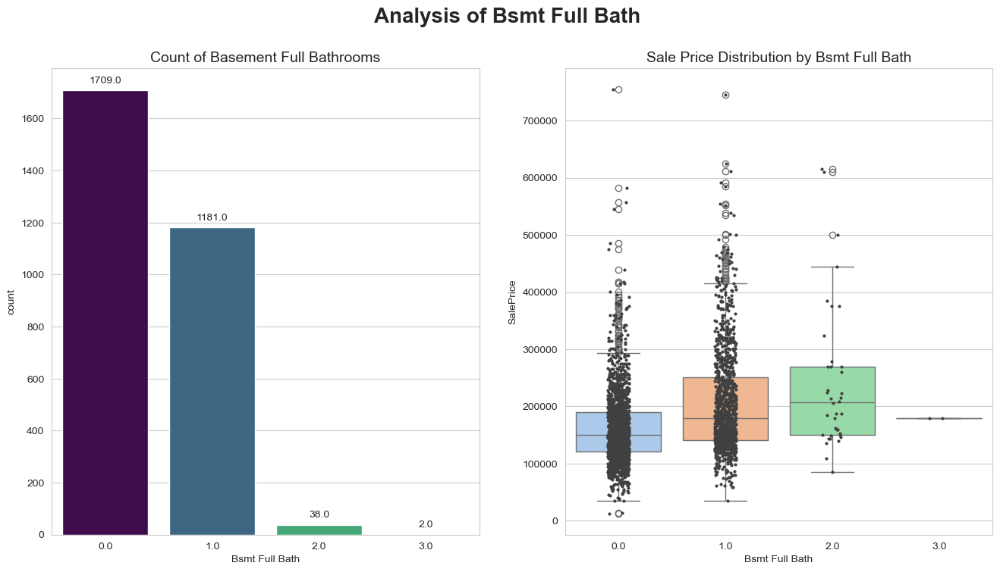

In [338]:
fig, axes = plt.subplots(1, 2, figsize=(16, 8))
fig.suptitle('Analysis of Bsmt Full Bath', fontsize=20, weight='bold')

ax1 = sns.countplot(x='Bsmt Full Bath', hue='Bsmt Full Bath', legend=False,data=df, palette='viridis', ax=axes[0])
axes[0].set_title('Count of Basement Full Bathrooms', fontsize=14)
for p in ax1.patches:
    ax1.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 9), textcoords='offset points')
    

sns.boxplot(x='Bsmt Full Bath', y='SalePrice', hue='Bsmt Full Bath', legend=False,data=df, palette='pastel', ax=axes[1])
sns.stripplot(x='Bsmt Full Bath', y='SalePrice', data=df, color=".25", size=3, ax=axes[1])
axes[1].set_title('Sale Price Distribution by Bsmt Full Bath', fontsize=14)

plt.show()

In [339]:
Outliers_Bsmt_Full_Bath = detect_outliers_freq(df['Bsmt Full Bath'])
print(Outliers_Bsmt_Full_Bath)
print('Number of data:',len(Outliers_Bsmt_Full_Bath['index']))

# These samples are not actual outliers. Because they are true values in this concept.

#intfloat_features_outliers['index'].extend(Outliers_Bsmt_Full_Bath['index'])
#intfloat_features_outliers['value'].extend(Outliers_Bsmt_Full_Bath['value'])

{'index': [762, 763], 'value': [3.0, 3.0]}
Number of data: 2


#### Bsmt Half Bath

In [340]:
df['Bsmt Half Bath'].unique()

array([0., 1., 2.])

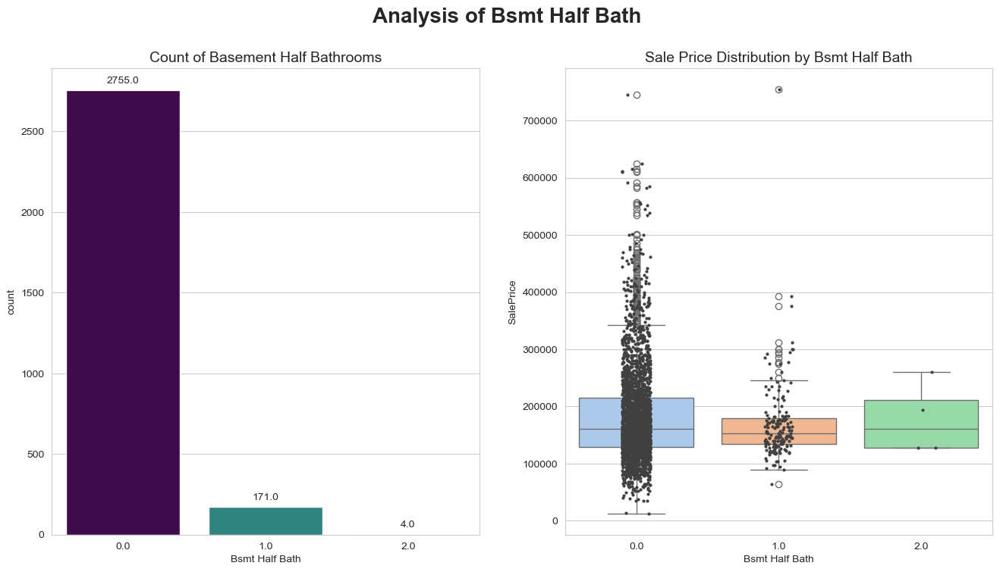

In [341]:
fig, axes = plt.subplots(1, 2, figsize=(16, 8))
fig.suptitle('Analysis of Bsmt Half Bath', fontsize=20, weight='bold')

ax1 = sns.countplot(x='Bsmt Half Bath', hue='Bsmt Half Bath', legend=False,data=df, palette='viridis', ax=axes[0])
axes[0].set_title('Count of Basement Half Bathrooms', fontsize=14)
for p in ax1.patches:
    ax1.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 9), textcoords='offset points')
    

sns.boxplot(x='Bsmt Half Bath', y='SalePrice', hue='Bsmt Half Bath', legend=False,data=df, palette='pastel', ax=axes[1])
sns.stripplot(x='Bsmt Half Bath', y='SalePrice', data=df, color=".25", size=3, ax=axes[1])
axes[1].set_title('Sale Price Distribution by Bsmt Half Bath', fontsize=14)

plt.show()

In [342]:
Outliers_Bsmt_Half_Bath = detect_outliers_freq(df['Bsmt Half Bath'])
print(Outliers_Bsmt_Half_Bath)
print('Number of data:',len(Outliers_Bsmt_Half_Bath['index']))

# These samples are not actual outliers. Because they are true values in this concept.

#intfloat_features_outliers['index'].extend(Outliers_Bsmt_Half_Bath['index'])
#intfloat_features_outliers['value'].extend(Outliers_Bsmt_Half_Bath['value'])

{'index': [1742, 2498, 2819, 2820], 'value': [2.0, 2.0, 2.0, 2.0]}
Number of data: 4


#### Garage Yr Blt

In [343]:
df['Garage Yr Blt'].unique()

array([1960., 1961., 1958., 1968., 1997., 1998., 2001., 1992., 1995.,
       1999., 1993., 1990., 1985., 2003., 1988., 2010., 1951., 1978.,
       1977., 1974., 2000., 1970., 1971.,    0., 1975., 2009., 2008.,
       2005., 2004., 2002., 2006., 1996., 1994., 1980., 1979., 1984.,
       1986., 1920., 1987., 1973., 1963., 1962., 1976., 1967., 1972.,
       1966., 1964., 1950., 1949., 1954., 1955., 1959., 1957., 1956.,
       1952., 1953., 1989., 1948., 1900., 1927., 1915., 1945., 1940.,
       1938., 1928., 1930., 1926., 1939., 1942., 1923., 1917., 1910.,
       1965., 1969., 1947., 1946., 1941., 1924., 1922., 1896., 2007.,
       1983., 1981., 1991., 1982., 1916., 1925., 1936., 1935., 1931.,
       1934., 1929., 1918., 1921., 1937., 1932., 1906., 1908., 1895.,
       1933., 2207., 1914., 1943., 1919.])

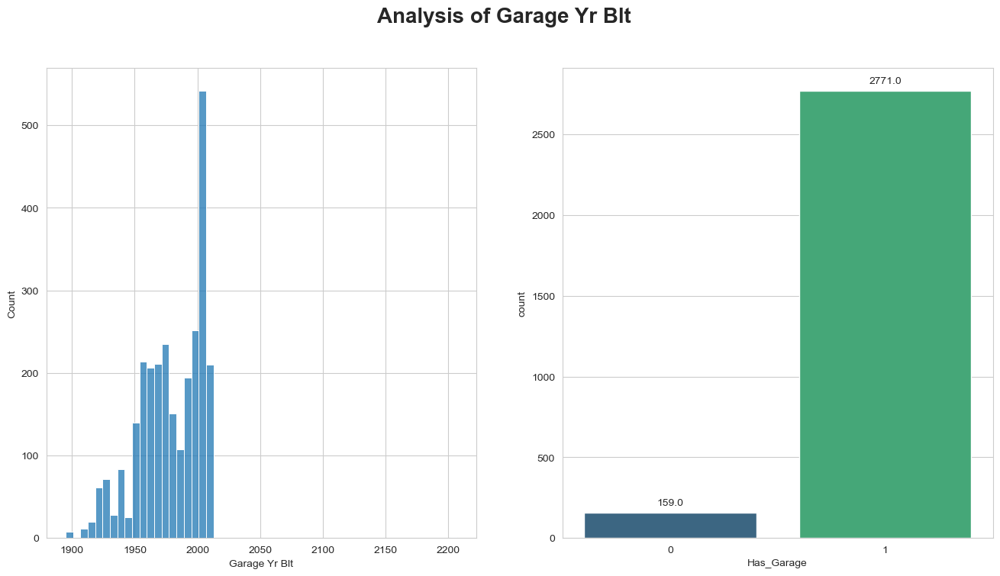

In [344]:
House_With_Without_Garage = pd.DataFrame((df['Garage Yr Blt'] > 0).astype(int).values, columns=['Has_Garage'])
House_Has_Garage_Yr_Blt = df[df['Garage Yr Blt'] > 0].copy()

fig, axes = plt.subplots(1, 2, figsize=(16, 8))
fig.suptitle('Analysis of Garage Yr Blt', fontsize=20, weight='bold')

ax1 = sns.histplot(x='Garage Yr Blt', data=House_Has_Garage_Yr_Blt, ax=axes[0])
    
ax2 = sns.countplot(x='Has_Garage', hue='Has_Garage', legend=False,data=House_With_Without_Garage, palette='viridis', ax=axes[1])
for p in ax2.patches:
    ax2.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 9), textcoords='offset points')

In [345]:
# In the Handling Missing Values part, NaN values are converted to zero. So, for finding outliers, samples with zero years are separated.
Outliers_Garage_Yr_Blt = detect_outliers_IQR(df.loc[df['Garage Yr Blt'] > 0,'Garage Yr Blt'])
print('Note: Because of removing the samples with zero value, the indexes are not relaibale\n',Outliers_Garage_Yr_Blt)
print('Number of data:',len(Outliers_Garage_Yr_Blt['index']))

#intfloat_features_outliers['index'].extend(Outliers_Garage_Yr_Blt['index'])
#intfloat_features_outliers['value'].extend(Outliers_Garage_Yr_Blt['value'])

Note: Because of removing the samples with zero value, the indexes are not relaibale
 {'index': [288, 1463, 2140], 'value': [1896.0, 1895.0, 2207.0]}
Number of data: 3


In [346]:
# The sample that its Garage Yr Blt features is 2207.0 must be corrected
df.loc[df['Garage Yr Blt'] == 2207,'Garage Yr Blt'] = df.loc[df['Garage Yr Blt'] == 2207,'Year Built'].values[0]


#### Garage Cars

In [347]:
df['Garage Cars'].unique()

array([2., 1., 3., 0., 4., 5.])

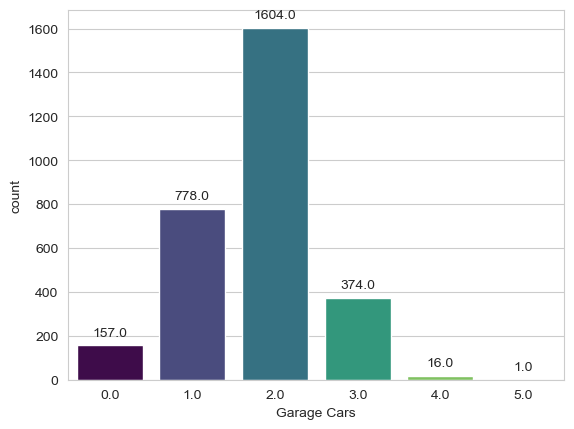

In [348]:
ax1 = sns.countplot(x='Garage Cars', hue='Garage Cars', legend=False,data=df, palette='viridis')
for p in ax1.patches:
    ax1.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 9), textcoords='offset points')

In [349]:
Outliers_Garage_Cars = detect_outliers_freq(df['Garage Cars'])
print(Outliers_Garage_Cars)
print('Number of data:',len(Outliers_Garage_Cars['index']))

# These samples are not actual outliers. Because they are true values in this concept.

#intfloat_features_outliers['index'].extend(Outliers_Garage_Cars['index'])
#intfloat_features_outliers['value'].extend(Outliers_Garage_Cars['value'])

{'index': [246, 669, 716, 815, 816, 817, 1027, 1059, 1258, 1588, 1589, 1668, 2278, 2282, 2749, 2904, 746], 'value': [4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 5.0]}
Number of data: 17


#### Garage Area

In [350]:
df['Garage Area'].unique()

array([ 528.,  730.,  312.,  522.,  482.,  470.,  582.,  506.,  608.,
        442.,  440.,  420.,  393.,  841.,  492.,  834.,  400.,  500.,
        546.,  663.,  480.,  304.,  525.,    0.,  511.,  264.,  320.,
        308.,  751.,  772.,  606.,  868.,  532.,  678.,  820.,  484.,
        958.,  756.,  576.,  474.,  430.,  437.,  433.,  434.,  779.,
        962.,  527.,  712.,  671.,  486.,  666.,  880.,  676.,  614.,
        750.,  618.,  463.,  462.,  457.,  476.,  429.,  539.,  336.,
        280.,  260.,  461.,  564.,  762.,  713.,  588.,  496.,  852.,
        592.,  475.,  596.,  535.,  660.,  441.,  490.,  504.,  517.,
        240.,  364.,  244.,  315.,  578.,  620.,  447.,  294.,  531.,
        263.,  318.,  305.,  246.,  392.,  330.,  720.,  360.,  551.,
        379.,  220.,  780.,  288.,  416.,  624.,  923.,  560.,  363.,
        200.,  572.,  180.,  516.,  672.,  349.,  365.,  231.,  450.,
        270.,  299.,  591.,  533.,  690.,  436.,  586.,  366.,  467.,
        209.,  460.,

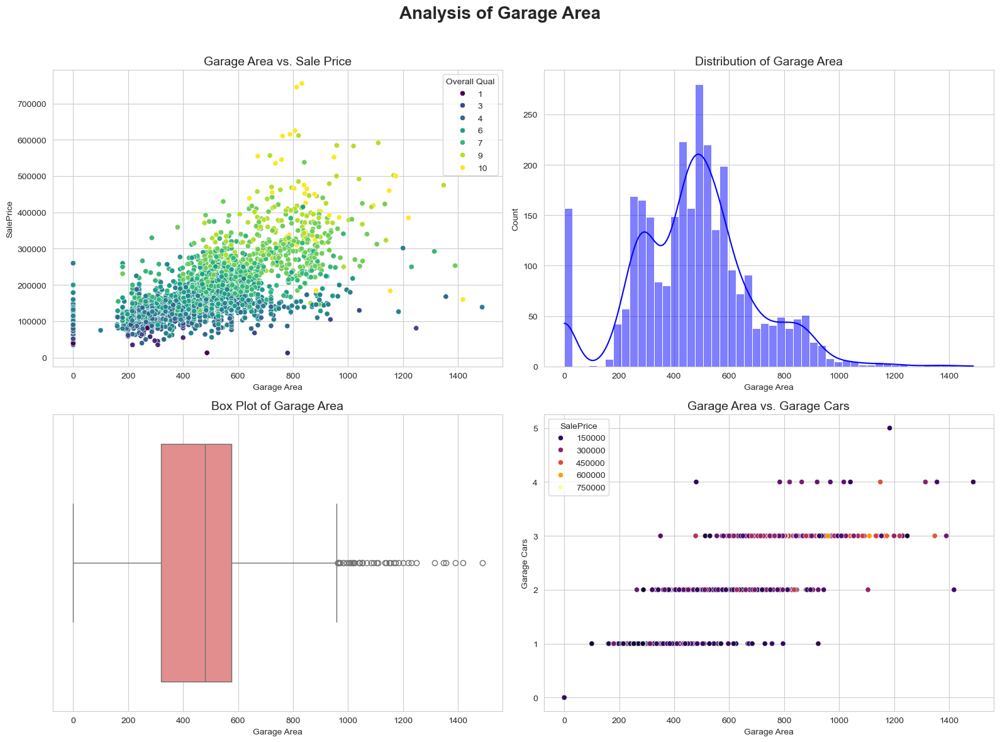

In [351]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Analysis of Garage Area', fontsize=20, weight='bold')

sns.scatterplot(x='Garage Area', y='SalePrice', hue='Overall Qual', legend=True ,palette='viridis', data=df, ax=axes[0,0])
axes[0,0].set_title('Garage Area vs. Sale Price', fontsize=14)

sns.histplot(df['Garage Area'], kde=True, color='blue', bins=50, ax=axes[0, 1])
axes[0, 1].set_title('Distribution of Garage Area', fontsize=14)

sns.boxplot(x=df['Garage Area'], color='lightcoral', ax=axes[1, 0])
axes[1, 0].set_title('Box Plot of Garage Area', fontsize=14)

sns.scatterplot(x='Garage Area', y='Garage Cars', hue='SalePrice', legend=True ,palette='inferno', data=df, ax=axes[1,1])
axes[1, 1].set_title('Garage Area vs. Garage Cars', fontsize=14)

plt.tight_layout(rect=[0, 0, 1, 0.96])

In [352]:
Outliers_Garage_Area = detect_outliers_IQR(df['Garage Area'])
print(Outliers_Garage_Area)
print('Number of data:',len(Outliers_Garage_Area['index']))

# These samples are not actual outliers. Because they are true values in this concept so they can be solved by Log transform 

#intfloat_features_outliers['index'].extend(Outliers_Garage_Area['index'])
#intfloat_features_outliers['value'].extend(Outliers_Garage_Area['value'])

{'index': [60, 246, 366, 426, 433, 447, 497, 507, 520, 525, 669, 746, 818, 862, 1027, 1052, 1059, 1060, 1070, 1106, 1258, 1425, 1498, 1537, 1557, 1637, 1691, 1701, 1780, 1797, 1852, 1945, 2097, 2180, 2273, 2278, 2282, 2307, 2384, 2456, 2463, 2592], 'value': [962.0, 1017.0, 1166.0, 1390.0, 1020.0, 968.0, 1069.0, 972.0, 984.0, 1043.0, 968.0, 1184.0, 1138.0, 1231.0, 1314.0, 1220.0, 1150.0, 1003.0, 1052.0, 983.0, 1488.0, 1348.0, 1418.0, 1014.0, 1248.0, 1110.0, 1040.0, 1174.0, 1092.0, 1025.0, 1105.0, 1200.0, 1052.0, 1154.0, 995.0, 1041.0, 1356.0, 963.0, 1085.0, 1134.0, 1053.0, 1008.0]}
Number of data: 42


Text(0.5, 1.0, 'Transformed Distribution (More Normal)')

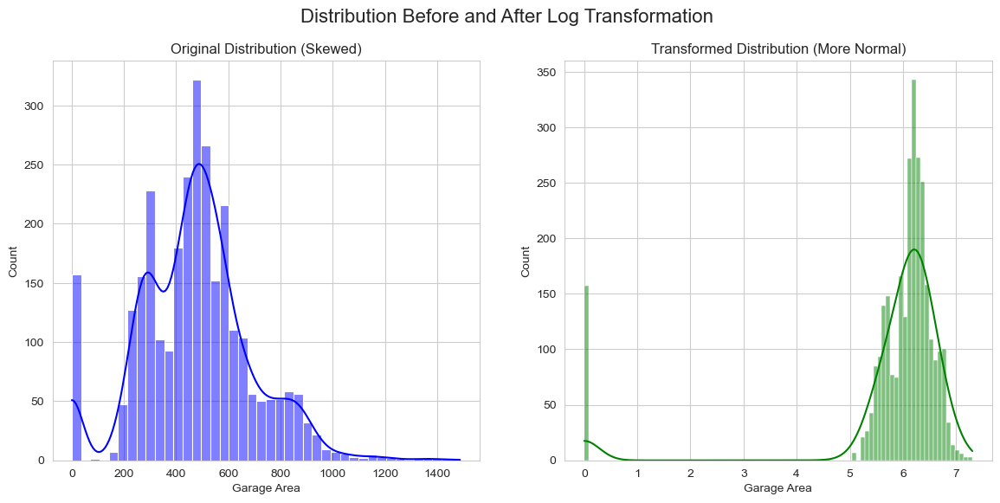

In [353]:
Garage_Area_log1p = np.log1p(df['Garage Area'])

# Create a figure with two subplots, side-by-side
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('Distribution Before and After Log Transformation', fontsize=16)

# Plot Original Distribution
sns.histplot(df['Garage Area'], kde=True, ax=axes[0], color='blue')
axes[0].set_title('Original Distribution (Skewed)')

# Plot Transformed Distribution
sns.histplot(Garage_Area_log1p, kde=True, ax=axes[1], color='green')
axes[1].set_title('Transformed Distribution (More Normal)')

In [354]:
df['Transformed Garage Area'] = np.round(Garage_Area_log1p, decimals=2)
df = df.drop(['Garage Area'], axis=1)

In [355]:
df.select_dtypes(['int64']).columns

Index(['Order', 'PID', 'MS SubClass', 'Lot Area', 'Overall Qual',
       'Overall Cond', 'Year Built', 'Year Remod/Add', '1st Flr SF',
       '2nd Flr SF', 'Low Qual Fin SF', 'Gr Liv Area', 'Full Bath',
       'Half Bath', 'Bedroom AbvGr', 'Kitchen AbvGr', 'TotRms AbvGrd',
       'Fireplaces', 'Wood Deck SF', 'Open Porch SF', 'Enclosed Porch',
       '3Ssn Porch', 'Screen Porch', 'Pool Area', 'Misc Val', 'Mo Sold',
       'Yr Sold', 'SalePrice'],
      dtype='object')

#### MS SubClass

In [356]:
df['MS SubClass'].unique()

array([ 20,  60, 120,  50,  85, 160,  80,  30,  90, 190,  45,  70,  75,
        40, 180, 150], dtype=int64)

Text(0.5, 1.0, 'Sale Price Distribution by MS SubClass')

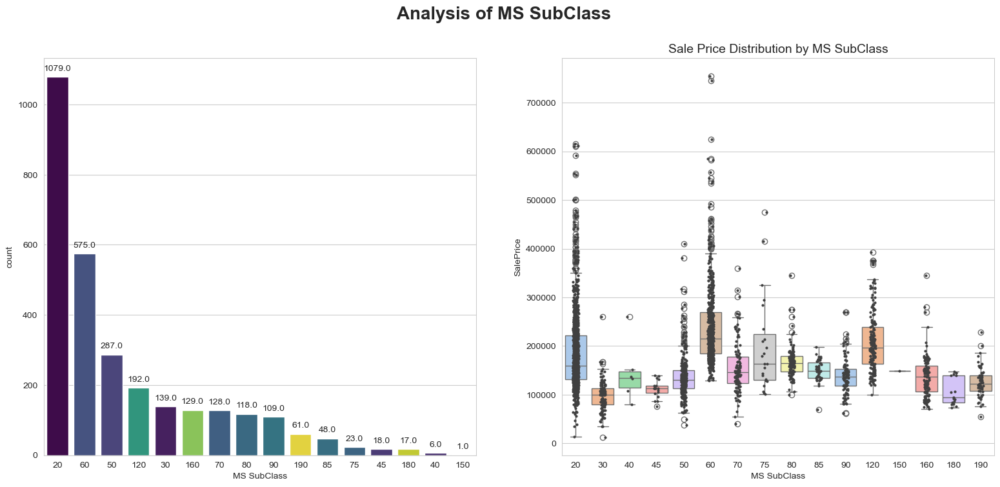

In [357]:
fig, axes = plt.subplots(1, 2, figsize=(19, 8))
fig.suptitle('Analysis of MS SubClass', fontsize=20, weight='bold')

order = df['MS SubClass'].value_counts().index
ax1 = sns.countplot(x='MS SubClass', hue='MS SubClass', legend=False,data=df, palette='viridis', ax=axes[0],order=order)

for p in ax1.patches:
    ax1.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 9), textcoords='offset points')
    

sns.boxplot(x='MS SubClass', y='SalePrice', hue='MS SubClass', legend=False,data=df, palette='pastel', ax=axes[1])
sns.stripplot(x='MS SubClass', y='SalePrice', data=df, color=".25", size=3, ax=axes[1])
axes[1].set_title('Sale Price Distribution by MS SubClass', fontsize=14)

In [358]:
Outliers_MS_SubClass = detect_outliers_IQR(df['MS SubClass'])
print(Outliers_MS_SubClass)
print('Number of data:',len(Outliers_MS_SubClass['index']))

# These samples are not actual outliers. Because they are true values in this concept.

#intfloat_features_outliers['index'].extend(Outliers_MS_SubClass['index'])
#intfloat_features_outliers['value'].extend(Outliers_MS_SubClass['value'])

{'index': [29, 30, 31, 33, 35, 50, 94, 95, 96, 97, 98, 100, 101, 102, 103, 151, 186, 189, 206, 207, 211, 214, 218, 283, 326, 328, 329, 330, 331, 332, 402, 403, 404, 405, 406, 407, 409, 410, 412, 413, 414, 415, 416, 463, 547, 565, 566, 567, 570, 571, 572, 573, 650, 700, 706, 712, 757, 760, 892, 932, 933, 934, 935, 973, 975, 977, 978, 979, 1039, 1040, 1041, 1042, 1043, 1044, 1045, 1047, 1077, 1078, 1152, 1160, 1162, 1163, 1164, 1165, 1166, 1172, 1173, 1175, 1176, 1177, 1221, 1259, 1291, 1296, 1307, 1312, 1316, 1369, 1375, 1386, 1395, 1414, 1415, 1499, 1504, 1515, 1542, 1543, 1570, 1594, 1595, 1596, 1597, 1599, 1600, 1632, 1638, 1675, 1676, 1677, 1678, 1679, 1681, 1815, 1841, 1842, 1843, 1844, 1845, 1846, 1847, 1848, 1993, 1998, 2037, 2041, 2047, 2048, 2057, 2182, 2194, 2217, 2225, 2242, 2282, 2285, 2286, 2287, 2288, 2289, 2290, 2322, 2327, 2338, 2364, 2365, 2366, 2367, 2368, 2369, 2370, 2371, 2372, 2377, 2506, 2507, 2508, 2509, 2510, 2511, 2512, 2513, 2523, 2544, 2548, 2592, 2604, 2634, 

#### Lot Area

In [359]:
df['Lot Area'].unique()

array([31770, 11622, 14267, ...,  7937,  8885, 10441], dtype=int64)

Text(0.5, 1.0, 'Lot Area vs. MS Zoning')

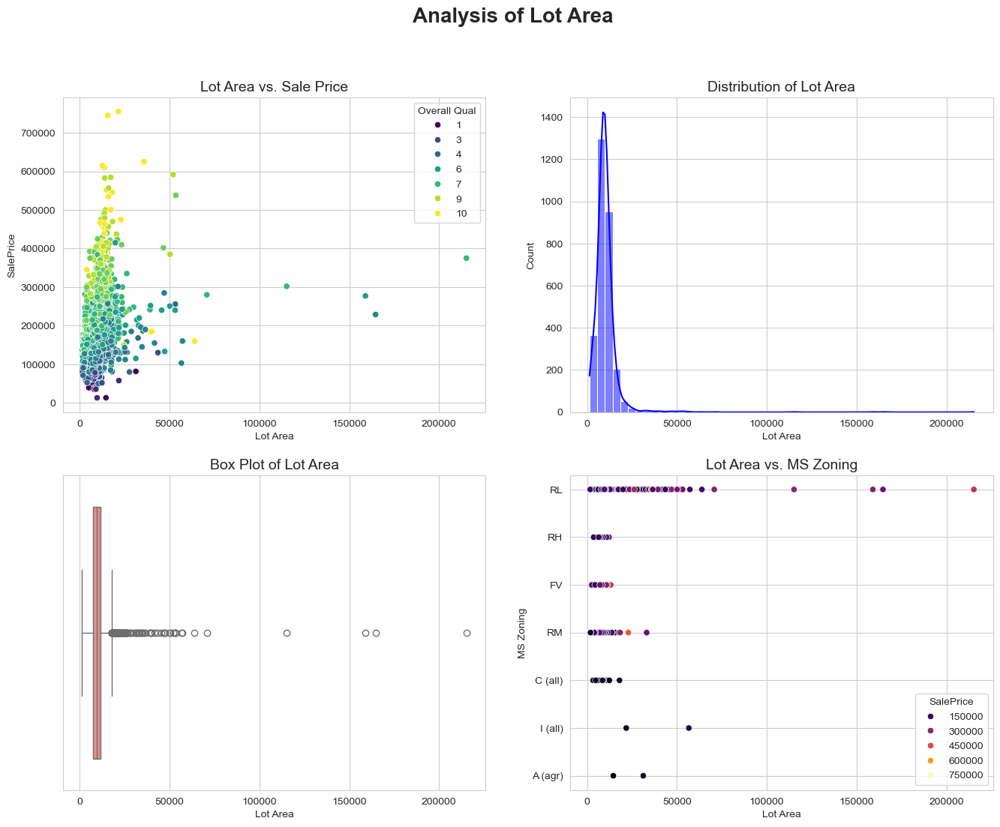

In [360]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Analysis of Lot Area', fontsize=20, weight='bold')

sns.scatterplot(x='Lot Area', y='SalePrice', hue='Overall Qual', legend=True ,palette='viridis', data=df, ax=axes[0,0])
axes[0,0].set_title('Lot Area vs. Sale Price', fontsize=14)

sns.histplot(df['Lot Area'], kde=True, color='blue', bins=50, ax=axes[0, 1])
axes[0, 1].set_title('Distribution of Lot Area', fontsize=14)

sns.boxplot(x=df['Lot Area'], color='lightcoral', ax=axes[1, 0])
axes[1, 0].set_title('Box Plot of Lot Area', fontsize=14)

sns.scatterplot(x='Lot Area', y='MS Zoning', hue='SalePrice', legend=True ,palette='inferno', data=df, ax=axes[1,1])
axes[1, 1].set_title('Lot Area vs. MS Zoning', fontsize=14)

In [361]:
Outliers_Lot_Area = detect_outliers_IQR(df['Lot Area'])
print(Outliers_Lot_Area)
print('Number of data:',len(Outliers_Lot_Area['index']))

# These samples are not actual outliers. Because they are true values in this concept so they can be solved by Log transform 

#intfloat_features_outliers['index'].extend(Outliers_Lot_Area['index'])
#intfloat_features_outliers['value'].extend(Outliers_Lot_Area['value'])

{'index': [0, 15, 18, 51, 113, 136, 208, 229, 232, 234, 297, 314, 334, 436, 491, 504, 505, 586, 639, 728, 782, 800, 806, 834, 938, 945, 956, 970, 998, 1013, 1015, 1016, 1020, 1155, 1182, 1265, 1306, 1373, 1400, 1401, 1402, 1406, 1407, 1408, 1497, 1498, 1540, 1557, 1563, 1570, 1581, 1598, 1601, 1610, 1630, 1637, 1638, 1767, 1827, 1860, 1861, 1895, 1915, 1945, 2045, 2066, 2071, 2075, 2076, 2089, 2115, 2116, 2118, 2180, 2181, 2213, 2222, 2223, 2224, 2226, 2228, 2229, 2230, 2258, 2273, 2278, 2280, 2281, 2282, 2294, 2298, 2308, 2316, 2321, 2330, 2338, 2341, 2345, 2400, 2430, 2445, 2456, 2522, 2525, 2570, 2590, 2592, 2617, 2666, 2686, 2700, 2721, 2725, 2735, 2736, 2737, 2764, 2765, 2766, 2797, 2817, 2858, 2885, 2891, 2893, 2903, 2924], 'value': [31770, 53504, 19138, 18494, 18837, 19900, 24090, 20062, 23595, 18600, 19645, 57200, 26142, 23303, 24682, 46589, 29959, 17871, 19296, 21384, 25095, 19255, 26400, 28698, 21695, 21780, 215245, 21750, 21872, 31220, 47280, 20544, 18559, 19508, 24572, 2765

Text(0.5, 1.0, 'Transformed Distribution (More Normal)')

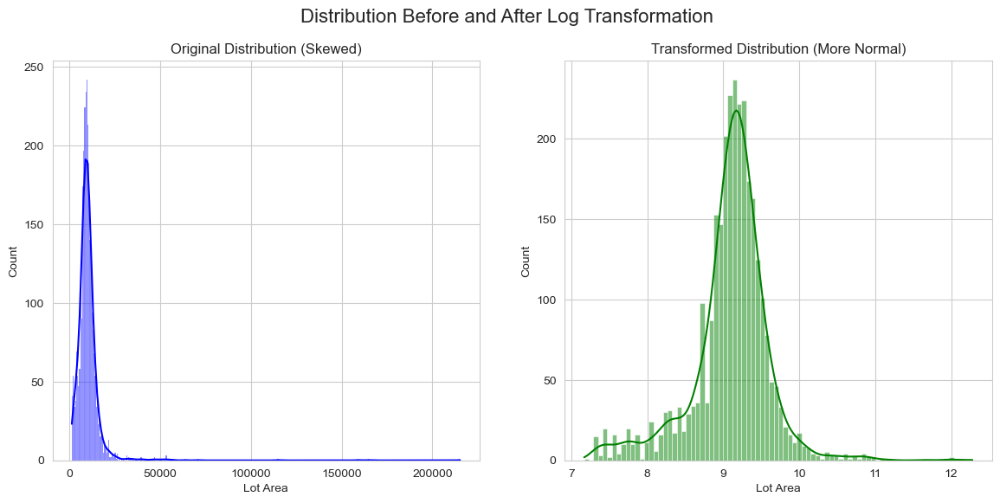

In [362]:
Lot_Area_log1p = np.log1p(df['Lot Area'])

# Create a figure with two subplots, side-by-side
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('Distribution Before and After Log Transformation', fontsize=16)

# Plot Original Distribution
sns.histplot(df['Lot Area'], kde=True, ax=axes[0], color='blue')
axes[0].set_title('Original Distribution (Skewed)')

# Plot Transformed Distribution
sns.histplot(Lot_Area_log1p, kde=True, ax=axes[1], color='green')
axes[1].set_title('Transformed Distribution (More Normal)')

In [363]:
df['Transformed Lot Area'] = np.round(Lot_Area_log1p, decimals=2)
df = df.drop(['Lot Area'], axis=1)

#### Overall Qual

In [364]:
df['Overall Qual'].unique()

array([ 6,  5,  7,  8,  9,  4,  3,  2, 10,  1], dtype=int64)

Text(0.5, 1.0, 'Sale Price Distribution by Overall Qual')

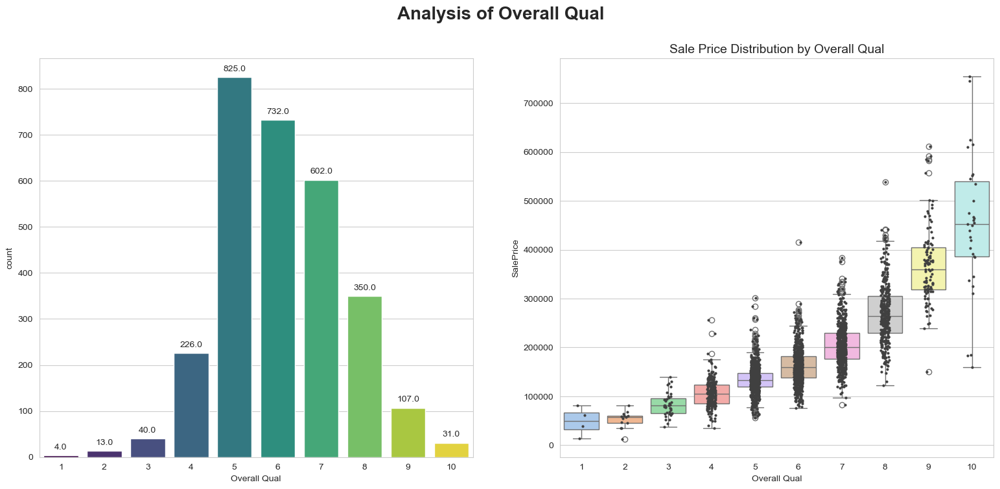

In [365]:
fig, axes = plt.subplots(1, 2, figsize=(19, 8))
fig.suptitle('Analysis of Overall Qual', fontsize=20, weight='bold')

ax1 = sns.countplot(x='Overall Qual', hue='Overall Qual', legend=False,data=df, palette='viridis', ax=axes[0])

for p in ax1.patches:
    ax1.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 9), textcoords='offset points')
    

sns.boxplot(x='Overall Qual', y='SalePrice', hue='Overall Qual', legend=False,data=df, palette='pastel', ax=axes[1])
sns.stripplot(x='Overall Qual', y='SalePrice', data=df, color=".25", size=3, ax=axes[1])
axes[1].set_title('Sale Price Distribution by Overall Qual', fontsize=14)

In [366]:
Outliers_Overall_Qual = detect_outliers_freq(df['Overall Qual'])
print(Outliers_Overall_Qual)
print('Number of data:',len(Outliers_Overall_Qual['index']))

# These samples are not actual outliers. Because they are true values in this concept.

#intfloat_features_outliers['index'].extend(Outliers_Overall_Qual['index'])
#intfloat_features_outliers['value'].extend(Outliers_Overall_Qual['value'])

{'index': [181, 302, 662, 708, 742, 780, 907, 945, 1302, 1321, 2241, 2843, 2880, 765, 1553, 1901, 2903], 'value': [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1]}
Number of data: 17


#### Overall Cond

In [367]:
df['Overall Cond'].unique()

array([5, 6, 7, 2, 8, 4, 9, 3, 1], dtype=int64)

Text(0.5, 1.0, 'Sale Price Distribution by Overall Cond')

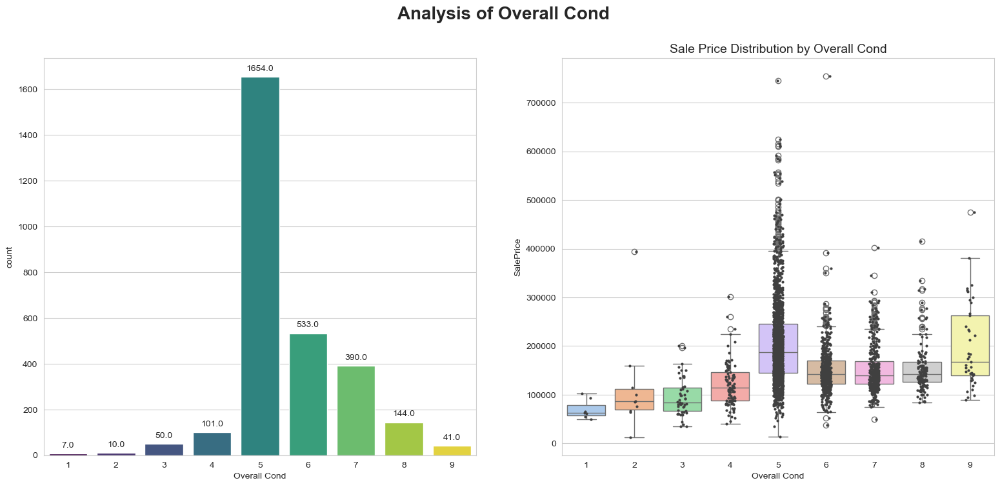

In [368]:
fig, axes = plt.subplots(1, 2, figsize=(19, 8))
fig.suptitle('Analysis of Overall Cond', fontsize=20, weight='bold')

ax1 = sns.countplot(x='Overall Cond', hue='Overall Cond', legend=False,data=df, palette='viridis', ax=axes[0])

for p in ax1.patches:
    ax1.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 9), textcoords='offset points')
    

sns.boxplot(x='Overall Cond', y='SalePrice', hue='Overall Cond', legend=False,data=df, palette='pastel', ax=axes[1])
sns.stripplot(x='Overall Cond', y='SalePrice', data=df, color=".25", size=3, ax=axes[1])
axes[1].set_title('Sale Price Distribution by Overall Cond', fontsize=14)

In [369]:
Outliers_Overall_Cond = detect_outliers_freq(df['Overall Cond'])
print(Outliers_Overall_Cond)
print('Number of data:',len(Outliers_Overall_Cond['index']))

# These samples are not actual outliers. Because they are true values in this concept.

#intfloat_features_outliers['index'].extend(Outliers_Overall_Cond['index'])
#intfloat_features_outliers['value'].extend(Outliers_Overall_Cond['value'])

{'index': [17, 130, 181, 291, 336, 780, 942, 1013, 2239, 2658, 213, 753, 765, 1305, 1321, 1610, 2043], 'value': [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1]}
Number of data: 17


#### Year Built

In [370]:
df['Year Built'].unique()

array([1960, 1961, 1958, 1968, 1997, 1998, 2001, 1992, 1995, 1999, 1993,
       1990, 1985, 2003, 1988, 2010, 1951, 1978, 1977, 1974, 2000, 1970,
       1971, 1975, 2009, 2007, 2005, 2004, 2002, 2006, 1996, 1994, 2008,
       1980, 1979, 1984, 1920, 1965, 1967, 1963, 1962, 1976, 1972, 1966,
       1959, 1964, 1950, 1952, 1949, 1940, 1954, 1955, 1957, 1956, 1953,
       1948, 1900, 1910, 1927, 1915, 1945, 1929, 1938, 1923, 1928, 1890,
       1885, 1922, 1925, 1939, 1942, 1936, 1930, 1921, 1912, 1917, 1907,
       1875, 1969, 1947, 1946, 1987, 1941, 1924, 1914, 1931, 1919, 1989,
       1896, 1973, 1991, 1981, 1986, 1916, 1926, 1935, 1892, 1898, 1880,
       1882, 1937, 1902, 1934, 1982, 1983, 1932, 1918, 1904, 1905, 1872,
       1893, 1906, 1908, 1911, 1895, 1879, 1901, 1913], dtype=int64)

<Axes: xlabel='Year Built', ylabel='Count'>

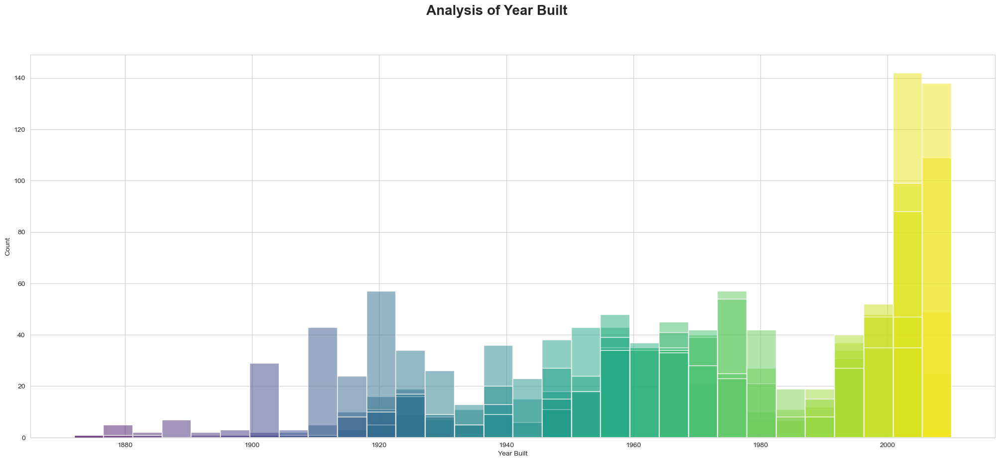

In [371]:
plt.figure(figsize=(25, 10))
plt.suptitle('Analysis of Year Built', fontsize=20, weight='bold')

sns.histplot(data=df, x='Year Built', hue='Year Built', legend=False, kde=False, palette='viridis', bins=30)


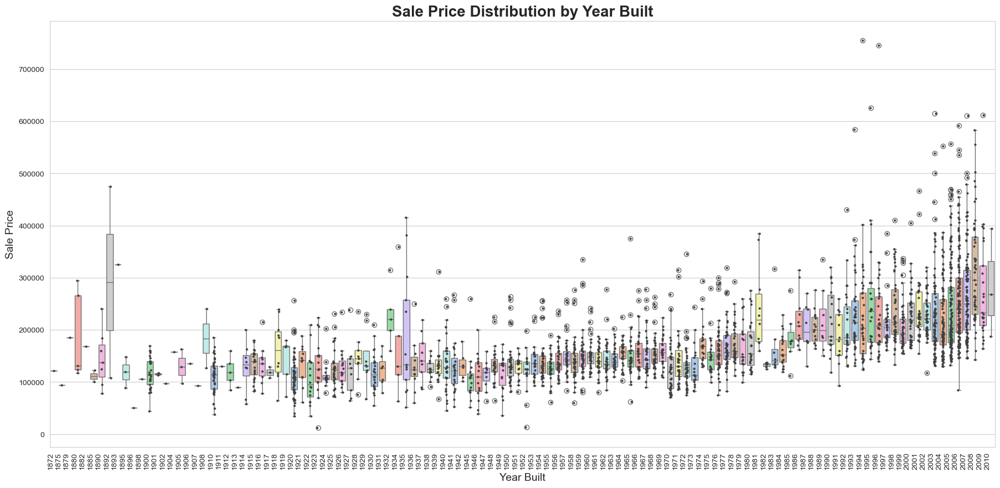

In [372]:
plt.figure(figsize=(22, 10))
sns.boxplot(x='Year Built', y='SalePrice', hue='Year Built', legend=False,data=df, palette='pastel')
sns.stripplot(x='Year Built', y='SalePrice', data=df, color=".25", size=3)
plt.title('Sale Price Distribution by Year Built', fontsize=20, weight='bold')
plt.xticks(rotation=90, ha='right', fontsize=10)
plt.xlabel('Year Built', fontsize=14)
plt.ylabel('Sale Price', fontsize=14)
plt.show()

In [373]:
Outliers_Year_Built = detect_outliers_IQR(df['Year Built'])
print(Outliers_Year_Built)
print('Number of data:',len(Outliers_Year_Built['index']))

# These samples are not actual outliers. Because they are true values in this concept.

#intfloat_features_outliers['index'].extend(Outliers_Year_Built['index'])
#intfloat_features_outliers['value'].extend(Outliers_Year_Built['value'])

{'index': [215, 716, 719, 806, 1306, 1318, 1995, 1997, 2647], 'value': [1875, 1880, 1882, 1880, 1880, 1872, 1880, 1879, 1880]}
Number of data: 9


#### Year Remod/Add

In [374]:
df['Year Remod/Add'].unique()

array([1960, 1961, 1958, 1968, 1998, 2001, 1992, 1996, 1999, 1994, 2007,
       1990, 1985, 2003, 2005, 2010, 1951, 1988, 1977, 1974, 2000, 1970,
       2008, 1971, 1975, 1978, 2006, 2004, 2002, 1995, 2009, 1980, 1979,
       1984, 1981, 1950, 1967, 1963, 1993, 1966, 1959, 1964, 1954, 1972,
       1989, 1957, 1956, 1952, 1955, 1962, 1997, 1965, 1969, 1987, 1976,
       1991, 1973, 1986, 1983, 1953, 1982], dtype=int64)

<Axes: xlabel='Year Remod/Add', ylabel='Count'>

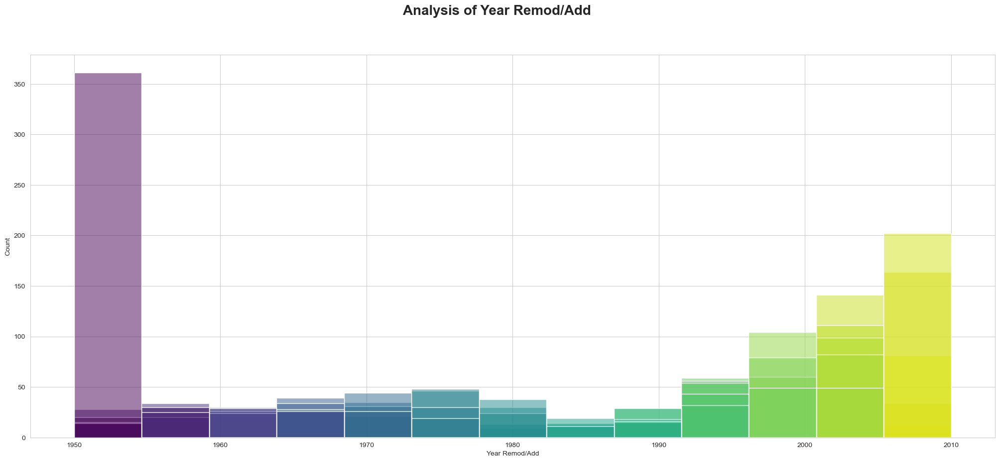

In [375]:
plt.figure(figsize=(25, 10))
plt.suptitle('Analysis of Year Remod/Add', fontsize=20, weight='bold')
sns.histplot(data=df, x='Year Remod/Add', hue='Year Remod/Add', legend=False, kde=False, palette='viridis')

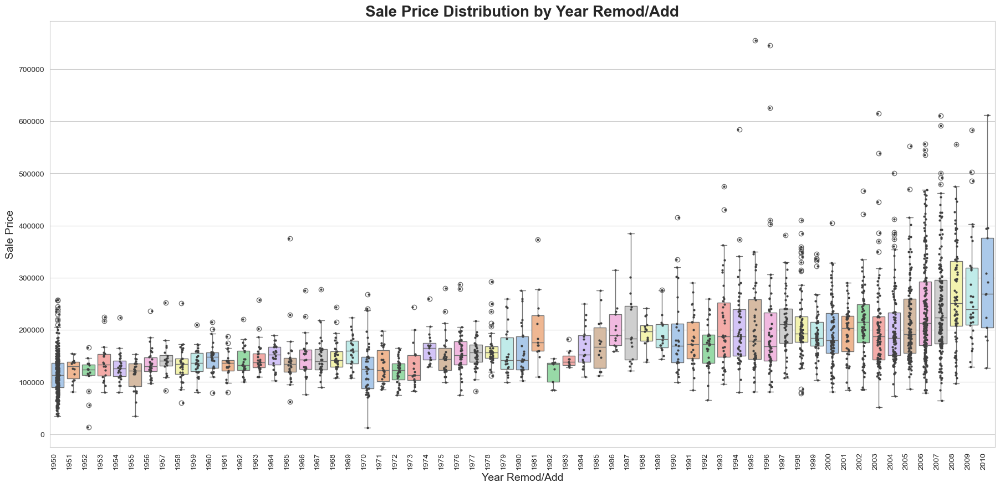

In [376]:
plt.figure(figsize=(22, 10))
sns.boxplot(x='Year Remod/Add', y='SalePrice', hue='Year Remod/Add', legend=False,data=df, palette='pastel')
sns.stripplot(x='Year Remod/Add', y='SalePrice', data=df, color=".25", size=3)
plt.title('Sale Price Distribution by Year Remod/Add', fontsize=20, weight='bold')
plt.xticks(rotation=90, ha='right', fontsize=10)
plt.xlabel('Year Remod/Add', fontsize=14)
plt.ylabel('Sale Price', fontsize=14)
plt.show()

In [377]:
Outliers_Year_Remod_Add = detect_outliers_IQR(df['Year Remod/Add'])
print(Outliers_Year_Remod_Add)
print('Number of data:',len(Outliers_Year_Remod_Add['index']))

# These samples are not actual outliers. Because they are true values in this concept.

#intfloat_features_outliers['index'].extend(Outliers_Year_Remod_Add['index'])
#intfloat_features_outliers['value'].extend(Outliers_Year_Remod_Add['value'])

{'index': [], 'value': []}
Number of data: 0


#### 1st Flr SF

In [378]:
df['1st Flr SF'].unique()

array([1656,  896, 1329, ..., 2028, 1003, 1389], dtype=int64)

Text(0.5, 1.0, '1st Flr SF vs. Transformed Lot Area')

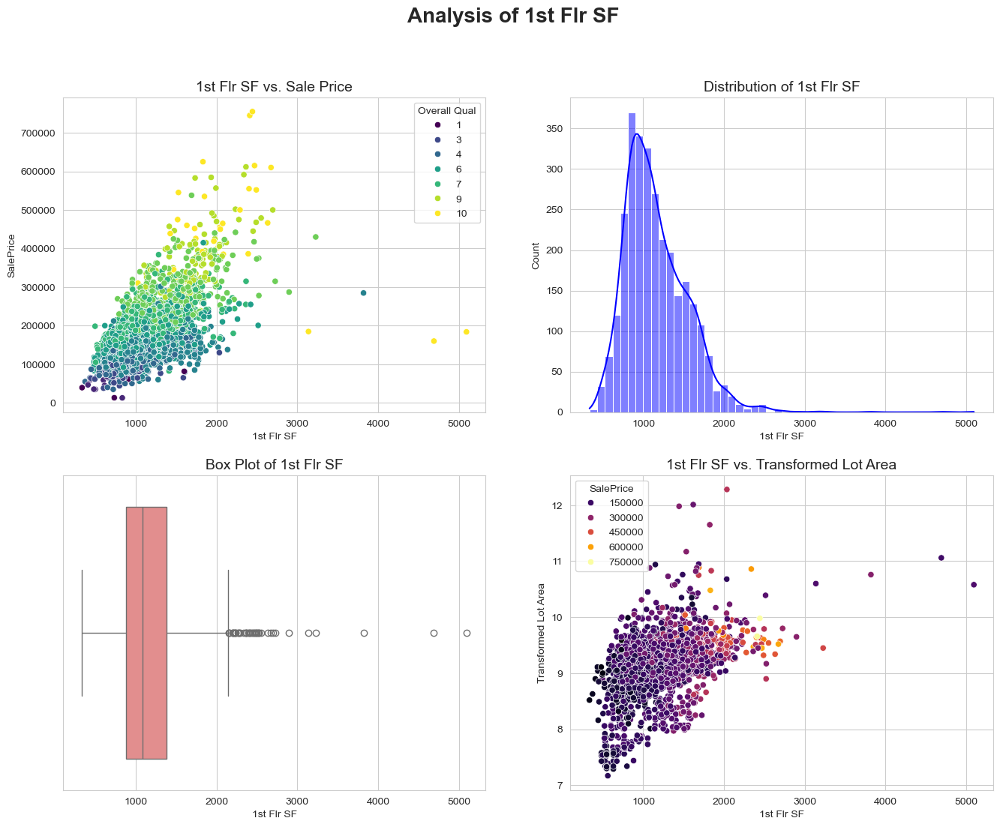

In [379]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Analysis of 1st Flr SF', fontsize=20, weight='bold')

sns.scatterplot(x='1st Flr SF', y='SalePrice', hue='Overall Qual', legend=True ,palette='viridis', data=df, ax=axes[0,0])
axes[0,0].set_title('1st Flr SF vs. Sale Price', fontsize=14)

sns.histplot(df['1st Flr SF'], kde=True, color='blue', bins=50, ax=axes[0, 1])
axes[0, 1].set_title('Distribution of 1st Flr SF', fontsize=14)

sns.boxplot(x=df['1st Flr SF'], color='lightcoral', ax=axes[1, 0])
axes[1, 0].set_title('Box Plot of 1st Flr SF', fontsize=14)

sns.scatterplot(x='1st Flr SF', y='Transformed Lot Area', hue='SalePrice', legend=True ,palette='inferno', data=df, ax=axes[1,1])
axes[1, 1].set_title('1st Flr SF vs. Transformed Lot Area', fontsize=14)

In [380]:
Outliers_1st_Flr_SF = detect_outliers_IQR(df['1st Flr SF'])
print(Outliers_1st_Flr_SF)
print('Number of data:',len(Outliers_1st_Flr_SF['index']))

# These samples are not actual outliers. Because they are true values in this concept so they can be solved by Log transform 

#intfloat_features_outliers['index'].extend(Outliers_1st_Flr_SF['index'])
#intfloat_features_outliers['value'].extend(Outliers_1st_Flr_SF['value'])

{'index': [44, 46, 136, 349, 366, 379, 423, 432, 447, 448, 456, 457, 513, 802, 937, 1056, 1063, 1425, 1497, 1498, 1572, 1613, 1614, 1637, 1641, 1695, 1701, 1760, 1763, 1767, 1772, 1854, 1860, 2077, 2078, 2180, 2181, 2222, 2229, 2230, 2258, 2498, 2525], 'value': [2364, 2696, 2207, 2522, 2234, 2524, 2402, 2674, 2392, 2452, 2492, 2200, 2490, 2196, 2365, 2464, 2470, 2276, 3820, 4692, 2898, 2223, 2217, 2338, 2234, 2552, 2290, 2411, 2633, 2444, 3228, 2362, 2497, 2422, 2158, 5095, 3138, 2259, 2515, 2726, 2279, 2151, 2156]}
Number of data: 43


Text(0.5, 1.0, 'Transformed Distribution (More Normal)')

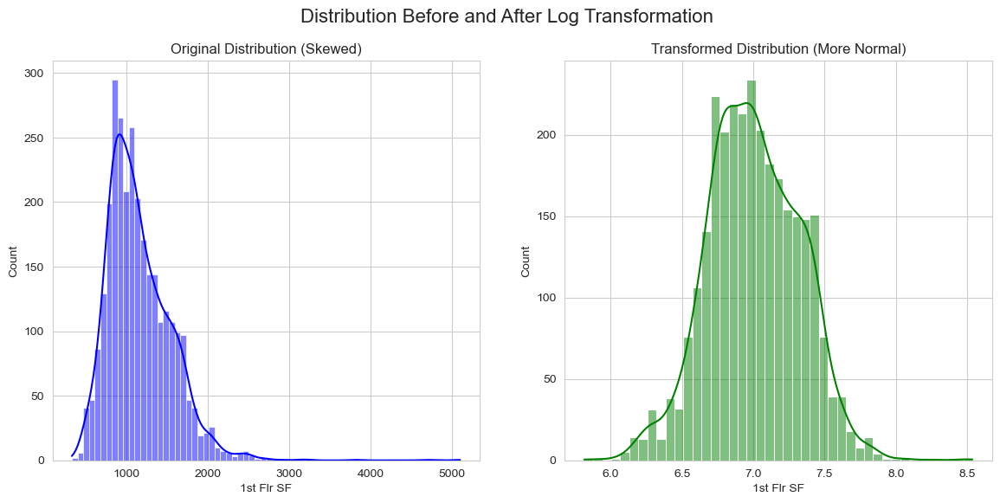

In [381]:
First_Flr_SF_log1p = np.log1p(df['1st Flr SF'])

# Create a figure with two subplots, side-by-side
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('Distribution Before and After Log Transformation', fontsize=16)

# Plot Original Distribution
sns.histplot(df['1st Flr SF'], kde=True, ax=axes[0], color='blue')
axes[0].set_title('Original Distribution (Skewed)')

# Plot Transformed Distribution
sns.histplot(First_Flr_SF_log1p, kde=True, ax=axes[1], color='green')
axes[1].set_title('Transformed Distribution (More Normal)')

In [382]:
df['Transformed 1st Flr SF'] = np.round(First_Flr_SF_log1p, decimals=2)
df = df.drop(['1st Flr SF'], axis=1)

#### 2nd Flr SF

In [383]:
df['2nd Flr SF'].unique()

array([   0,  701,  678,  776,  892,  676, 1589,  672,  860,  504,  567,
        601,  707,  563,  862,  630, 1100,  886,  656, 1151, 1177,  830,
       1122, 1106,  644, 1185,  783,  956, 1128,  828,  888,  790,  730,
        584, 1098,  823,  840,  600,  636,  804,  756,  720,  550,  873,
        754, 1215,  604,  734,  715,  532,  537, 1169,  505,  546, 1080,
        408,  475,  788,  687,  348,  765,  424,  606,  185,  686, 1111,
        622, 1044,  602,  582,  908,  524,  498,  492,  608,  808, 1074,
        780,  662, 1196,  499,  180,  319,  942,  744,  240,  689,  714,
        954,  192,  864,  558,  755,  838,  887, 1523,  614,  800,  878,
        703, 1054,  328,  252,  806,  665, 1788,  772,  748, 1075, 1152,
        358,  380,  430,  880,  700, 1194, 1070,  915,  912,  576, 1216,
        650,  615,  645,  704,  663, 1275,  670,  631,  833,  684,  809,
        785,  779,  978,  988, 1200,  896, 1134,  868, 1103,  816,  839,
        741,  467,  586, 1174, 1325,  568, 1088, 10

Text(0.5, 1.0, '2nd Flr SF vs. MS Zoning')

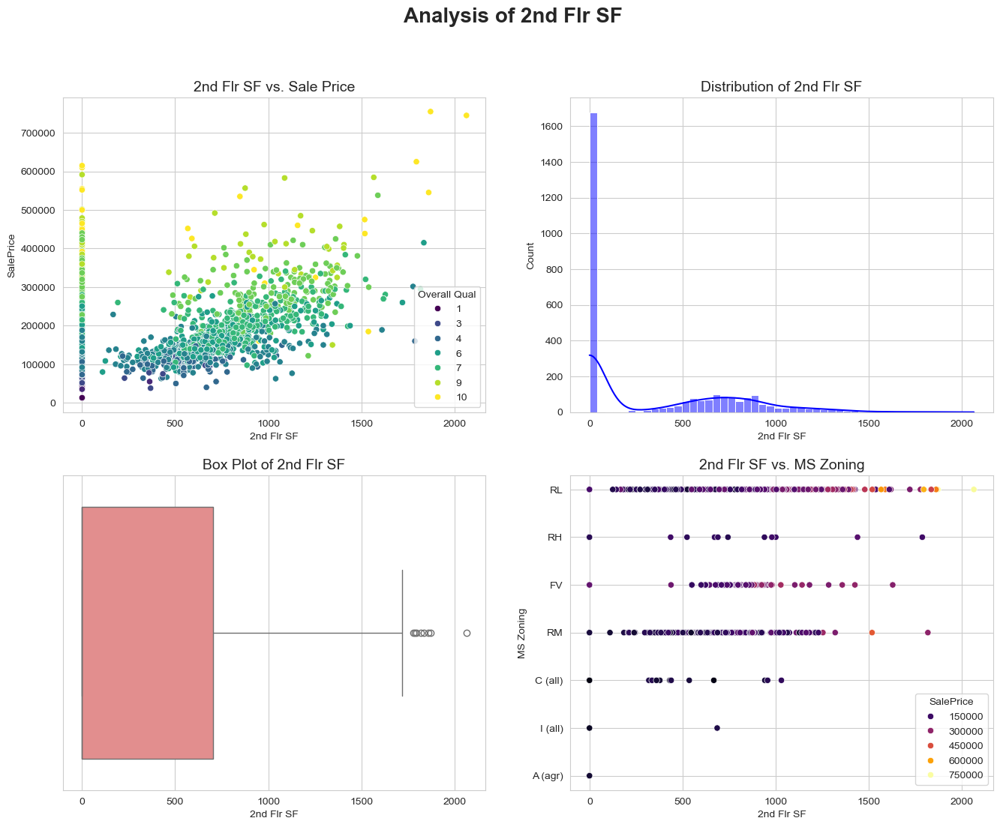

In [384]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Analysis of 2nd Flr SF', fontsize=20, weight='bold')

sns.scatterplot(x='2nd Flr SF', y='SalePrice', hue='Overall Qual', legend=True ,palette='viridis', data=df, ax=axes[0,0])
axes[0,0].set_title('2nd Flr SF vs. Sale Price', fontsize=14)

sns.histplot(df['2nd Flr SF'], kde=True, color='blue', bins=50, ax=axes[0, 1])
axes[0, 1].set_title('Distribution of 2nd Flr SF', fontsize=14)

sns.boxplot(x=df['2nd Flr SF'], color='lightcoral', ax=axes[1, 0])
axes[1, 0].set_title('Box Plot of 2nd Flr SF', fontsize=14)

sns.scatterplot(x='2nd Flr SF', y='MS Zoning', hue='SalePrice', legend=True ,palette='inferno', data=df, ax=axes[1,1])
axes[1, 1].set_title('2nd Flr SF vs. MS Zoning', fontsize=14)

In [385]:
Outliers_2nd_Flr_SF = detect_outliers_IQR(df['2nd Flr SF'])
print(Outliers_2nd_Flr_SF)
print('Number of data:',len(Outliers_2nd_Flr_SF['index']))

# These samples are not actual outliers. Because they are true values in this concept so they can be solved by Log transform 

#intfloat_features_outliers['index'].extend(Outliers_2nd_Flr_SF['index'])
#intfloat_features_outliers['value'].extend(Outliers_2nd_Flr_SF['value'])

{'index': [290, 1306, 1760, 1767, 1945, 2330, 2445, 2737], 'value': [1788, 1818, 2065, 1872, 1778, 1862, 1796, 1836]}
Number of data: 8


Text(0.5, 1.0, 'Transformed Distribution (More Normal)')

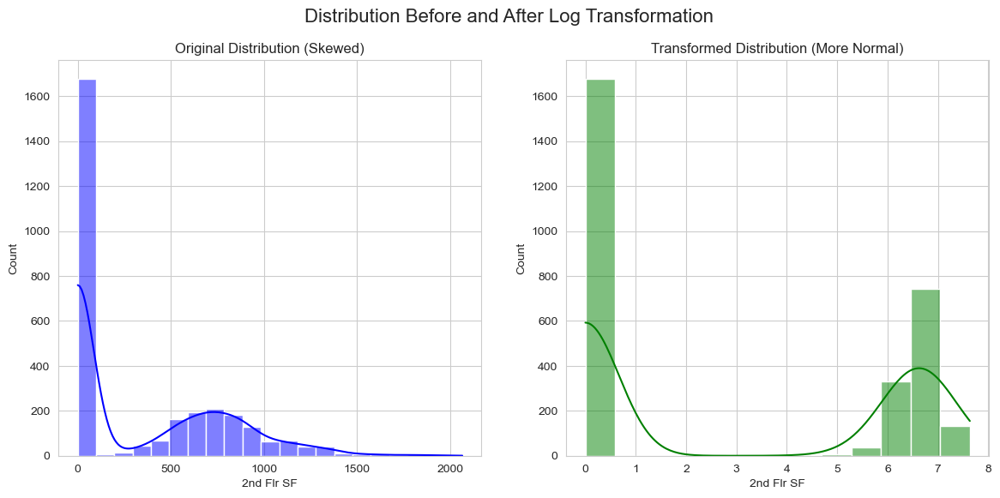

In [386]:
Second_Flr_SF_log1p = np.log1p(df['2nd Flr SF'])

# Create a figure with two subplots, side-by-side
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('Distribution Before and After Log Transformation', fontsize=16)

# Plot Original Distribution
sns.histplot(df['2nd Flr SF'], kde=True, ax=axes[0], color='blue')
axes[0].set_title('Original Distribution (Skewed)')

# Plot Transformed Distribution
sns.histplot(Second_Flr_SF_log1p, kde=True, ax=axes[1], color='green')
axes[1].set_title('Transformed Distribution (More Normal)')

In [387]:
df['Transformed 2nd Flr SF'] = np.round(Second_Flr_SF_log1p, decimals=2)
df = df.drop(['2nd Flr SF'], axis=1)

#### Low Qual Fin SF

In [388]:
df['Low Qual Fin SF'].unique()

array([   0,  390,  362,  144, 1064,  232,  431,  120,  436,  371,  360,
        259,  397,  312,  513,  108,  205,  156,  697,  420,  384,  473,
        512,  528,  114,  479,  515,   53,   80,  392,  572,  234,  140,
        450,  481,  514], dtype=int64)

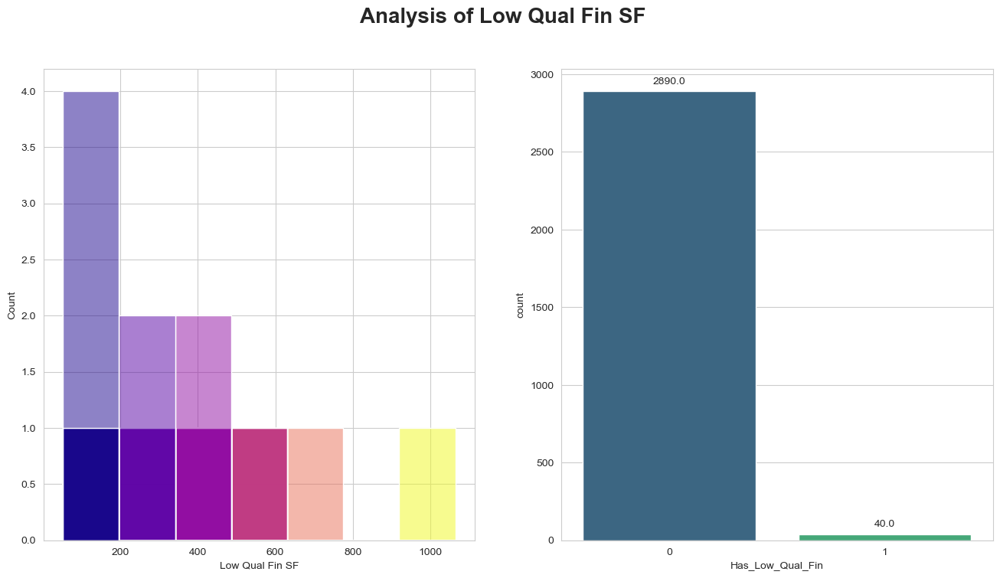

In [389]:
House_With_Without_Low_Qual_Fin = pd.DataFrame((df['Low Qual Fin SF'] > 0).astype(int).values, columns=['Has_Low_Qual_Fin'])
House_Has_Low_Qual_Fin = df[df['Low Qual Fin SF'] > 0].copy()

fig, axes = plt.subplots(1, 2, figsize=(16, 8))
fig.suptitle('Analysis of Low Qual Fin SF', fontsize=20, weight='bold')

ax1 = sns.histplot(x='Low Qual Fin SF', data=House_Has_Low_Qual_Fin, ax=axes[0], hue='Low Qual Fin SF', legend=False, kde=False, palette='plasma')
    
ax2 = sns.countplot(x='Has_Low_Qual_Fin', hue='Has_Low_Qual_Fin', legend=False,data=House_With_Without_Low_Qual_Fin, palette='viridis', ax=axes[1])
for p in ax2.patches:
    ax2.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 9), textcoords='offset points')

In [390]:
Outliers_Low_Qual_Fin_SF = detect_outliers_IQR(df['Low Qual Fin SF'])
print(Outliers_Low_Qual_Fin_SF)
print('Number of data:',len(Outliers_Low_Qual_Fin_SF['index']))

# These samples are not actual outliers. Because they are true values in this concept.

#intfloat_features_outliers['index'].extend(Outliers_Low_Qual_Fin_SF['index'])
#intfloat_features_outliers['value'].extend(Outliers_Low_Qual_Fin_SF['value'])

{'index': [177, 238, 655, 660, 675, 686, 723, 724, 752, 755, 777, 909, 940, 942, 1291, 1318, 1329, 1361, 1517, 1524, 1529, 1944, 2040, 2043, 2045, 2194, 2241, 2337, 2506, 2507, 2508, 2509, 2570, 2666, 2675, 2696, 2730, 2841, 2842, 2852], 'value': [390, 362, 144, 1064, 232, 431, 120, 436, 371, 360, 259, 397, 312, 513, 108, 205, 156, 697, 420, 384, 473, 512, 528, 114, 479, 515, 205, 53, 80, 80, 80, 80, 392, 572, 360, 234, 140, 450, 481, 514]}
Number of data: 40


#### Gr Liv Area

In [391]:
df['Gr Liv Area'].unique()

array([1656,  896, 1329, ..., 2028, 2521, 1003], dtype=int64)

Text(0.5, 1.0, 'Gr Liv Area vs. Transformed Lot Area')

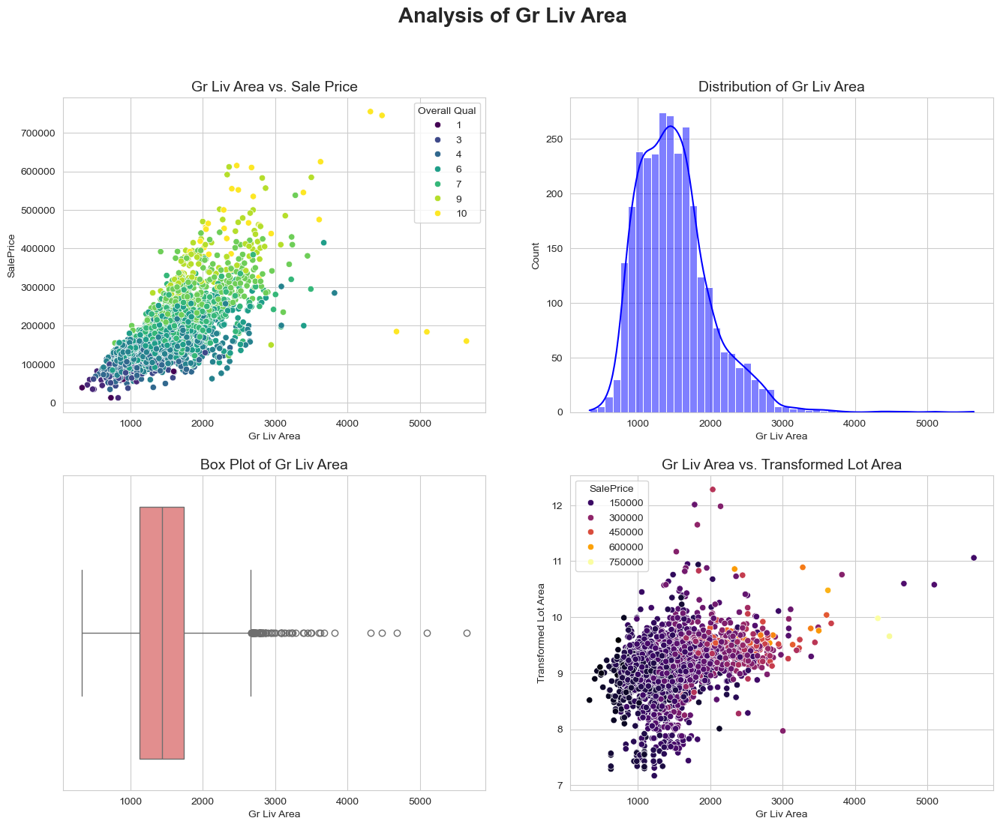

In [392]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Analysis of Gr Liv Area', fontsize=20, weight='bold')

sns.scatterplot(x='Gr Liv Area', y='SalePrice', hue='Overall Qual', legend=True ,palette='viridis', data=df, ax=axes[0,0])
axes[0,0].set_title('Gr Liv Area vs. Sale Price', fontsize=14)

sns.histplot(df['Gr Liv Area'], kde=True, color='blue', bins=50, ax=axes[0, 1])
axes[0, 1].set_title('Distribution of Gr Liv Area', fontsize=14)

sns.boxplot(x=df['Gr Liv Area'], color='lightcoral', ax=axes[1, 0])
axes[1, 0].set_title('Box Plot of Gr Liv Area', fontsize=14)

sns.scatterplot(x='Gr Liv Area', y='Transformed Lot Area', hue='SalePrice', legend=True ,palette='inferno', data=df, ax=axes[1,1])
axes[1, 1].set_title('Gr Liv Area vs. Transformed Lot Area', fontsize=14)

In [393]:
Outliers_Gr_Liv_Area = detect_outliers_IQR(df['Gr Liv Area'])
print(Outliers_Gr_Liv_Area)
print('Number of data:',len(Outliers_Gr_Liv_Area['index']))

# These samples are not actual outliers. Because they are true values in this concept so they can be solved by Log transform 

#intfloat_features_outliers['index'].extend(Outliers_Gr_Liv_Area['index'])
#intfloat_features_outliers['value'].extend(Outliers_Gr_Liv_Area['value'])

{'index': [15, 46, 65, 160, 253, 343, 376, 421, 422, 427, 432, 433, 495, 496, 565, 815, 816, 817, 909, 1022, 1027, 1053, 1058, 1059, 1064, 1068, 1157, 1158, 1182, 1199, 1288, 1306, 1320, 1419, 1497, 1498, 1537, 1572, 1700, 1707, 1760, 1764, 1767, 1772, 1832, 1833, 1945, 2045, 2092, 2096, 2097, 2180, 2181, 2194, 2214, 2218, 2230, 2322, 2329, 2330, 2332, 2334, 2335, 2336, 2350, 2400, 2445, 2446, 2449, 2450, 2453, 2500, 2570, 2666, 2737], 'value': [3279, 2696, 3238, 2978, 3222, 2704, 2673, 2772, 3140, 2690, 2674, 2822, 2794, 2687, 3005, 2787, 2787, 2787, 3082, 2872, 2840, 2713, 2748, 2790, 2668, 2690, 2683, 2786, 2944, 2715, 2792, 3493, 2775, 2814, 3820, 5642, 3447, 2898, 2758, 2956, 4476, 3078, 4316, 3228, 2810, 2872, 3086, 3086, 2730, 2696, 2828, 5095, 4676, 3395, 3194, 2727, 2726, 2687, 2798, 3390, 2868, 2698, 2795, 2945, 2784, 2728, 3627, 2855, 2726, 3500, 2799, 2826, 3112, 3608, 3672]}
Number of data: 75


Text(0.5, 1.0, 'Transformed Distribution (More Normal)')

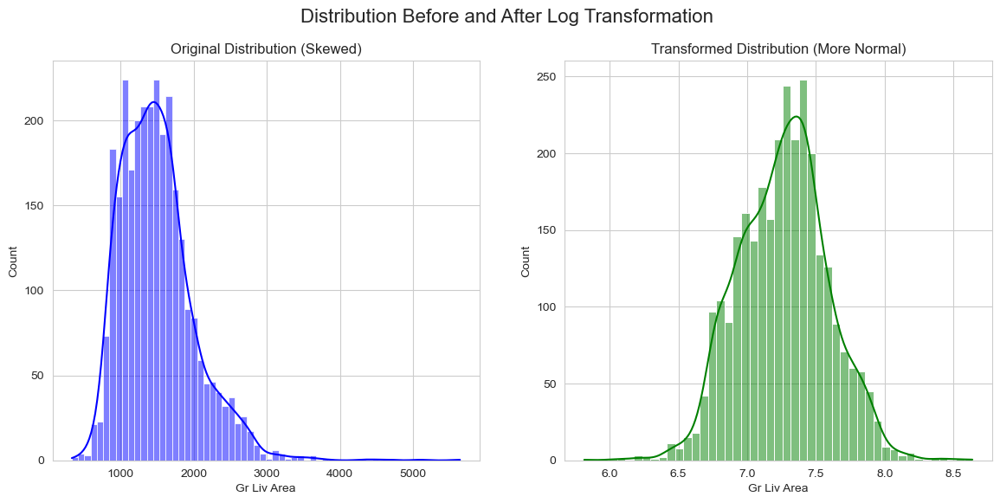

In [394]:
Gr_Liv_Area_log1p = np.log1p(df['Gr Liv Area'])

# Create a figure with two subplots, side-by-side
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('Distribution Before and After Log Transformation', fontsize=16)

# Plot Original Distribution
sns.histplot(df['Gr Liv Area'], kde=True, ax=axes[0], color='blue')
axes[0].set_title('Original Distribution (Skewed)')

# Plot Transformed Distribution
sns.histplot(Gr_Liv_Area_log1p, kde=True, ax=axes[1], color='green')
axes[1].set_title('Transformed Distribution (More Normal)')

In [395]:
df['Transformed Gr Liv Area'] = np.round(Gr_Liv_Area_log1p, decimals=2)
df = df.drop(['Gr Liv Area'], axis=1)

#### Full Bath

In [396]:
df['Full Bath'].unique()

array([1, 2, 3, 0, 4], dtype=int64)

Text(0.5, 1.0, 'Sale Price Distribution by Full Bath')

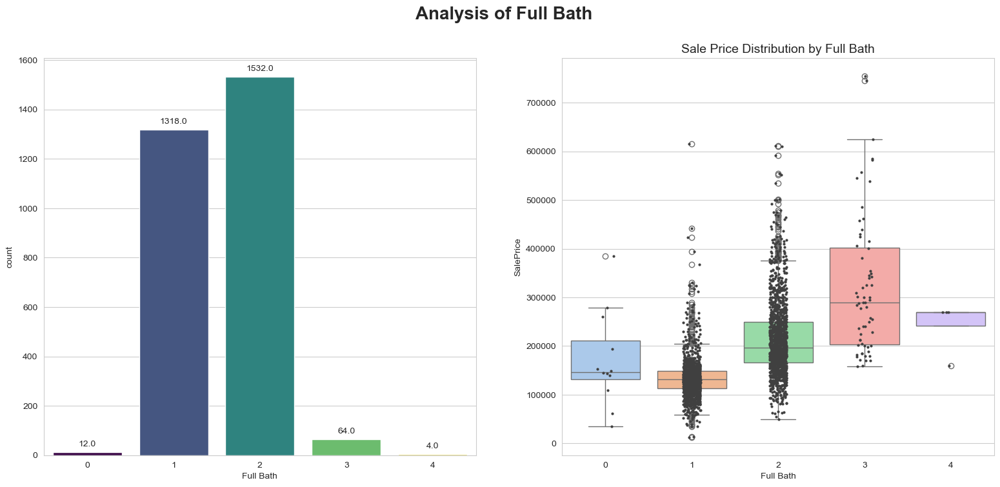

In [397]:
fig, axes = plt.subplots(1, 2, figsize=(19, 8))
fig.suptitle('Analysis of Full Bath', fontsize=20, weight='bold')

ax1 = sns.countplot(x='Full Bath', hue='Full Bath', legend=False,data=df, palette='viridis', ax=axes[0])

for p in ax1.patches:
    ax1.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 9), textcoords='offset points')
    

sns.boxplot(x='Full Bath', y='SalePrice', hue='Full Bath', legend=False,data=df, palette='pastel', ax=axes[1])
sns.stripplot(x='Full Bath', y='SalePrice', data=df, color=".25", size=3, ax=axes[1])
axes[1].set_title('Sale Price Distribution by Full Bath', fontsize=14)

In [398]:
Outliers_Full_Bath = detect_outliers_freq(df['Full Bath'])
print(Outliers_Full_Bath)
print('Number of data:',len(Outliers_Full_Bath['index']))

# These samples are not actual outliers. Because they are true values in this concept.

#intfloat_features_outliers['index'].extend(Outliers_Full_Bath['index'])
#intfloat_features_outliers['value'].extend(Outliers_Full_Bath['value'])

{'index': [158, 232, 765, 808, 813, 1385, 1742, 2118, 2279, 2522, 2723, 2880, 336, 815, 816, 817], 'value': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 4, 4]}
Number of data: 16


#### Half Bath

In [399]:
df['Half Bath'].unique()

array([0, 1, 2], dtype=int64)

Text(0.5, 1.0, 'Sale Price Distribution by Half Bath')

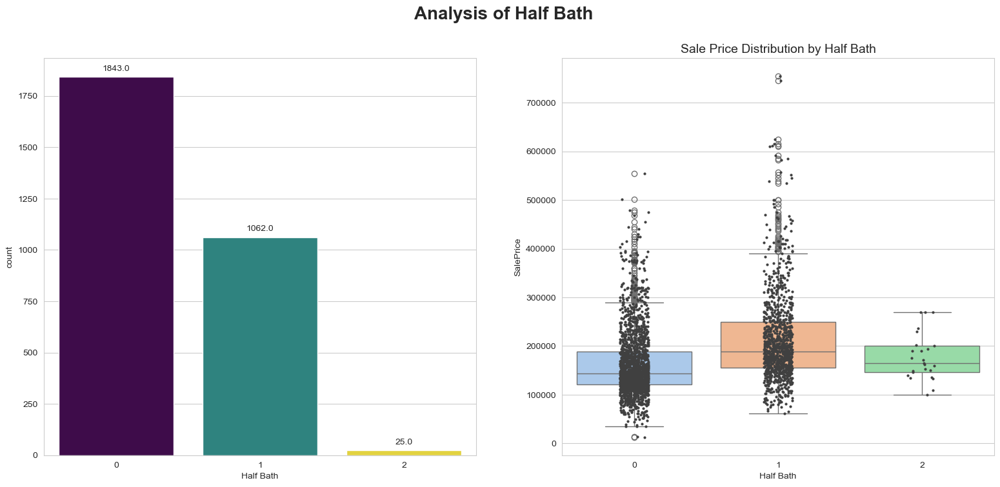

In [400]:
fig, axes = plt.subplots(1, 2, figsize=(19, 8))
fig.suptitle('Analysis of Half Bath', fontsize=20, weight='bold')

ax1 = sns.countplot(x='Half Bath', hue='Half Bath', legend=False,data=df, palette='viridis', ax=axes[0])

for p in ax1.patches:
    ax1.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 9), textcoords='offset points')
    

sns.boxplot(x='Half Bath', y='SalePrice', hue='Half Bath', legend=False,data=df, palette='pastel', ax=axes[1])
sns.stripplot(x='Half Bath', y='SalePrice', data=df, color=".25", size=3, ax=axes[1])
axes[1].set_title('Sale Price Distribution by Half Bath', fontsize=14)

In [401]:
Outliers_Half_Bath = detect_outliers_freq(df['Half Bath'])
print(Outliers_Half_Bath)
print('Number of data:',len(Outliers_Half_Bath['index']))

# These samples are not actual outliers. Because they are true values in this concept.

#intfloat_features_outliers['index'].extend(Outliers_Half_Bath['index'])
#intfloat_features_outliers['value'].extend(Outliers_Half_Bath['value'])

{'index': [116, 324, 336, 392, 589, 666, 669, 808, 813, 815, 816, 817, 1033, 1182, 1228, 1385, 1486, 1522, 1568, 1658, 1742, 1783, 1861, 1955, 2528], 'value': [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]}
Number of data: 25


#### Bedroom AbvGr

In [402]:
df['Bedroom AbvGr'].unique()

array([3, 2, 1, 4, 6, 5, 0, 8], dtype=int64)

Text(0.5, 1.0, 'Sale Price Distribution by Bedroom AbvGr')

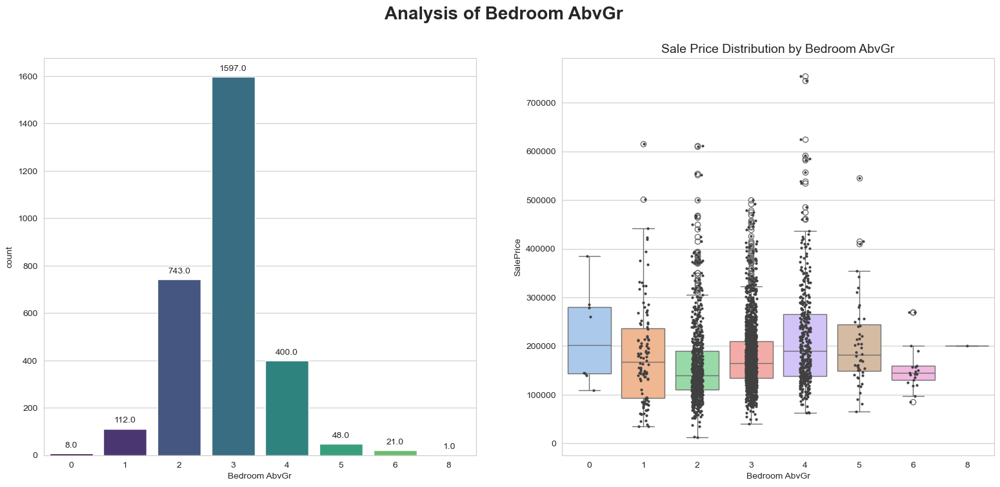

In [403]:
fig, axes = plt.subplots(1, 2, figsize=(19, 8))
fig.suptitle('Analysis of Bedroom AbvGr', fontsize=20, weight='bold')

ax1 = sns.countplot(x='Bedroom AbvGr', hue='Bedroom AbvGr', legend=False,data=df, palette='viridis', ax=axes[0])

for p in ax1.patches:
    ax1.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 9), textcoords='offset points')
    

sns.boxplot(x='Bedroom AbvGr', y='SalePrice', hue='Bedroom AbvGr', legend=False,data=df, palette='pastel', ax=axes[1])
sns.stripplot(x='Bedroom AbvGr', y='SalePrice', data=df, color=".25", size=3, ax=axes[1])
axes[1].set_title('Sale Price Distribution by Bedroom AbvGr', fontsize=14)

In [404]:
Outliers_Bedroom_AbvGr = detect_outliers_freq(df['Bedroom AbvGr'])
print(Outliers_Bedroom_AbvGr)
print('Number of data:',len(Outliers_Bedroom_AbvGr['index']))

# These samples are not actual outliers. Because they are true values in this concept.

#intfloat_features_outliers['index'].extend(Outliers_Bedroom_AbvGr['index'])
#intfloat_features_outliers['value'].extend(Outliers_Bedroom_AbvGr['value'])

{'index': [125, 290, 666, 669, 757, 809, 812, 815, 816, 817, 899, 1195, 1196, 1277, 1515, 1878, 1967, 2195, 2486, 2717, 2718, 158, 232, 999, 1385, 2118, 2279, 2522, 2723, 2194], 'value': [6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 0, 0, 0, 0, 0, 0, 0, 0, 8]}
Number of data: 30


#### Kitchen AbvGr

In [405]:
df['Kitchen AbvGr'].unique()

array([1, 2, 3, 0], dtype=int64)

Text(0.5, 1.0, 'Sale Price Distribution by Kitchen AbvGr')

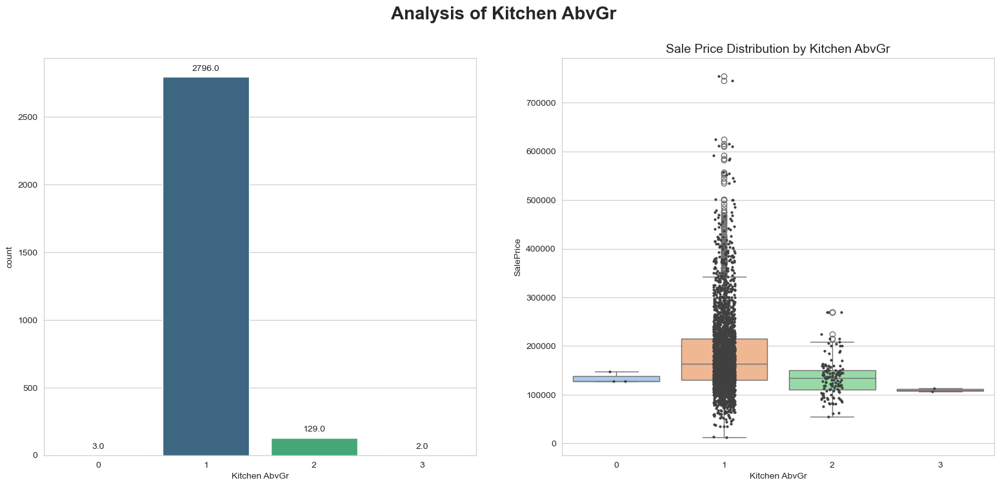

In [406]:
fig, axes = plt.subplots(1, 2, figsize=(19, 8))
fig.suptitle('Analysis of Kitchen AbvGr', fontsize=20, weight='bold')

ax1 = sns.countplot(x='Kitchen AbvGr', hue='Kitchen AbvGr', legend=False,data=df, palette='viridis', ax=axes[0])

for p in ax1.patches:
    ax1.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 9), textcoords='offset points')
    

sns.boxplot(x='Kitchen AbvGr', y='SalePrice', hue='Kitchen AbvGr', legend=False,data=df, palette='pastel', ax=axes[1])
sns.stripplot(x='Kitchen AbvGr', y='SalePrice', data=df, color=".25", size=3, ax=axes[1])
axes[1].set_title('Sale Price Distribution by Kitchen AbvGr', fontsize=14)

In [407]:
Outliers_Kitchen_AbvGr = detect_outliers_freq(df['Kitchen AbvGr'])
print(Outliers_Kitchen_AbvGr)
print('Number of data:',len(Outliers_Kitchen_AbvGr['index']))

# These samples are not actual outliers. Because they are true values in this concept.

#intfloat_features_outliers['index'].extend(Outliers_Kitchen_AbvGr['index'])
#intfloat_features_outliers['value'].extend(Outliers_Kitchen_AbvGr['value'])

{'index': [2253, 2819, 2820, 712, 715], 'value': [0, 0, 0, 3, 3]}
Number of data: 5


#### TotRms AbvGrd

In [408]:
df['TotRms AbvGrd'].unique()

array([ 7,  5,  6,  8,  4, 12, 10, 11,  9,  3, 13,  2, 15, 14],
      dtype=int64)

Text(0.5, 1.0, 'Sale Price Distribution by TotRms AbvGrd')

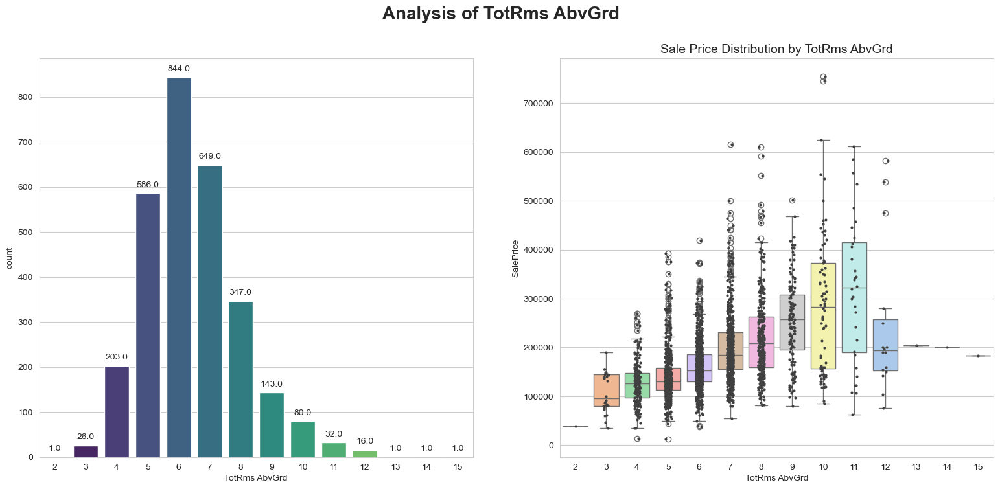

In [409]:
fig, axes = plt.subplots(1, 2, figsize=(19, 8))
fig.suptitle('Analysis of TotRms AbvGrd', fontsize=20, weight='bold')

ax1 = sns.countplot(x='TotRms AbvGrd', hue='TotRms AbvGrd', legend=False,data=df, palette='viridis', ax=axes[0])

for p in ax1.patches:
    ax1.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 9), textcoords='offset points')
    

sns.boxplot(x='TotRms AbvGrd', y='SalePrice', hue='TotRms AbvGrd', legend=False,data=df, palette='pastel', ax=axes[1])
sns.stripplot(x='TotRms AbvGrd', y='SalePrice', data=df, color=".25", size=3, ax=axes[1])
axes[1].set_title('Sale Price Distribution by TotRms AbvGrd', fontsize=14)

In [410]:
Outliers_TotRms_AbvGrd = detect_outliers_freq(df['TotRms AbvGrd'])
print(Outliers_TotRms_AbvGrd)
print('Number of data:',len(Outliers_TotRms_AbvGrd['index']))

# These samples are not actual outliers. Because they are true values in this concept.

#intfloat_features_outliers['index'].extend(Outliers_TotRms_AbvGrd['index'])
#intfloat_features_outliers['value'].extend(Outliers_TotRms_AbvGrd['value'])

{'index': [94, 106, 269, 330, 886, 907, 975, 977, 1254, 1302, 1468, 1469, 1481, 1482, 1483, 1600, 2156, 2279, 2289, 2653, 2679, 2723, 2803, 2843, 2913, 2916, 15, 135, 186, 433, 666, 669, 694, 812, 909, 1103, 1498, 1861, 2045, 2195, 2350, 2666, 925, 1901, 2180, 2194], 'value': [3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 13, 2, 15, 14]}
Number of data: 46


#### Fireplaces

In [411]:
df['Fireplaces'].unique()

array([2, 0, 1, 3, 4], dtype=int64)

Text(0.5, 1.0, 'Sale Price Distribution by Fireplaces')

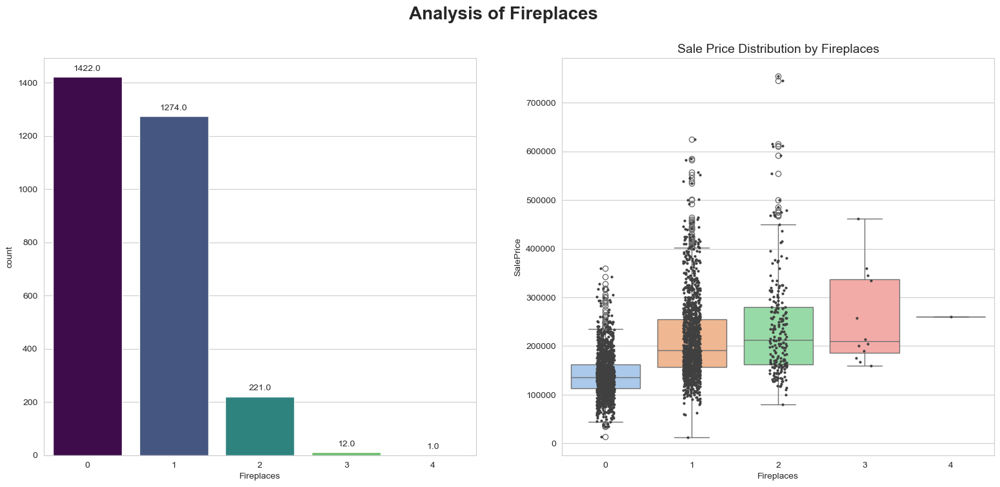

In [412]:
fig, axes = plt.subplots(1, 2, figsize=(19, 8))
fig.suptitle('Analysis of Fireplaces', fontsize=20, weight='bold')

ax1 = sns.countplot(x='Fireplaces', hue='Fireplaces', legend=False,data=df, palette='viridis', ax=axes[0])

for p in ax1.patches:
    ax1.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 9), textcoords='offset points')
    

sns.boxplot(x='Fireplaces', y='SalePrice', hue='Fireplaces', legend=False,data=df, palette='pastel', ax=axes[1])
sns.stripplot(x='Fireplaces', y='SalePrice', data=df, color=".25", size=3, ax=axes[1])
axes[1].set_title('Sale Price Distribution by Fireplaces', fontsize=14)

In [413]:
Outliers_Fireplaces = detect_outliers_freq(df['Fireplaces'])
print(Outliers_Fireplaces)
print('Number of data:',len(Outliers_Fireplaces['index']))

# These samples are not actual outliers. Because they are true values in this concept.

#intfloat_features_outliers['index'].extend(Outliers_Fireplaces['index'])
#intfloat_features_outliers['value'].extend(Outliers_Fireplaces['value'])

{'index': [343, 421, 626, 785, 1498, 1924, 2223, 2395, 2500, 2518, 2590, 2869, 2498], 'value': [3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4]}
Number of data: 13


#### Wood Deck SF

In [414]:
df['Wood Deck SF'].unique()

array([ 210,  140,  393,    0,  212,  360,  237,  157,  483,  192,  503,
        325,  113,  349,  240,  203,  275,  173,   26,  144,  168,  220,
        238,  196,  120,   36,  100,  146,  288,  180,  668,   23,  186,
        132,  283,  169,   80,  635,   28,  353,  370,  121,  416,  296,
         32,  198,  160,  280,  133,  223,  277,  224,  228,  352,  227,
        366,  117,  263,  301,   42,  252,  250,  264,  364,  414,  218,
        222,  657,   84,   51,  106,   54,  135,  221,  306,   12,  344,
         56,  406,  379,  226,  335,  496,  290,  268,  336,   44,  450,
        156,  105,  367,   71,  316,  365,  188,  331,   60,  257,  116,
        272,  141,  112,   30,   68,  128,  375,  328,  174,  182,  200,
         96,  261,  431,   22,  287,  129,  162,  269,   48,  201,   52,
        256,  232,  342,   63,  322,  178,  233,  474,  448,  225,   40,
        171,  216,  185,  108,   87,  260,  147,  150,  404,  382,  319,
         99,  184,  125,  165,  248,  114,  230,  1

Text(0.5, 1.0, 'Wood Deck SF vs. MS Zoning')

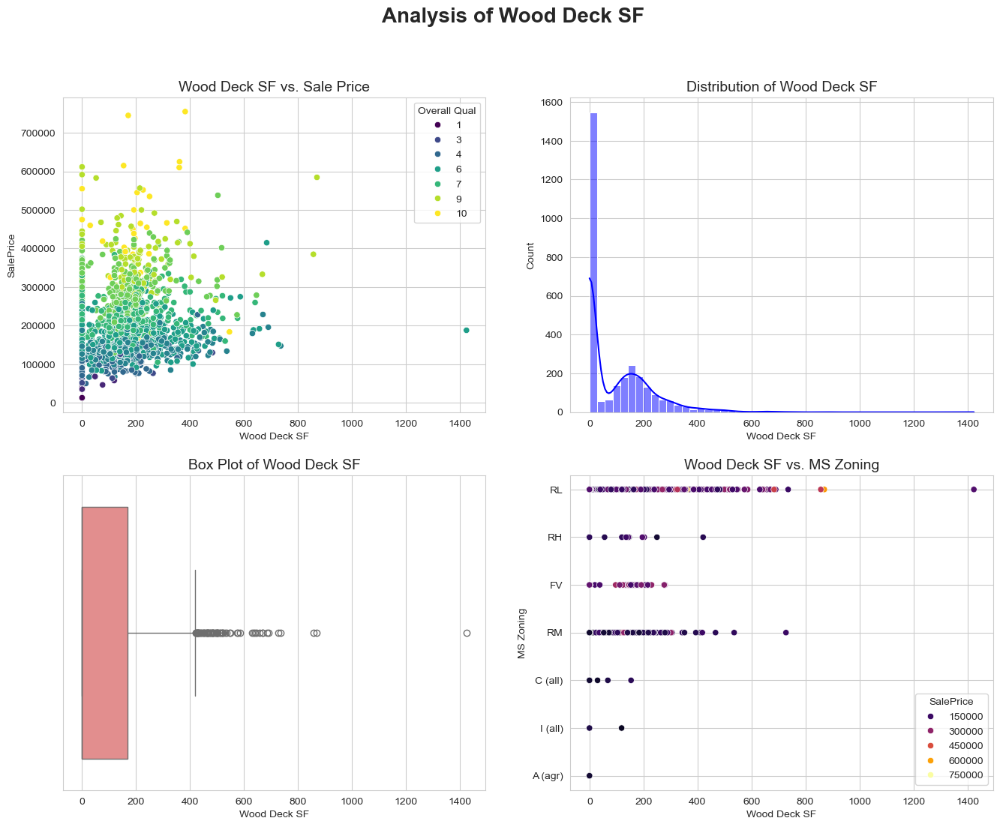

In [415]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Analysis of Wood Deck SF', fontsize=20, weight='bold')

sns.scatterplot(x='Wood Deck SF', y='SalePrice', hue='Overall Qual', legend=True ,palette='viridis', data=df, ax=axes[0,0])
axes[0,0].set_title('Wood Deck SF vs. Sale Price', fontsize=14)

sns.histplot(df['Wood Deck SF'], kde=True, color='blue', bins=50, ax=axes[0, 1])
axes[0, 1].set_title('Distribution of Wood Deck SF', fontsize=14)

sns.boxplot(x=df['Wood Deck SF'], color='lightcoral', ax=axes[1, 0])
axes[1, 0].set_title('Box Plot of Wood Deck SF', fontsize=14)

sns.scatterplot(x='Wood Deck SF', y='MS Zoning', hue='SalePrice', legend=True ,palette='inferno', data=df, ax=axes[1,1])
axes[1, 1].set_title('Wood Deck SF vs. MS Zoning', fontsize=14)

In [416]:
Outliers_Wood_Deck_SF = detect_outliers_IQR(df['Wood Deck SF'])
print(Outliers_Wood_Deck_SF)
print('Number of data:',len(Outliers_Wood_Deck_SF['index']))

# These samples are not actual outliers. Because they are true values in this concept so they can be solved by Log transform 

#intfloat_features_outliers['index'].extend(Outliers_Wood_Deck_SF['index'])
#intfloat_features_outliers['value'].extend(Outliers_Wood_Deck_SF['value'])

{'index': [11, 15, 59, 76, 167, 229, 246, 335, 379, 382, 504, 563, 564, 574, 748, 785, 834, 873, 911, 922, 940, 1021, 1022, 1073, 1210, 1240, 1391, 1406, 1420, 1488, 1524, 1526, 1569, 1570, 1759, 1831, 1832, 1952, 2044, 2118, 2180, 2278, 2282, 2284, 2293, 2294, 2310, 2327, 2352, 2385, 2450, 2453, 2484, 2498, 2522, 2592, 2605, 2617, 2712, 2735, 2737, 2738, 2780, 2849, 2894, 2910, 2924], 'value': [483, 503, 668, 635, 657, 496, 450, 431, 474, 448, 517, 462, 502, 501, 509, 476, 486, 576, 431, 483, 467, 467, 550, 495, 426, 490, 511, 486, 424, 736, 431, 424, 428, 670, 460, 455, 500, 460, 521, 646, 546, 483, 439, 536, 1424, 690, 421, 441, 444, 519, 870, 432, 421, 641, 857, 631, 436, 520, 466, 586, 684, 453, 468, 530, 574, 728, 474]}
Number of data: 67


Text(0.5, 1.0, 'Transformed Distribution (More Normal)')

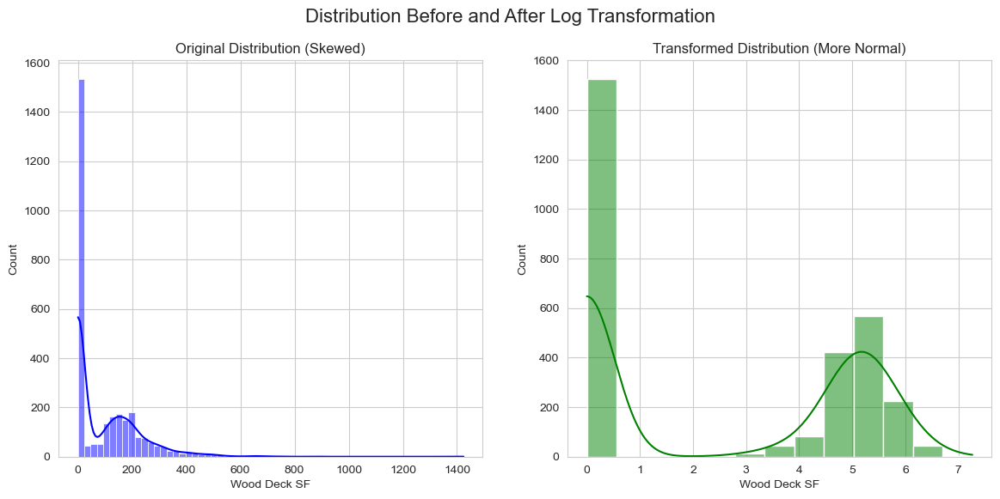

In [417]:
Wood_Deck_SF_log1p = np.log1p(df['Wood Deck SF'])

# Create a figure with two subplots, side-by-side
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('Distribution Before and After Log Transformation', fontsize=16)

# Plot Original Distribution
sns.histplot(df['Wood Deck SF'], kde=True, ax=axes[0], color='blue')
axes[0].set_title('Original Distribution (Skewed)')

# Plot Transformed Distribution
sns.histplot(Wood_Deck_SF_log1p, kde=True, ax=axes[1], color='green')
axes[1].set_title('Transformed Distribution (More Normal)')

In [418]:
df['Transformed Wood Deck SF'] = np.round(Wood_Deck_SF_log1p, decimals=2)
df = df.drop(['Wood Deck SF'], axis=1)

#### Open Porch SF

In [419]:
df['Open Porch SF'].unique()

array([ 62,   0,  36,  34,  82, 152,  60,  84,  21,  75,  54,  12, 122,
       120,  96,  85,  68,  55,  30, 133,  50,  95,  35,  70,  74, 119,
        67, 150, 130,  49,  27,  23, 116,  20,  48, 172,  56,  32,  57,
        81,  86, 136,  45, 168, 102, 104, 144,  39, 111, 166,  44, 192,
       184,  42,  78, 137,  76,  69,  66, 224,  26,  40,  98,  73,  38,
        28,  52,  17, 124, 160, 100, 228, 108,  18, 158,  10,  11, 132,
        58,  90,  22,  46, 278,  92,  33,  61,  59,  77,  25, 262, 105,
        64, 140, 156, 207,  53,  24, 312,  72,  43,  94,  63, 176, 195,
       134, 162, 197, 274, 170, 273, 185, 190, 114, 235, 183,  16,  51,
       103, 128, 146, 126, 165, 226, 121, 112, 175, 182, 113,  88, 178,
        91,  41,  93, 177, 234, 254, 169, 204,  99,  80, 110, 189, 287,
       523,  15, 135, 198, 188, 215, 155, 142, 222, 193,  29, 151, 240,
       200, 148, 201, 118, 154, 238, 247, 304, 101, 173, 282, 180,  65,
       131, 153,  87, 174, 210, 251, 243, 211, 129,   4, 230, 21

Text(0.5, 1.0, 'Open Porch SF vs. House Style')

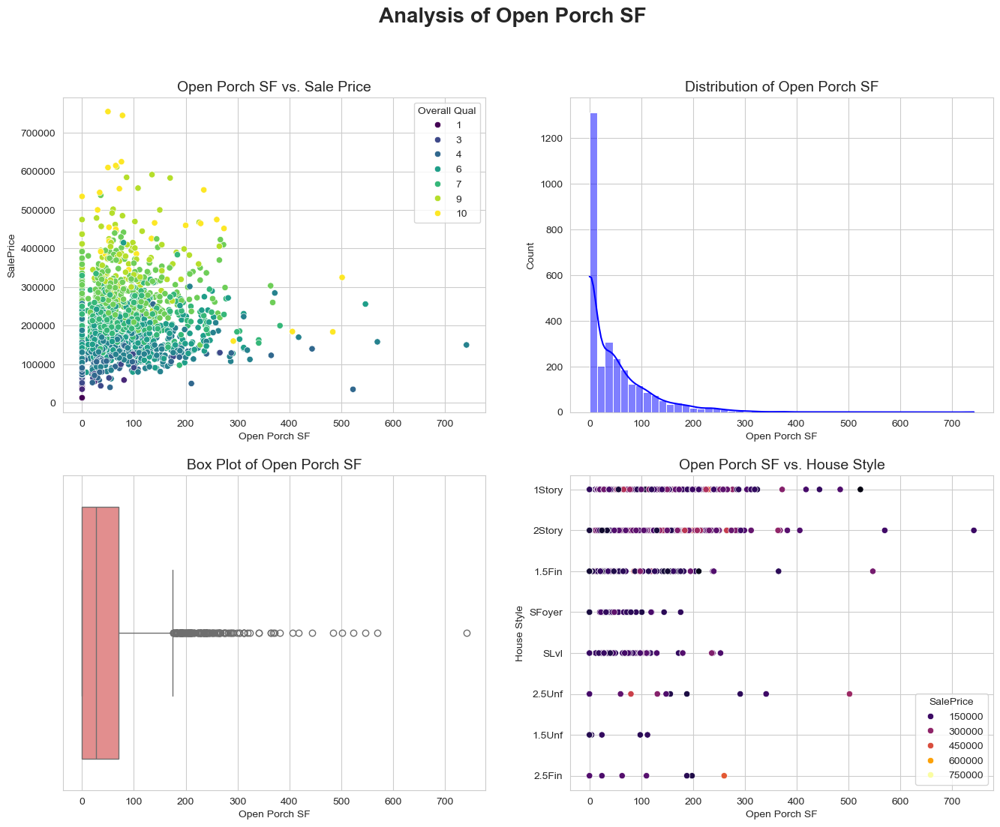

In [420]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Analysis of Open Porch SF', fontsize=20, weight='bold')

sns.scatterplot(x='Open Porch SF', y='SalePrice', hue='Overall Qual', legend=True ,palette='viridis', data=df, ax=axes[0,0])
axes[0,0].set_title('Open Porch SF vs. Sale Price', fontsize=14)

sns.histplot(df['Open Porch SF'], kde=True, color='blue', bins=50, ax=axes[0, 1])
axes[0, 1].set_title('Distribution of Open Porch SF', fontsize=14)

sns.boxplot(x=df['Open Porch SF'], color='lightcoral', ax=axes[1, 0])
axes[1, 0].set_title('Box Plot of Open Porch SF', fontsize=14)

sns.scatterplot(x='Open Porch SF', y='House Style', hue='SalePrice', legend=True ,palette='inferno', data=df, ax=axes[1,1])
axes[1, 1].set_title('Open Porch SF vs. House Style', fontsize=14)

In [421]:
Outliers_Open_Porch_SF = detect_outliers_IQR(df['Open Porch SF'])
print(Outliers_Open_Porch_SF)
print('Number of data:',len(Outliers_Open_Porch_SF['index']))

# These samples are not actual outliers. Because they are true values in this concept so they can be solved by Log transform 

#intfloat_features_outliers['index'].extend(Outliers_Open_Porch_SF['index'])
#intfloat_features_outliers['value'].extend(Outliers_Open_Porch_SF['value'])

{'index': [104, 105, 117, 183, 245, 270, 296, 340, 369, 370, 374, 427, 431, 436, 443, 445, 456, 460, 513, 529, 533, 556, 565, 566, 567, 568, 582, 638, 685, 699, 717, 726, 728, 752, 757, 771, 824, 833, 876, 889, 893, 931, 949, 964, 971, 972, 1022, 1032, 1057, 1058, 1059, 1125, 1157, 1191, 1193, 1197, 1199, 1225, 1233, 1262, 1263, 1270, 1288, 1292, 1309, 1317, 1320, 1322, 1342, 1353, 1358, 1360, 1412, 1427, 1454, 1455, 1497, 1498, 1515, 1520, 1530, 1550, 1575, 1586, 1587, 1609, 1614, 1650, 1663, 1680, 1686, 1702, 1709, 1775, 1777, 1783, 1794, 1798, 1802, 1805, 1837, 1838, 1855, 1862, 1864, 1866, 1884, 1915, 1941, 1945, 1982, 2043, 2048, 2065, 2073, 2089, 2090, 2093, 2096, 2116, 2180, 2181, 2195, 2203, 2243, 2271, 2273, 2278, 2308, 2344, 2351, 2353, 2382, 2455, 2456, 2461, 2500, 2504, 2514, 2515, 2541, 2579, 2610, 2618, 2659, 2660, 2666, 2687, 2699, 2721, 2735, 2738, 2739, 2747, 2764, 2824, 2842, 2902, 2906], 'value': [192, 184, 224, 228, 278, 262, 207, 312, 176, 195, 192, 197, 274, 273, 

Text(0.5, 1.0, 'Transformed Distribution (More Normal)')

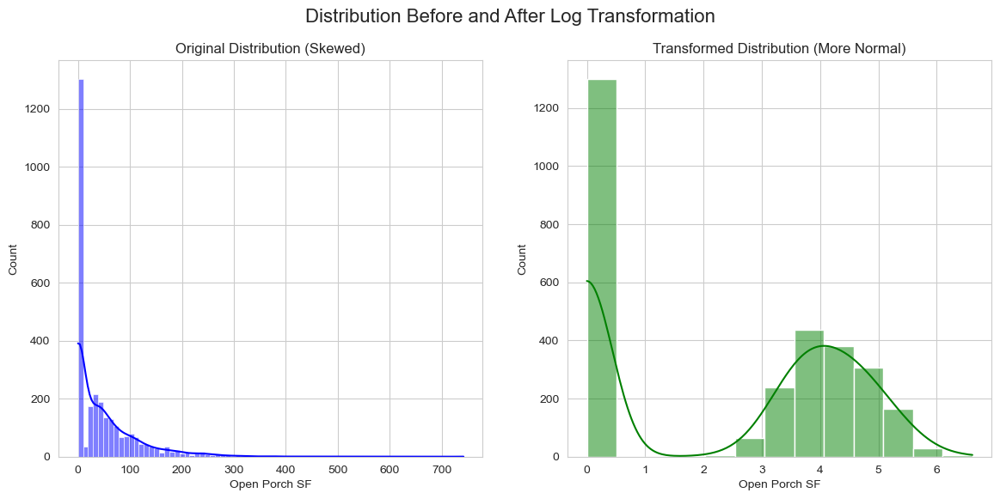

In [422]:
Open_Porch_SF_log1p = np.log1p(df['Open Porch SF'])

# Create a figure with two subplots, side-by-side
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('Distribution Before and After Log Transformation', fontsize=16)

# Plot Original Distribution
sns.histplot(df['Open Porch SF'], kde=True, ax=axes[0], color='blue')
axes[0].set_title('Original Distribution (Skewed)')

# Plot Transformed Distribution
sns.histplot(Open_Porch_SF_log1p, kde=True, ax=axes[1], color='green')
axes[1].set_title('Transformed Distribution (More Normal)')

In [423]:
df['Transformed Open Porch SF'] = np.round(Open_Porch_SF_log1p, decimals=2)
df = df.drop(['Open Porch SF'], axis=1)

#### Enclosed Porch

In [424]:
df['Enclosed Porch'].unique()

array([   0,  170,  184,  154,   80,  220,  186,  156,  120,  112,  150,
        164,  189,  205,  113,  216,  135,  130,  202,  126,  334,  246,
        196,   18,  158,  114,   60,   41,  128,   35,   48,   32,   64,
        364,   40,  318,  248,  168,   45,  239,  176,   77,   52,   56,
         36,  136,   96,  242,   42,   86,  162,   98,  265,   50,  280,
        222,  144,  209,   24,   91,  236,  218,  228,   84,  264,  260,
        240,  203,  140,  252,  100,  134,  432,  198,  116,  169,  148,
        244,   25,   81,  102,  160,  386,  226,  238,  115,   94,  208,
        105,   54,   51,   34,  268,   30,  213,  288,   90,  192,  177,
        211,  185,   55,  180,   44,   57,   78,  137,   72,  368,   70,
        165,   92,   16,  123,   66,  210,   68,  109,  194,  139,  219,
        259,  212,   20,  101,   87,  117,  204,  122,  108,  190,  231,
        138,  183,  254,  301,  121,  207,  224,  172,  174,   99,  249,
        291,  145,  214,  275,  290,  175,   26,  1

Text(0.5, 1.0, 'Enclosed Porch vs. House Style')

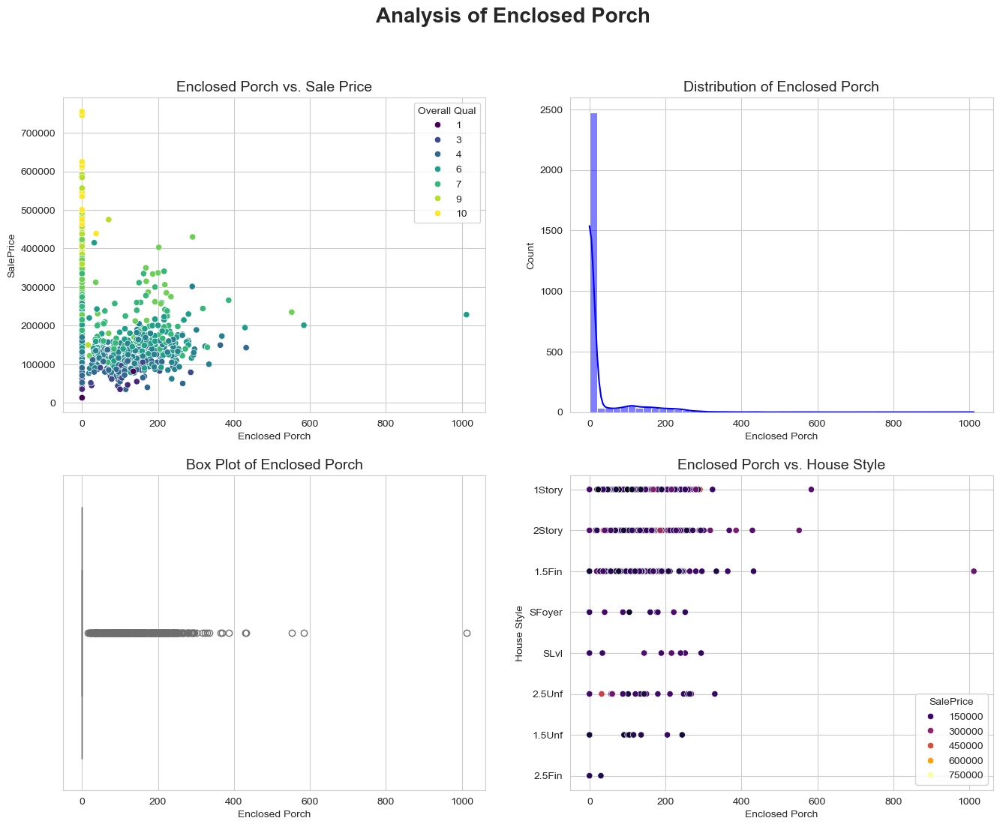

In [425]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Analysis of Enclosed Porch', fontsize=20, weight='bold')

sns.scatterplot(x='Enclosed Porch', y='SalePrice', hue='Overall Qual', legend=True ,palette='viridis', data=df, ax=axes[0,0])
axes[0,0].set_title('Enclosed Porch vs. Sale Price', fontsize=14)

sns.histplot(df['Enclosed Porch'], kde=True, color='blue', bins=50, ax=axes[0, 1])
axes[0, 1].set_title('Distribution of Enclosed Porch', fontsize=14)

sns.boxplot(x=df['Enclosed Porch'], color='lightcoral', ax=axes[1, 0])
axes[1, 0].set_title('Box Plot of Enclosed Porch', fontsize=14)

sns.scatterplot(x='Enclosed Porch', y='House Style', hue='SalePrice', legend=True ,palette='inferno', data=df, ax=axes[1,1])
axes[1, 1].set_title('Enclosed Porch vs. House Style', fontsize=14)

In [426]:
Outliers_Enclosed_Porch = detect_outliers_IQR(df['Enclosed Porch'])
print(Outliers_Enclosed_Porch)
print('Number of data:',len(Outliers_Enclosed_Porch['index']))

# These samples are not actual outliers. Because they are true values in this concept so they can be solved by Log transform 

#intfloat_features_outliers['index'].extend(Outliers_Enclosed_Porch['index'])
#intfloat_features_outliers['value'].extend(Outliers_Enclosed_Porch['value'])

{'index': [6, 25, 61, 82, 87, 89, 114, 120, 126, 128, 131, 132, 143, 150, 156, 167, 168, 171, 172, 174, 176, 179, 180, 183, 184, 186, 187, 189, 192, 193, 194, 196, 197, 198, 200, 201, 202, 204, 207, 208, 210, 211, 212, 213, 215, 234, 235, 236, 274, 276, 285, 286, 287, 288, 292, 293, 296, 304, 305, 307, 314, 327, 332, 338, 339, 495, 501, 502, 552, 553, 561, 576, 582, 602, 609, 615, 617, 621, 628, 632, 636, 638, 639, 649, 651, 656, 657, 658, 660, 661, 663, 668, 670, 674, 679, 691, 692, 693, 694, 697, 700, 702, 703, 704, 707, 708, 710, 711, 712, 713, 716, 722, 723, 724, 725, 726, 727, 735, 737, 738, 741, 744, 745, 746, 747, 749, 752, 754, 755, 756, 757, 758, 759, 760, 761, 776, 780, 787, 803, 804, 887, 895, 896, 905, 906, 912, 919, 923, 924, 925, 929, 939, 940, 941, 942, 943, 962, 988, 1001, 1009, 1013, 1015, 1032, 1106, 1155, 1156, 1182, 1189, 1204, 1207, 1224, 1252, 1254, 1255, 1258, 1259, 1262, 1263, 1266, 1285, 1290, 1291, 1294, 1296, 1297, 1298, 1302, 1307, 1308, 1310, 1311, 1312, 13

Text(0.5, 1.0, 'Transformed Distribution (More Normal)')

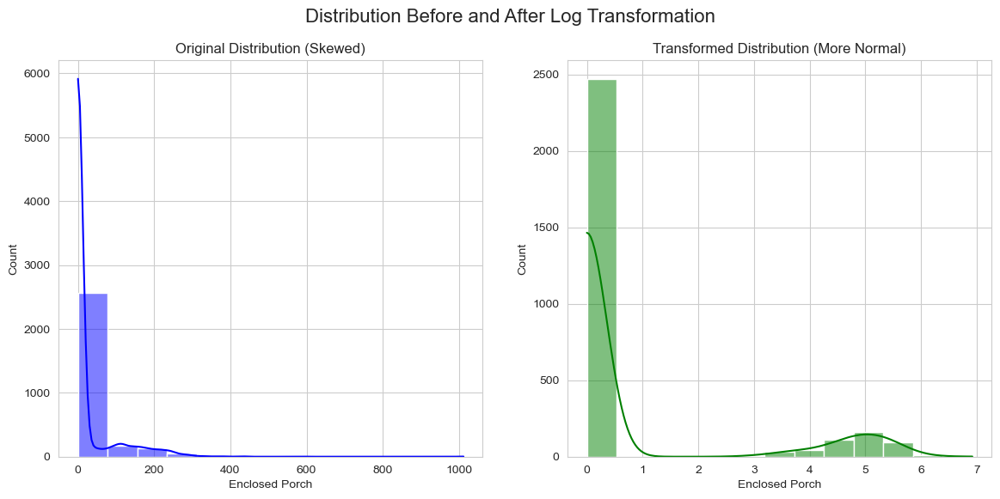

In [427]:
Enclosed_Porch_log1p = np.log1p(df['Enclosed Porch'])

# Create a figure with two subplots, side-by-side
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('Distribution Before and After Log Transformation', fontsize=16)

# Plot Original Distribution
sns.histplot(df['Enclosed Porch'], kde=True, ax=axes[0], color='blue')
axes[0].set_title('Original Distribution (Skewed)')

# Plot Transformed Distribution
sns.histplot(Enclosed_Porch_log1p, kde=True, ax=axes[1], color='green')
axes[1].set_title('Transformed Distribution (More Normal)')

In [428]:
df['Transformed Enclosed Porch'] = np.round(Enclosed_Porch_log1p, decimals=2)
df = df.drop(['Enclosed Porch'], axis=1)

#### 3Ssn Porch

In [429]:
df['3Ssn Porch'].unique()

array([  0, 238, 224, 144, 508, 168, 255, 225, 360, 162, 140, 150, 182,
       153, 320, 174, 304, 216, 407,  96, 245, 120, 219, 180, 196, 176,
        86,  23, 290, 323, 130], dtype=int64)

Text(0.5, 1.0, '3Ssn Porch vs. House Style')

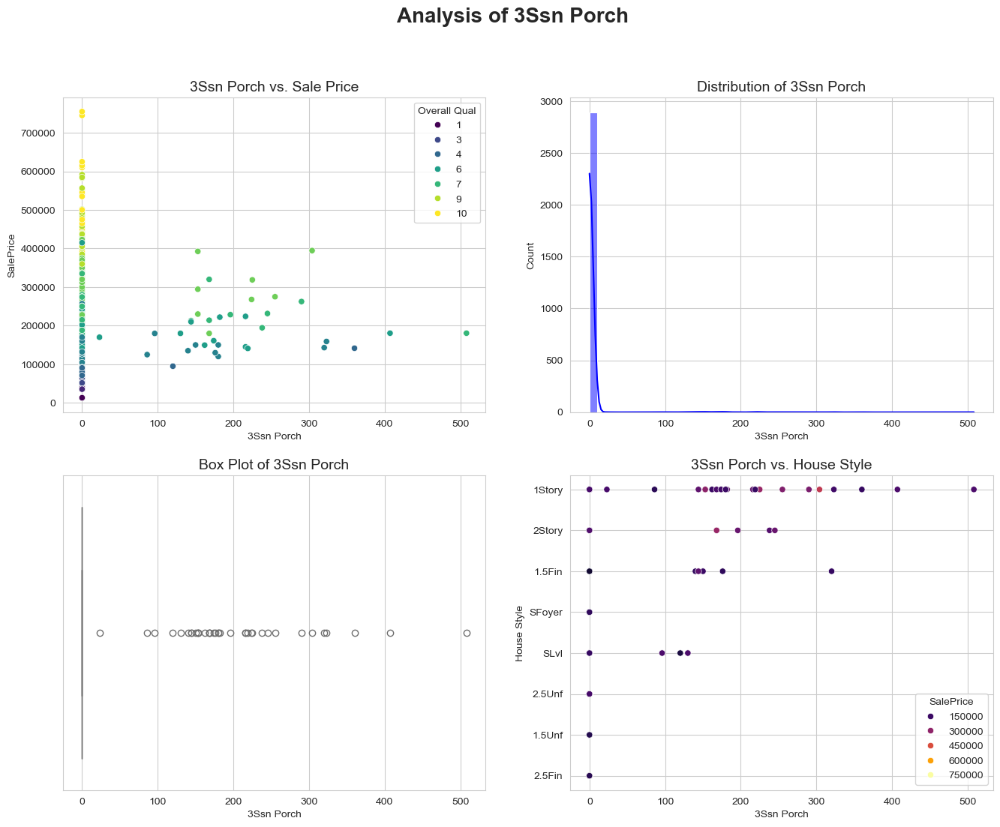

In [430]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Analysis of 3Ssn Porch', fontsize=20, weight='bold')

sns.scatterplot(x='3Ssn Porch', y='SalePrice', hue='Overall Qual', legend=True ,palette='viridis', data=df, ax=axes[0,0])
axes[0,0].set_title('3Ssn Porch vs. Sale Price', fontsize=14)

sns.histplot(df['3Ssn Porch'], kde=True, color='blue', bins=50, ax=axes[0, 1])
axes[0, 1].set_title('Distribution of 3Ssn Porch', fontsize=14)

sns.boxplot(x=df['3Ssn Porch'], color='lightcoral', ax=axes[1, 0])
axes[1, 0].set_title('Box Plot of 3Ssn Porch', fontsize=14)

sns.scatterplot(x='3Ssn Porch', y='House Style', hue='SalePrice', legend=True ,palette='inferno', data=df, ax=axes[1,1])
axes[1, 1].set_title('3Ssn Porch vs. House Style', fontsize=14)

In [431]:
Outliers_3Ssn_Porch = detect_outliers_IQR(df['3Ssn Porch'])
print(Outliers_3Ssn_Porch)
print('Number of data:',len(Outliers_3Ssn_Porch['index']))

# These samples are not actual outliers. Because they are true values in this concept so they can be solved by Log transform 

#intfloat_features_outliers['index'].extend(Outliers_3Ssn_Porch['index'])
#intfloat_features_outliers['value'].extend(Outliers_3Ssn_Porch['value'])

{'index': [79, 104, 271, 364, 492, 563, 574, 599, 616, 655, 745, 938, 944, 985, 1001, 1023, 1050, 1188, 1208, 1212, 1441, 1541, 1559, 1560, 1597, 1916, 2008, 2088, 2094, 2234, 2244, 2316, 2410, 2525, 2549, 2591, 2765], 'value': [238, 224, 144, 508, 168, 255, 225, 360, 162, 140, 150, 182, 153, 320, 168, 174, 304, 216, 407, 96, 245, 216, 153, 153, 120, 219, 144, 180, 196, 176, 86, 168, 23, 290, 180, 323, 130]}
Number of data: 37


Text(0.5, 1.0, 'Transformed Distribution (More Normal)')

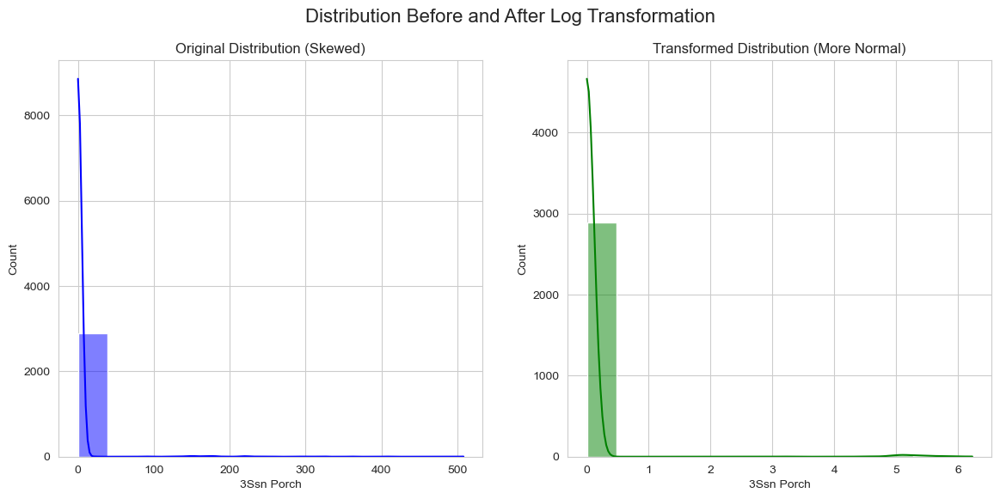

In [432]:
# Most houses do not have 3Ssn Porch, so transformation operations can be ignored

Three3Ssn_Porch_log1p = np.log1p(df['3Ssn Porch'])

# Create a figure with two subplots, side-by-side
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('Distribution Before and After Log Transformation', fontsize=16)

# Plot Original Distribution
sns.histplot(df['3Ssn Porch'], kde=True, ax=axes[0], color='blue')
axes[0].set_title('Original Distribution (Skewed)')

# Plot Transformed Distribution
sns.histplot(Three3Ssn_Porch_log1p, kde=True, ax=axes[1], color='green')
axes[1].set_title('Transformed Distribution (More Normal)')

In [433]:
df['Transformed 3Ssn Porch'] = np.round(Three3Ssn_Porch_log1p, decimals=2)
df = df.drop(['3Ssn Porch'], axis=1)

#### Screen Porch

In [434]:
df['Screen Porch'].unique()

array([  0, 120, 144, 140, 210, 165, 256, 216,  90, 204, 143, 160, 182,
       385, 240, 168, 148,  95, 266, 166, 116, 161, 200, 155, 108, 291,
       490, 170, 192, 180, 156, 196, 197, 152, 121,  92, 288, 185, 342,
       189, 252, 234, 255, 111, 112, 231,  40, 100,  60, 142, 110, 396,
       225, 117, 195, 145, 224, 115, 198, 233, 190, 141, 208,  80, 176,
        94, 164, 178, 273, 130, 480, 220,  64, 163, 287, 175, 576, 227,
       265, 221, 171, 135, 322, 174, 147, 276, 260, 217, 201, 109,  99,
       150, 126, 259, 184,  84, 154,  53, 153, 228, 138, 263,  88, 280,
       123, 440, 374, 119, 222, 264, 270,  63, 122, 128, 162, 410, 271,
       312, 348, 113, 104], dtype=int64)

Text(0.5, 1.0, 'Screen Porch vs. House Style')

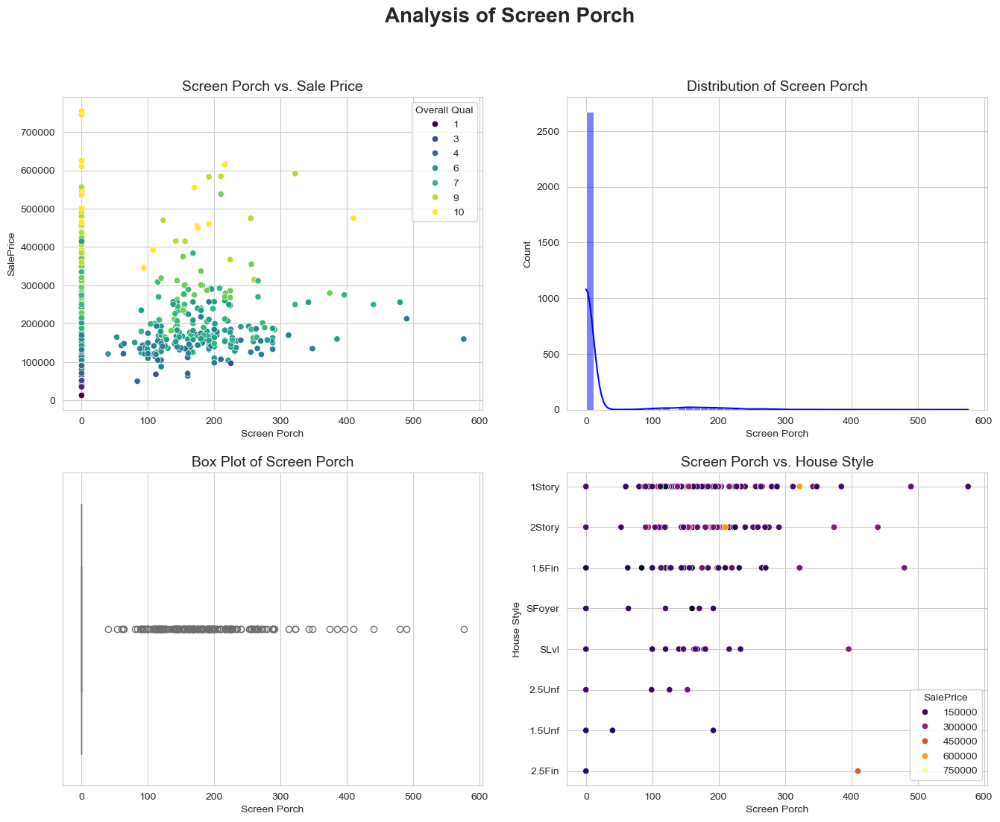

In [435]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Analysis of Screen Porch', fontsize=20, weight='bold')

sns.scatterplot(x='Screen Porch', y='SalePrice', hue='Overall Qual', legend=True ,palette='viridis', data=df, ax=axes[0,0])
axes[0,0].set_title('Screen Porch vs. Sale Price', fontsize=14)

sns.histplot(df['Screen Porch'], kde=True, color='blue', bins=50, ax=axes[0, 1])
axes[0, 1].set_title('Distribution of Screen Porch', fontsize=14)

sns.boxplot(x=df['Screen Porch'], color='lightcoral', ax=axes[1, 0])
axes[1, 0].set_title('Box Plot of Screen Porch', fontsize=14)

sns.scatterplot(x='Screen Porch', y='House Style', hue='SalePrice', legend=True ,palette='inferno', data=df, ax=axes[1,1])
axes[1, 1].set_title('Screen Porch vs. House Style', fontsize=14)

In [436]:
Outliers_Screen_Porch = detect_outliers_IQR(df['Screen Porch'])
print(Outliers_Screen_Porch)
print('Number of data:',len(Outliers_Screen_Porch['index']))

# These samples are not actual outliers. Because they are true values in this concept so they can be solved by Log transform 

#intfloat_features_outliers['index'].extend(Outliers_Screen_Porch['index'])
#intfloat_features_outliers['value'].extend(Outliers_Screen_Porch['value'])

{'index': [1, 7, 14, 15, 32, 53, 60, 71, 78, 81, 121, 145, 147, 156, 159, 165, 167, 188, 196, 203, 219, 245, 277, 289, 292, 300, 303, 308, 327, 354, 369, 387, 423, 433, 439, 494, 546, 585, 589, 596, 598, 605, 606, 607, 623, 624, 625, 626, 627, 631, 635, 644, 646, 657, 659, 667, 677, 698, 730, 732, 741, 759, 768, 778, 782, 785, 787, 796, 832, 834, 836, 851, 855, 872, 879, 901, 917, 918, 920, 922, 928, 947, 948, 951, 955, 989, 999, 1002, 1017, 1027, 1028, 1034, 1046, 1059, 1063, 1070, 1080, 1150, 1157, 1177, 1178, 1186, 1187, 1204, 1214, 1226, 1228, 1237, 1238, 1239, 1242, 1243, 1260, 1281, 1288, 1351, 1376, 1403, 1405, 1406, 1408, 1409, 1410, 1419, 1425, 1449, 1459, 1487, 1509, 1510, 1523, 1534, 1535, 1550, 1561, 1562, 1592, 1612, 1614, 1633, 1637, 1642, 1645, 1649, 1657, 1685, 1690, 1693, 1773, 1784, 1819, 1827, 1849, 1851, 1852, 1853, 1856, 1866, 1867, 1893, 1895, 1900, 1906, 1912, 1918, 1926, 1927, 1945, 1952, 1964, 1998, 2005, 2007, 2019, 2025, 2030, 2034, 2035, 2043, 2067, 2072, 20

Text(0.5, 1.0, 'Transformed Distribution (More Normal)')

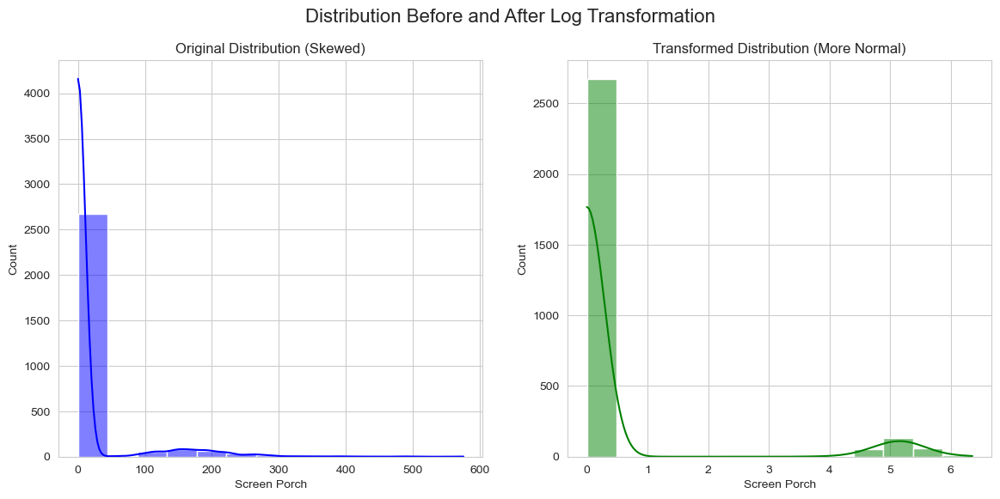

In [437]:
Screen_Porch_log1p = np.log1p(df['Screen Porch'])

# Create a figure with two subplots, side-by-side
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('Distribution Before and After Log Transformation', fontsize=16)

# Plot Original Distribution
sns.histplot(df['Screen Porch'], kde=True, ax=axes[0], color='blue')
axes[0].set_title('Original Distribution (Skewed)')

# Plot Transformed Distribution
sns.histplot(Screen_Porch_log1p, kde=True, ax=axes[1], color='green')
axes[1].set_title('Transformed Distribution (More Normal)')

In [438]:
df['Transformed Screen Porch'] = np.round(Screen_Porch_log1p, decimals=2)
df = df.drop(['Screen Porch'], axis=1)

#### Pool Area

In [439]:
df['Pool Area'].unique()

array([  0, 144, 480, 576, 555, 368, 444, 228, 561, 519, 648, 800, 512,
       738], dtype=int64)

Text(0.5, 1.0, 'Pool Area vs. Pool QC')

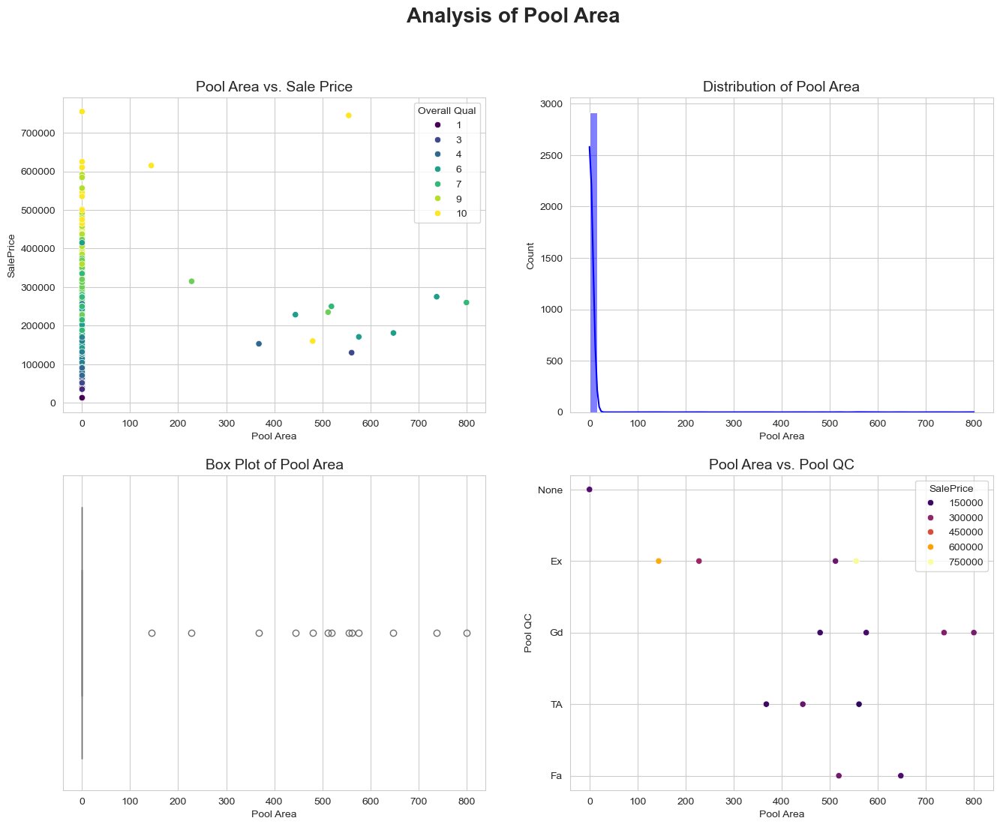

In [440]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Analysis of Pool Area', fontsize=20, weight='bold')

sns.scatterplot(x='Pool Area', y='SalePrice', hue='Overall Qual', legend=True ,palette='viridis', data=df, ax=axes[0,0])
axes[0,0].set_title('Pool Area vs. Sale Price', fontsize=14)

sns.histplot(df['Pool Area'], kde=True, color='blue', bins=50, ax=axes[0, 1])
axes[0, 1].set_title('Distribution of Pool Area', fontsize=14)

sns.boxplot(x=df['Pool Area'], color='lightcoral', ax=axes[1, 0])
axes[1, 0].set_title('Box Plot of Pool Area', fontsize=14)

sns.scatterplot(x='Pool Area', y='Pool QC', hue='SalePrice', legend=True ,palette='inferno', data=df, ax=axes[1,1])
axes[1, 1].set_title('Pool Area vs. Pool QC', fontsize=14)

In [441]:
# None = The house does not have Pool
Outliers_Pool_Area = detect_outliers_IQR(df['Pool Area'])
print(Outliers_Pool_Area)
print('Number of data:',len(Outliers_Pool_Area['index']))

# These samples are not actual outliers. Because they are true values in this concept so they can be solved by Log transform 

#intfloat_features_outliers['index'].extend(Outliers_Pool_Area['index'])
#intfloat_features_outliers['value'].extend(Outliers_Pool_Area['value'])

{'index': [1063, 1498, 1566, 1760, 1940, 2089, 2230, 2278, 2350, 2357, 2498, 2570, 2735], 'value': [144, 480, 576, 555, 368, 444, 228, 561, 519, 648, 800, 512, 738]}
Number of data: 13


Text(0.5, 1.0, 'Transformed Distribution (More Normal)')

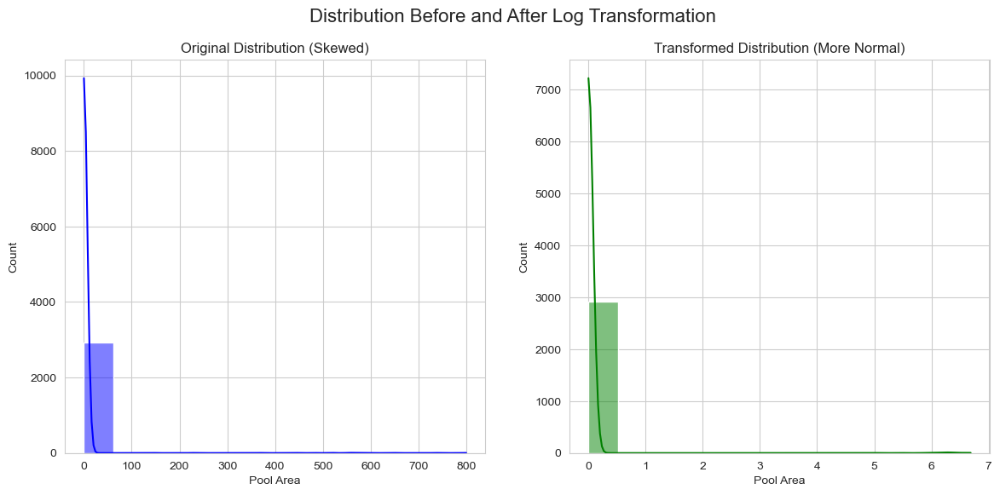

In [442]:
# Most houses do not have Pool, so transformation operations can be ignored

Pool_Area_log1p = np.log1p(df['Pool Area'])

# Create a figure with two subplots, side-by-side
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('Distribution Before and After Log Transformation', fontsize=16)

# Plot Original Distribution
sns.histplot(df['Pool Area'], kde=True, ax=axes[0], color='blue')
axes[0].set_title('Original Distribution (Skewed)')

# Plot Transformed Distribution
sns.histplot(Pool_Area_log1p, kde=True, ax=axes[1], color='green')
axes[1].set_title('Transformed Distribution (More Normal)')

In [443]:
df['Transformed Pool Area'] = np.round(Pool_Area_log1p, decimals=2)
df = df.drop(['Pool Area'], axis=1)

#### Misc Val

In [444]:
df['Misc Val'].unique()

array([    0, 12500,   500,   700,   400,   450,  1500,   300,   600,
        1200,  3500,  2000,  2500,    54,    80,   490,   480,   350,
         650,   900,   800,   750,  1400,  6500,  1150,  1000,  4500,
        3000,   560,  1300,  8300, 15500, 17000,  1512,   455,   460,
         620,   420], dtype=int64)

Text(0.5, 1.0, 'PMisc Val vs. Misc Feature')

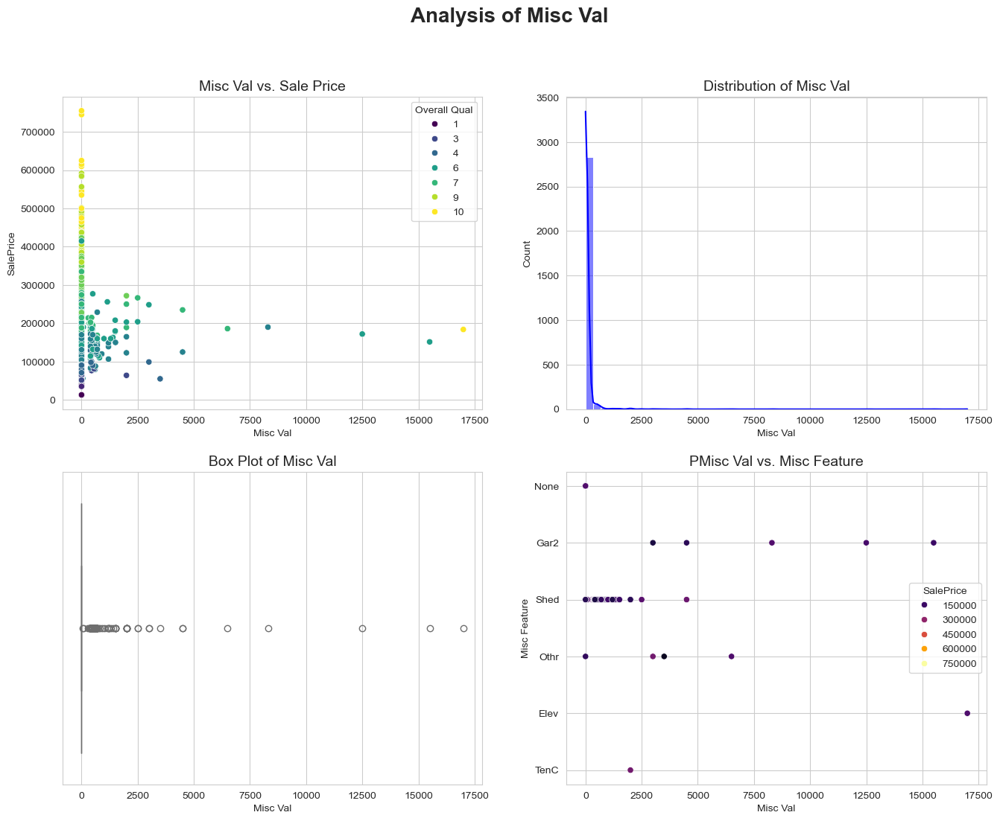

In [445]:
sns.set_style("whitegrid")
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Analysis of Misc Val', fontsize=20, weight='bold')

sns.scatterplot(x='Misc Val', y='SalePrice', hue='Overall Qual', legend=True ,palette='viridis', data=df, ax=axes[0,0])
axes[0,0].set_title('Misc Val vs. Sale Price', fontsize=14)

sns.histplot(df['Misc Val'], kde=True, color='blue', bins=50, ax=axes[0, 1])
axes[0, 1].set_title('Distribution of Misc Val', fontsize=14)

sns.boxplot(x=df['Misc Val'], color='lightcoral', ax=axes[1, 0])
axes[1, 0].set_title('Box Plot of Misc Val', fontsize=14)

sns.scatterplot(x='Misc Val', y='Misc Feature', hue='SalePrice', legend=True ,palette='inferno', data=df, ax=axes[1,1])
axes[1, 1].set_title('PMisc Val vs. Misc Feature', fontsize=14)

In [446]:
Outliers_Misc_Val = detect_outliers_IQR(df['Misc Val'])
print(Outliers_Misc_Val)
print('Number of data:',len(Outliers_Misc_Val['index']))

# These samples are not actual outliers. Because they are true values in this concept so they can be solved by Log transform 

#intfloat_features_outliers['index'].extend(Outliers_Misc_Val['index'])
#intfloat_features_outliers['value'].extend(Outliers_Misc_Val['value'])

{'index': [2, 11, 23, 76, 84, 114, 119, 130, 134, 139, 158, 184, 206, 234, 235, 260, 264, 290, 295, 306, 310, 336, 346, 348, 357, 398, 419, 560, 582, 587, 601, 646, 670, 751, 800, 895, 902, 936, 963, 974, 981, 985, 1006, 1013, 1142, 1149, 1153, 1189, 1239, 1248, 1261, 1262, 1288, 1329, 1333, 1356, 1380, 1430, 1442, 1507, 1526, 1557, 1570, 1598, 1607, 1609, 1651, 1733, 1822, 1861, 1871, 1880, 1881, 1884, 1886, 1903, 1920, 1941, 1956, 1979, 2065, 2115, 2167, 2168, 2180, 2195, 2342, 2350, 2479, 2533, 2544, 2545, 2588, 2591, 2605, 2668, 2675, 2678, 2700, 2706, 2710, 2816, 2927], 'value': [12500, 500, 700, 400, 400, 500, 400, 450, 1500, 300, 600, 1200, 3500, 450, 400, 450, 2000, 500, 2500, 54, 80, 600, 490, 700, 480, 500, 1200, 400, 350, 650, 450, 2000, 450, 400, 600, 900, 800, 1500, 2500, 600, 700, 700, 500, 750, 2000, 400, 650, 450, 1400, 1500, 450, 6500, 1150, 600, 400, 1000, 600, 400, 4500, 3000, 400, 560, 700, 500, 1300, 400, 500, 2000, 400, 8300, 400, 600, 15500, 480, 1200, 2000, 500,

Text(0.5, 1.0, 'Transformed Distribution (More Normal)')

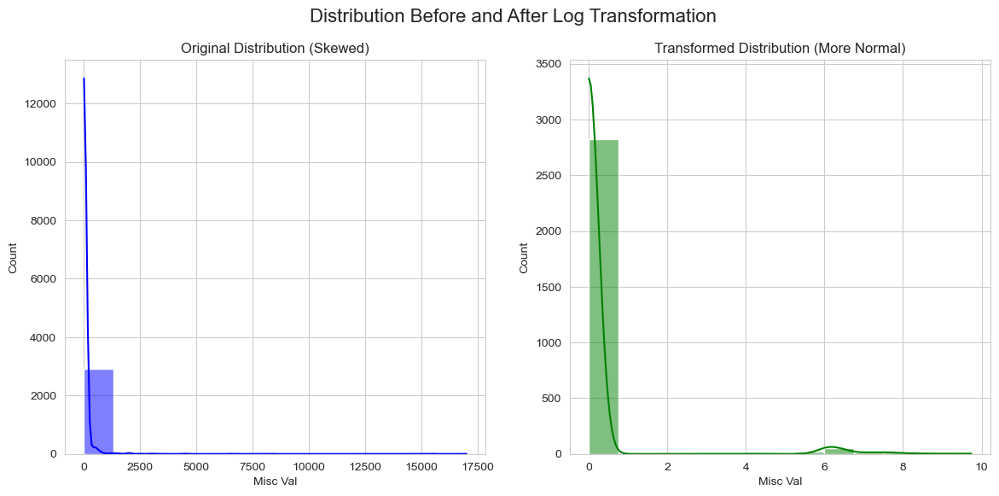

In [447]:
# Most houses do not have miscellaneous feature, so transformation operations can be ignored

Misc_Val_log1p = np.log1p(df['Misc Val'])

# Create a figure with two subplots, side-by-side
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('Distribution Before and After Log Transformation', fontsize=16)

# Plot Original Distribution
sns.histplot(df['Misc Val'], kde=True, ax=axes[0], color='blue')
axes[0].set_title('Original Distribution (Skewed)')

# Plot Transformed Distribution
sns.histplot(Misc_Val_log1p, kde=True, ax=axes[1], color='green')
axes[1].set_title('Transformed Distribution (More Normal)')

In [448]:
df['Transformed Misc Val'] = np.round(Misc_Val_log1p, decimals=2)
df = df.drop(['Misc Val'], axis=1)

#### Mo Sold

In [449]:
df['Mo Sold'].unique()

array([ 5,  6,  4,  3,  1,  2,  7, 10,  8, 11,  9, 12], dtype=int64)

Text(0.5, 1.0, 'Sale Price Distribution by Mo Sold')

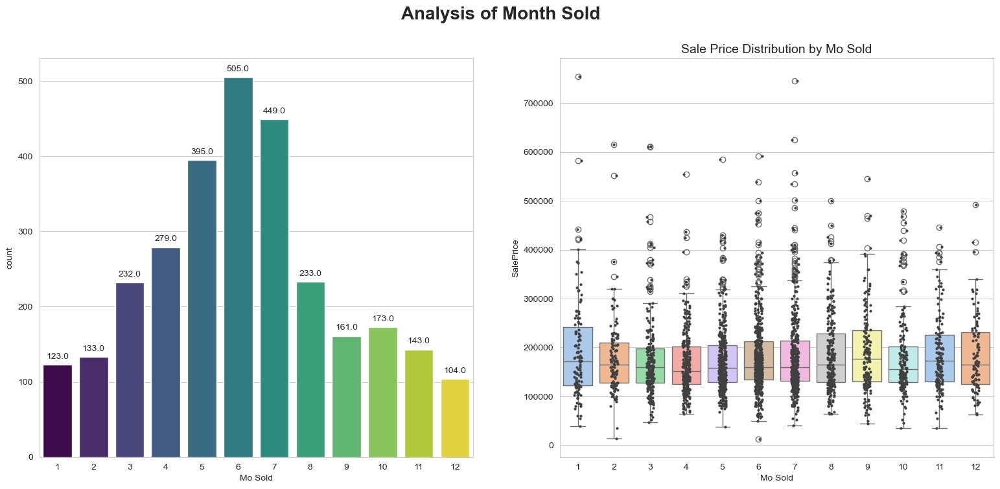

In [450]:
fig, axes = plt.subplots(1, 2, figsize=(19, 8))
fig.suptitle('Analysis of Month Sold', fontsize=20, weight='bold')

ax1 = sns.countplot(x='Mo Sold', hue='Mo Sold', legend=False,data=df, palette='viridis', ax=axes[0])

for p in ax1.patches:
    ax1.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 9), textcoords='offset points')
    

sns.boxplot(x='Mo Sold', y='SalePrice', hue='Mo Sold', legend=False,data=df, palette='pastel', ax=axes[1])
sns.stripplot(x='Mo Sold', y='SalePrice', data=df, color=".25", size=3, ax=axes[1])
axes[1].set_title('Sale Price Distribution by Mo Sold', fontsize=14)

In [451]:
Outliers_Mo_Sold = detect_outliers_freq(df['Mo Sold'])
print(Outliers_Mo_Sold)
print('Number of data:',len(Outliers_Mo_Sold['index']))

# These samples are not actual outliers. Because they are true values in this concept.

#intfloat_features_outliers['index'].extend(Outliers_Mo_Sold['index'])
#intfloat_features_outliers['value'].extend(Outliers_Mo_Sold['value'])

{'index': [], 'value': []}
Number of data: 0


#### Yr Sold

In [452]:
df['Yr Sold'].unique()

array([2010, 2009, 2008, 2007, 2006], dtype=int64)

Text(0.5, 1.0, 'Sale Price Distribution by Year Sold')

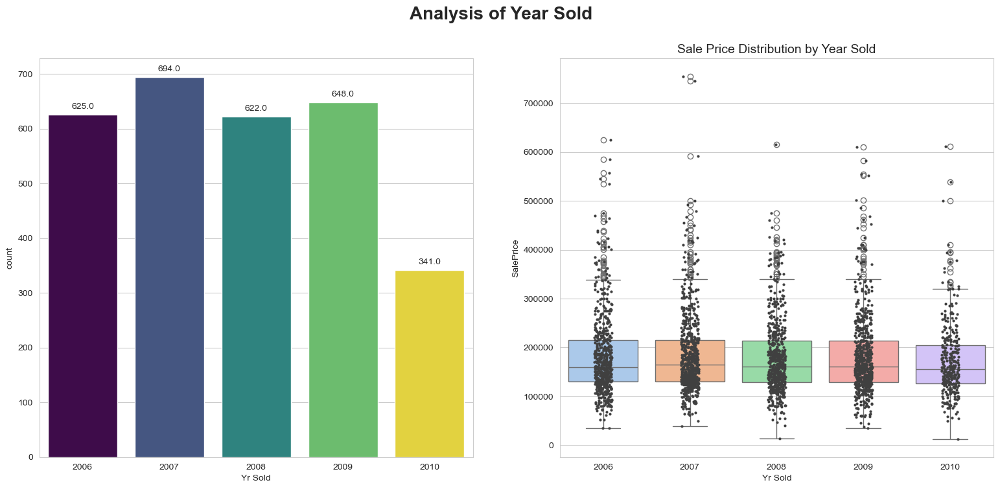

In [453]:
fig, axes = plt.subplots(1, 2, figsize=(19, 8))
fig.suptitle('Analysis of Year Sold', fontsize=20, weight='bold')

ax1 = sns.countplot(x='Yr Sold', hue='Yr Sold', legend=False,data=df, palette='viridis', ax=axes[0])

for p in ax1.patches:
    ax1.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 9), textcoords='offset points')

sns.boxplot(x='Yr Sold', y='SalePrice', hue='Yr Sold', legend=False ,data=df, palette='pastel', ax=axes[1])
sns.stripplot(x='Yr Sold', y='SalePrice', data=df, color=".25", size=3, ax=axes[1])
axes[1].set_title('Sale Price Distribution by Year Sold', fontsize=14)

In [454]:
Outliers_Yr_Sold = detect_outliers_freq(df['Yr Sold'])
print(Outliers_Yr_Sold)
print('Number of data:',len(Outliers_Yr_Sold['index']))

# These samples are not actual outliers. Because they are true values in this concept.

#intfloat_features_outliers['index'].extend(Outliers_Yr_Sold['index'])
#intfloat_features_outliers['value'].extend(Outliers_Yr_Sold['value'])

{'index': [], 'value': []}
Number of data: 0


In [455]:
len(list(set(intfloat_features_outliers['index'])))

0

#### OBJECT Feature

In [456]:
df.select_dtypes(['object']).columns

Index(['MS Zoning', 'Street', 'Alley', 'Lot Shape', 'Land Contour',
       'Utilities', 'Lot Config', 'Land Slope', 'Neighborhood', 'Condition 1',
       'Condition 2', 'Bldg Type', 'House Style', 'Roof Style', 'Roof Matl',
       'Exterior 1st', 'Exterior 2nd', 'Mas Vnr Type', 'Exter Qual',
       'Exter Cond', 'Foundation', 'Bsmt Qual', 'Bsmt Cond', 'Bsmt Exposure',
       'BsmtFin Type 1', 'BsmtFin Type 2', 'Heating', 'Heating QC',
       'Central Air', 'Electrical', 'Kitchen Qual', 'Functional',
       'Fireplace Qu', 'Garage Type', 'Garage Finish', 'Garage Qual',
       'Garage Cond', 'Paved Drive', 'Pool QC', 'Fence', 'Misc Feature',
       'Sale Type', 'Sale Condition'],
      dtype='object')

Number of Object type features: 43


C:\Users\sinas\AppData\Local\Temp\ipykernel_14400\1492397166.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(1, 2, figsize=(19, 8))


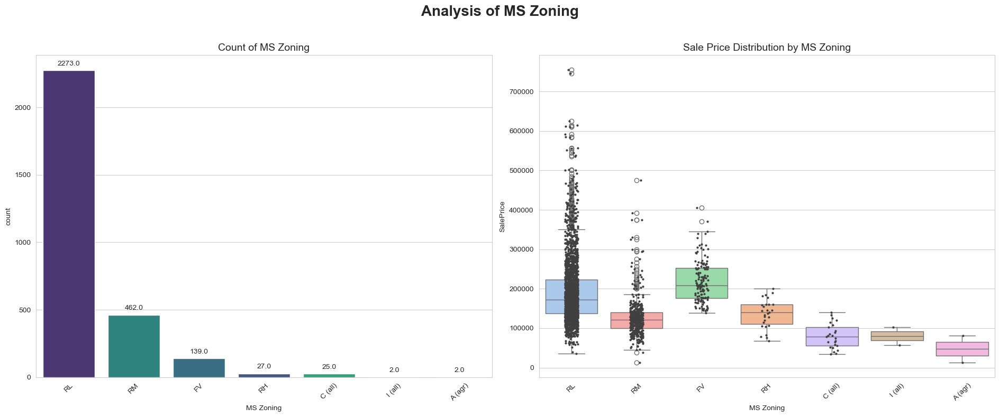

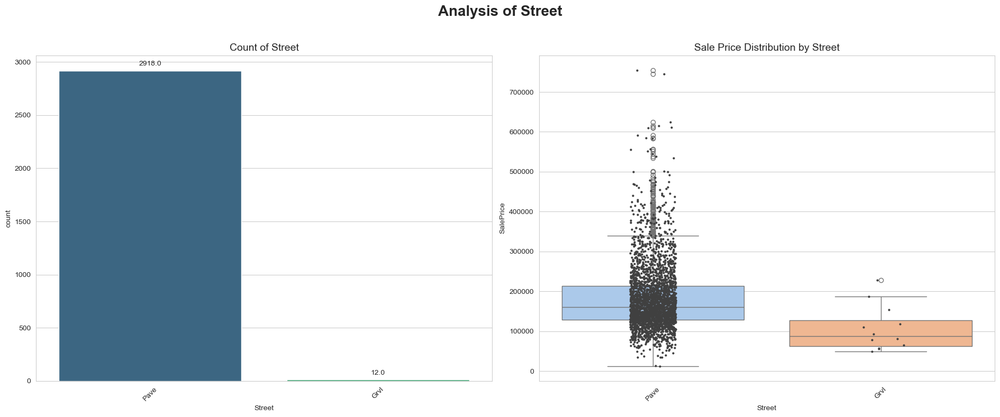

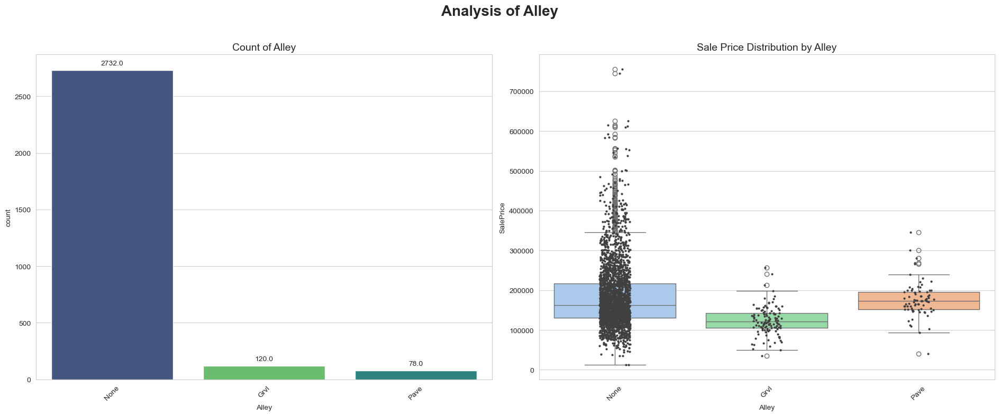

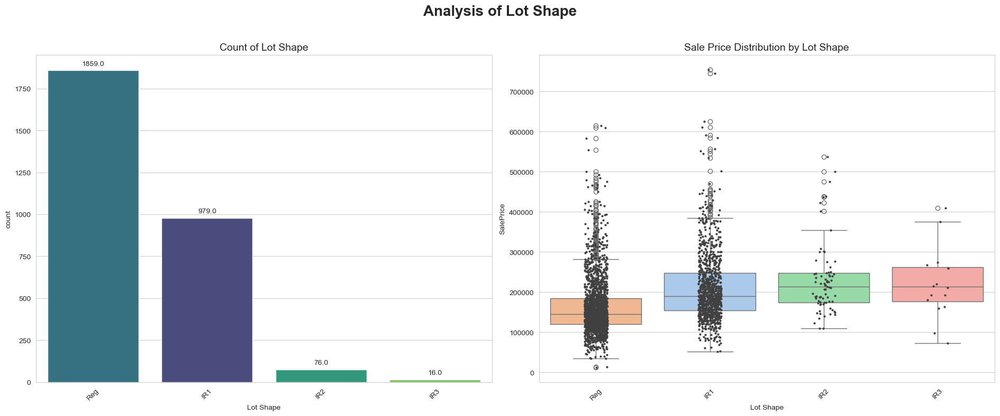

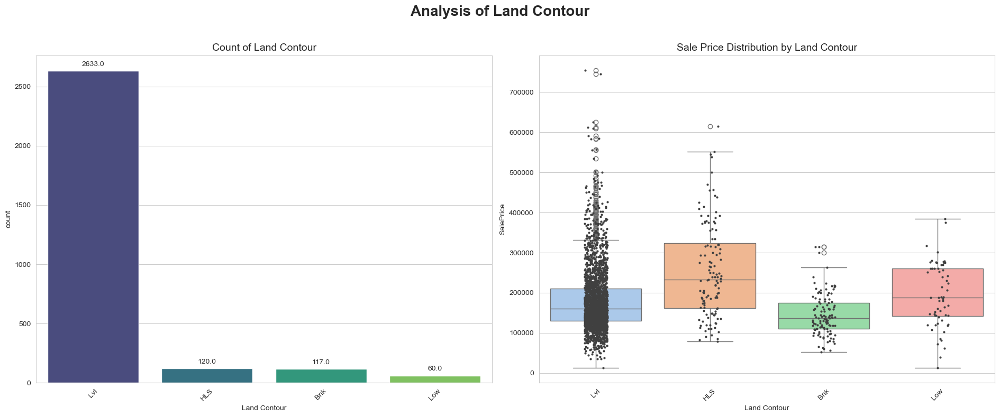

...

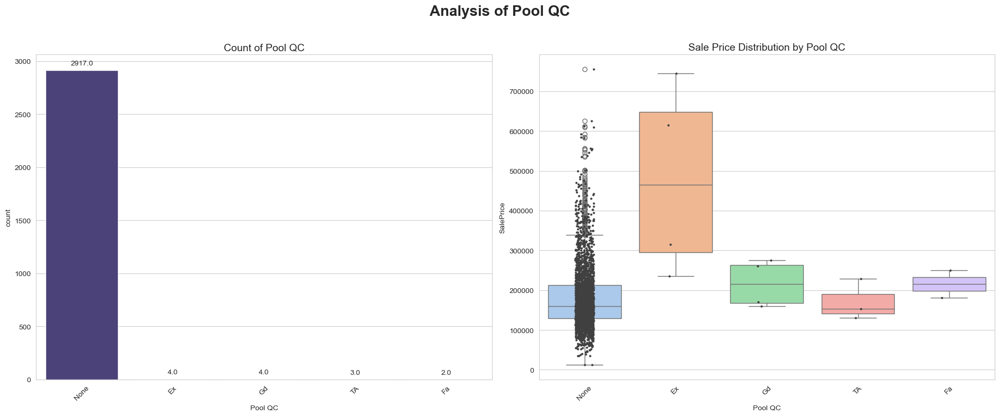

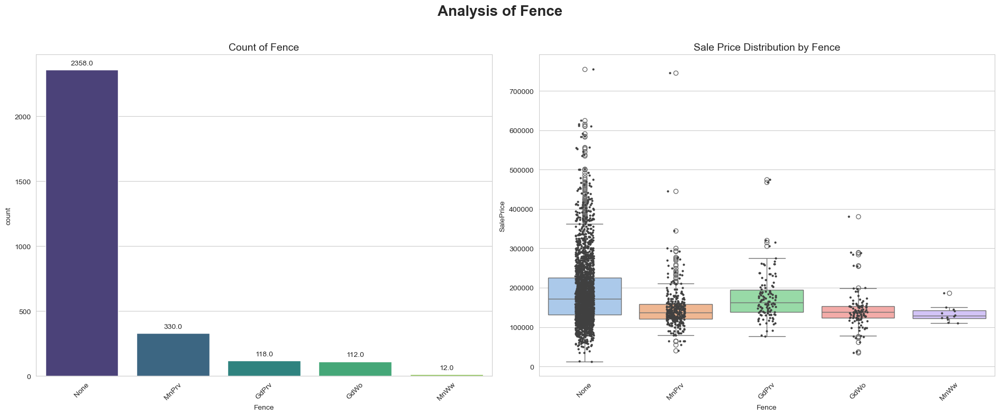

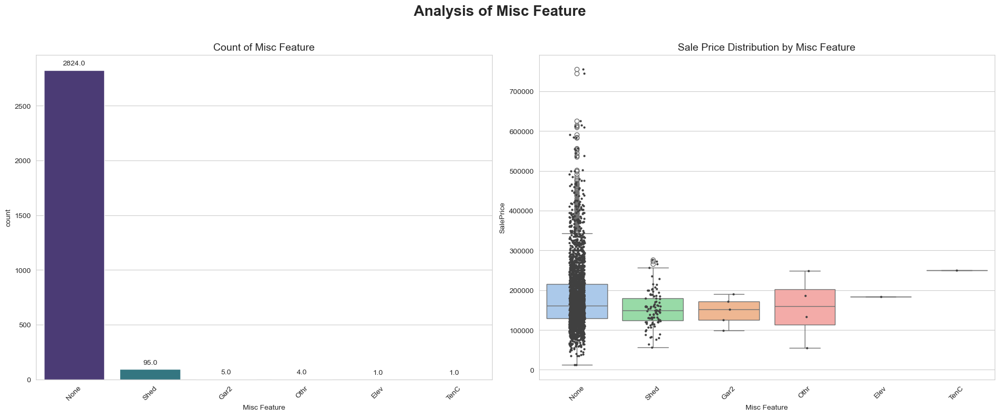

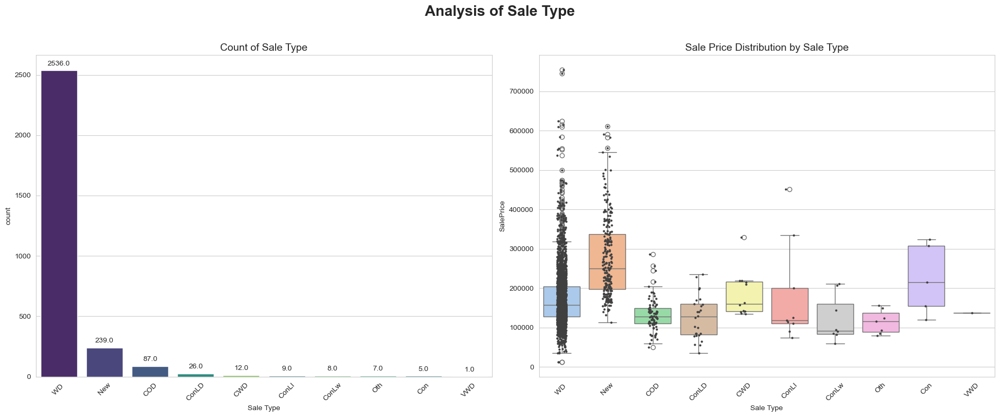

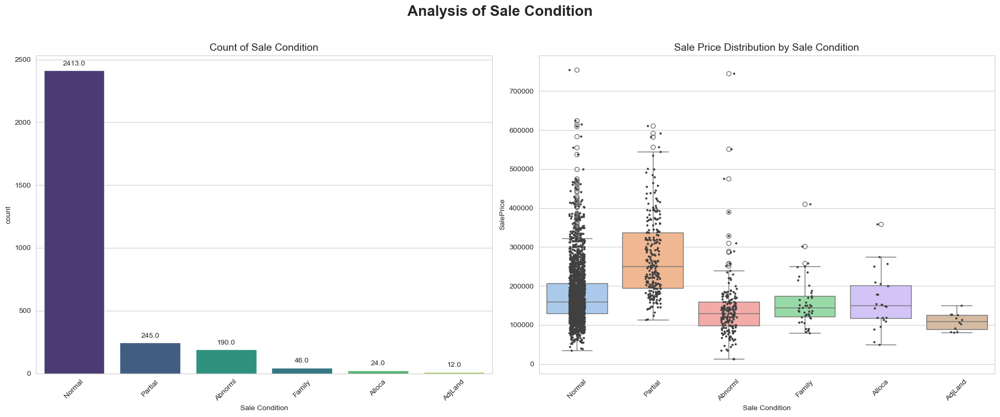

In [457]:
object_features = df.select_dtypes(include='object').columns
print(f'Number of Object type features: {len(object_features)}')

for feature in object_features:
    fig, axes = plt.subplots(1, 2, figsize=(19, 8))
    fig.suptitle(f'Analysis of {feature}', fontsize=20, weight='bold') # Dynamic title

    order = df[feature].value_counts().index
    ax1 = sns.countplot(x=feature, data=df, hue=feature, legend=False, palette='viridis', order=order, ax=axes[0])
    axes[0].set_title(f'Count of {feature}', fontsize=14)
    axes[0].tick_params(axis='x', rotation=45) # Rotate labels for readability

    for p in ax1.patches:
        ax1.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                     ha='center', va='center', xytext=(0, 9), textcoords='offset points')


    sns.boxplot(x=feature, y='SalePrice', hue=feature, legend=False, data=df, palette='pastel', order=order, ax=axes[1])
    sns.stripplot(x=feature, y='SalePrice', data=df, color=".25", size=3, order=order, ax=axes[1])
    axes[1].set_title(f'Sale Price Distribution by {feature}', fontsize=14)
    axes[1].tick_params(axis='x', rotation=45) # Rotate labels for readability

    plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()  

In [458]:
# These samples are not actual outliers. Because they are true values in this concept.
categorical_features_outliers = {'index':[],'value':[]}
total_num = 0
for feature_name in df.select_dtypes(['object']).columns:
    outliers_categorical = detect_outliers_freq(df[feature_name])
    #categorical_features_outliers['index'].extend(outliers_categorical['index'])
    #categorical_features_outliers['value'].extend(outliers_categorical['value'])
    print('Number of data %s: %i'%(feature_name,len(outliers_categorical['index'])))
    total_num = total_num + len(outliers_categorical['index'])
print('These samples are not actual outliers. Because they are true values in this concept.')
print('TOTAL Number:',total_num)

Number of data MS Zoning: 56
Number of data Street: 12
Number of data Alley: 0
Number of data Lot Shape: 16
Number of data Land Contour: 0
Number of data Utilities: 3
Number of data Lot Config: 14
Number of data Land Slope: 16
Number of data Neighborhood: 96
Number of data Condition 1: 63
Number of data Condition 2: 30
Number of data Bldg Type: 0
Number of data House Style: 51
Number of data Roof Style: 58
Number of data Roof Matl: 43
Number of data Exterior 1st: 14
Number of data Exterior 2nd: 52
Number of data Mas Vnr Type: 26
Number of data Exter Qual: 0
Number of data Exter Cond: 15
Number of data Foundation: 16
Number of data Bsmt Qual: 2
Number of data Bsmt Cond: 8
Number of data Bsmt Exposure: 0
Number of data BsmtFin Type 1: 0
Number of data BsmtFin Type 2: 0
Number of data Heating: 45
Number of data Heating QC: 3
Number of data Central Air: 0
Number of data Electrical: 9
Number of data Kitchen Qual: 1
Number of data Functional: 32
Number of data Fireplace Qu: 0
Number of data 

In [459]:
len(list(set(categorical_features_outliers['index'])))

0

In [460]:
Complete_Outliers_Index = list(set(intfloat_features_outliers['index'] + categorical_features_outliers['index']))
Number_Complete_Outliers = len(Complete_Outliers_Index)
print('Number Of Outliers Data:',Number_Complete_Outliers)

Number Of Outliers Data: 0


In [461]:
# In this dataset the number of outlier data is zero, so after removing them the number of samples and columns do not changed

df_cl_otlr = df.drop(Complete_Outliers_Index, axis=0)
print('Number of samples After removing outlier data: {}'.format(df_cl_otlr.shape[0]))
print('Number of columns After removing outlier data: {}'.format(df_cl_otlr.shape[1]))
df_cl_otlr = df_cl_otlr.reset_index()
df_cl_otlr.drop('index', axis=1, inplace=True)

Number of samples After removing outlier data: 2930
Number of columns After removing outlier data: 82


# Converting Categorical Features to Numerical (Ordinal/Nominal)

In [462]:
nominal_features = [
    'MS SubClass', 'MS Zoning', 'Street', 'Alley', 'Lot Shape', 'Land Contour',
    'Utilities', 'Lot Config', 'Land Slope', 'Neighborhood', 'Condition 1',
    'Condition 2', 'Bldg Type', 'House Style', 'Roof Style', 'Roof Matl',
    'Exterior 1st', 'Exterior 2nd', 'Mas Vnr Type', 'Foundation', 'Heating',
    'Central Air', 'Electrical', 'Garage Type', 'Misc Feature', 'Sale Type',
    'Sale Condition'
]

ordinal_features = [
    'Exter Qual', 'Exter Cond', 'Bsmt Qual', 'Bsmt Cond', 'Bsmt Exposure',
    'BsmtFin Type 1', 'BsmtFin Type 2', 'Heating QC', 'Kitchen Qual',
    'Functional', 'Fireplace Qu', 'Garage Finish', 'Garage Qual', 'Garage Cond',
    'Paved Drive', 'Pool QC', 'Fence', 'Overall Qual', 'Overall Cond'
]

In [463]:
print('Number of nominal features : ', len(nominal_features))
print('Number of ordinal features : ', len(ordinal_features))
print('Number of categorical features : ', len(nominal_features+ordinal_features))

Number of nominal features :  27
Number of ordinal features :  19
Number of categorical features :  46


In [464]:
cont_count_features = [x for x in df_cl_otlr.columns if x not in nominal_features+ordinal_features]
print('Number of continuous and countable features: ', len(cont_count_features))
print('Names of continuous and countable features: \n',cont_count_features)


Number of continuous and countable features:  36
Names of continuous and countable features: 
 ['Order', 'PID', 'Year Built', 'Year Remod/Add', 'Low Qual Fin SF', 'Bsmt Full Bath', 'Bsmt Half Bath', 'Full Bath', 'Half Bath', 'Bedroom AbvGr', 'Kitchen AbvGr', 'TotRms AbvGrd', 'Fireplaces', 'Garage Yr Blt', 'Garage Cars', 'Mo Sold', 'Yr Sold', 'SalePrice', 'Transformed Lot Frontage', 'Transformed Mas Vnr Area', 'Transformed BsmtFin SF 1', 'Transformed BsmtFin SF 2', 'Transformed Bsmt Unf SF', 'Transformed Total Bsmt SF', 'Transformed Garage Area', 'Transformed Lot Area', 'Transformed 1st Flr SF', 'Transformed 2nd Flr SF', 'Transformed Gr Liv Area', 'Transformed Wood Deck SF', 'Transformed Open Porch SF', 'Transformed Enclosed Porch', 'Transformed 3Ssn Porch', 'Transformed Screen Porch', 'Transformed Pool Area', 'Transformed Misc Val']


In [465]:
for feature_name in nominal_features:
    print('{} : {}'.format(feature_name,df_cl_otlr[feature_name].unique()))

MS SubClass : [ 20  60 120  50  85 160  80  30  90 190  45  70  75  40 180 150]
MS Zoning : ['RL' 'RH' 'FV' 'RM' 'C (all)' 'I (all)' 'A (agr)']
Street : ['Pave' 'Grvl']
Alley : ['None' 'Pave' 'Grvl']
Lot Shape : ['IR1' 'Reg' 'IR2' 'IR3']
Land Contour : ['Lvl' 'HLS' 'Bnk' 'Low']
Utilities : ['AllPub' 'NoSewr' 'NoSeWa']
Lot Config : ['Corner' 'Inside' 'CulDSac' 'FR2' 'FR3']
Land Slope : ['Gtl' 'Mod' 'Sev']
Neighborhood : ['NAmes' 'Gilbert' 'StoneBr' 'NWAmes' 'Somerst' 'BrDale' 'NPkVill'
 'NridgHt' 'Blmngtn' 'NoRidge' 'SawyerW' 'Sawyer' 'Greens' 'BrkSide'
 'OldTown' 'IDOTRR' 'ClearCr' 'SWISU' 'Edwards' 'CollgCr' 'Crawfor'
 'Blueste' 'Mitchel' 'Timber' 'MeadowV' 'Veenker' 'GrnHill' 'Landmrk']
Condition 1 : ['Norm' 'Feedr' 'PosN' 'RRNe' 'RRAe' 'Artery' 'PosA' 'RRAn' 'RRNn']
Condition 2 : ['Norm' 'Feedr' 'PosA' 'PosN' 'Artery' 'RRNn' 'RRAe' 'RRAn']
Bldg Type : ['1Fam' 'TwnhsE' 'Twnhs' 'Duplex' '2fmCon']
House Style : ['1Story' '2Story' '1.5Fin' 'SFoyer' 'SLvl' '2.5Unf' '1.5Unf' '2.5Fin']
Roo

In [466]:
onehotencoder = OneHotEncoder(sparse_output=False, dtype=int)

In [467]:
ohe_label_encoded_cols = []
for feature_name in nominal_features:
    feature_labels = onehotencoder.fit_transform(df_cl_otlr[[feature_name]])
    feature_labels_df = pd.DataFrame(feature_labels, columns=onehotencoder.get_feature_names_out([feature_name]))
    ohe_label_encoded_cols.extend(onehotencoder.get_feature_names_out([feature_name]))
    df_cl_otlr = pd.concat([df_cl_otlr.drop(feature_name, axis=1), feature_labels_df], axis=1)

print('Number of O-H-E columns: ', len(ohe_label_encoded_cols))

Number of O-H-E columns:  205


In [468]:
for feature_name in ordinal_features:
    print('{} : {}'.format(feature_name,df_cl_otlr[feature_name].unique()))

Exter Qual : ['TA' 'Gd' 'Ex' 'Fa']
Exter Cond : ['TA' 'Gd' 'Fa' 'Po' 'Ex']
Bsmt Qual : ['TA' 'Gd' 'Ex' 'None' 'Fa' 'Po']
Bsmt Cond : ['Gd' 'TA' 'None' 'Po' 'Fa' 'Ex']
Bsmt Exposure : ['Gd' 'No' 'Mn' 'Av' 'None']
BsmtFin Type 1 : ['BLQ' 'Rec' 'ALQ' 'GLQ' 'Unf' 'LwQ' 'None']
BsmtFin Type 2 : ['Unf' 'LwQ' 'BLQ' 'Rec' 'None' 'GLQ' 'ALQ']
Heating QC : ['Fa' 'TA' 'Ex' 'Gd' 'Po']
Kitchen Qual : ['TA' 'Gd' 'Ex' 'Fa' 'Po']
Functional : ['Typ' 'Mod' 'Min1' 'Min2' 'Maj1' 'Maj2' 'Sev' 'Sal']
Fireplace Qu : ['Gd' 'None' 'TA' 'Po' 'Ex' 'Fa']
Garage Finish : ['Fin' 'Unf' 'RFn' 'None']
Garage Qual : ['TA' 'None' 'Fa' 'Gd' 'Ex' 'Po']
Garage Cond : ['TA' 'None' 'Fa' 'Gd' 'Ex' 'Po']
Paved Drive : ['P' 'Y' 'N']
Pool QC : ['None' 'Ex' 'Gd' 'TA' 'Fa']
Fence : ['None' 'MnPrv' 'GdPrv' 'GdWo' 'MnWw']
Overall Qual : [ 6  5  7  8  9  4  3  2 10  1]
Overall Cond : [5 6 7 2 8 4 9 3 1]


In [469]:
quality_map = {'None': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4,'Ex': 5}
quality_ordinal_features = ['Exter Qual','Exter Cond','Bsmt Qual','Bsmt Cond','Heating QC','Kitchen Qual','Fireplace Qu',
                            'Garage Qual','Garage Cond','Pool QC']

for feature in quality_ordinal_features:

    df_cl_otlr[f'{feature}_encoded'] = df_cl_otlr[feature].map(quality_map)
    df_cl_otlr = df_cl_otlr.drop([feature], axis=1)   

In [470]:
Bsmt_Exposure_map = {'None': 0, 'No': 1, 'Mn': 2, 'Av': 3, 'Gd': 4}


df_cl_otlr['Bsmt Exposure_encoded'] = df_cl_otlr['Bsmt Exposure'].map(Bsmt_Exposure_map)
df_cl_otlr = df_cl_otlr.drop(['Bsmt Exposure'], axis=1)   

In [471]:
BsmtFin_Type_map = {'None': 0, 'Unf': 1, 'LwQ': 2, 'Rec': 3, 'BLQ': 4,'ALQ': 5,'GLQ': 6}
BsmtFin_Type_ordinal_features = ['BsmtFin Type 1', 'BsmtFin Type 2']

for feature in BsmtFin_Type_ordinal_features:

    df_cl_otlr[f'{feature}_encoded'] = df_cl_otlr[feature].map(BsmtFin_Type_map)
    df_cl_otlr = df_cl_otlr.drop([feature], axis=1)

In [472]:
Functional_map = {'Sal': 0, 'Sev': 1, 'Maj2': 2, 'Maj1': 3, 'Mod': 4, 'Min2': 5, 'Min1': 6, 'Typ': 7}

df_cl_otlr['Functional_encoded'] = df_cl_otlr['Functional'].map(Functional_map)
df_cl_otlr = df_cl_otlr.drop(['Functional'], axis=1) 

In [473]:
Garage_Finish_map = {'None': 0, 'Unf': 1, 'RFn': 2, 'Fin': 3}

df_cl_otlr['Garage Finish_encoded'] = df_cl_otlr['Garage Finish'].map(Garage_Finish_map)
df_cl_otlr = df_cl_otlr.drop(['Garage Finish'], axis=1) 

In [474]:
Paved_Drive_map = {'N': 0, 'P': 1, 'Y': 2}

df_cl_otlr['Paved Drive_encoded'] = df_cl_otlr['Paved Drive'].map(Paved_Drive_map)
df_cl_otlr = df_cl_otlr.drop(['Paved Drive'], axis=1) 

In [475]:
Fence_map = {'None': 0, 'MnWw': 1, 'GdWo': 2, 'MnPrv': 3, 'GdPrv': 4}

df_cl_otlr['Fence_encoded'] = df_cl_otlr['Fence'].map(Fence_map)
df_cl_otlr = df_cl_otlr.drop('Fence', axis=1) 

In [476]:
ordinal_encoded_features = [
    'Exter Qual_encoded', 'Exter Cond_encoded', 'Bsmt Qual_encoded', 'Bsmt Cond_encoded', 'Bsmt Exposure_encoded',
    'BsmtFin Type 1_encoded', 'BsmtFin Type 2_encoded', 'Heating QC_encoded', 'Kitchen Qual_encoded',
    'Functional_encoded', 'Fireplace Qu_encoded', 'Garage Finish_encoded', 'Garage Qual_encoded', 'Garage Cond_encoded',
    'Paved Drive_encoded', 'Pool QC_encoded', 'Fence_encoded', 'Overall Qual', 'Overall Cond'
]

In [477]:
# Convert float to int for some discrete features that get float number incorrectly.
df_cl_otlr[['Bsmt Full Bath','Bsmt Half Bath','Garage Cars','Garage Yr Blt']] = df_cl_otlr[['Bsmt Full Bath','Bsmt Half Bath','Garage Cars','Garage Yr Blt']].astype(int)

In [478]:
df_cl_otlr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2930 entries, 0 to 2929
Columns: 260 entries, Order to Fence_encoded
dtypes: float64(18), int32(209), int64(33)
memory usage: 3.5 MB


In [479]:
print('Number of nominal features : ', len(nominal_features))
print('Number of ordinal encoded features : ', len(ordinal_encoded_features))
print('Number of categorical features : ', len(nominal_features+ordinal_features))
print('Number of One Hot Encoded features : ', len(ohe_label_encoded_cols))
print('Number of columns : ', df_cl_otlr.shape[1])
print('Number of samples : ', df_cl_otlr.shape[0])

Number of nominal features :  27
Number of ordinal encoded features :  19
Number of categorical features :  46
Number of One Hot Encoded features :  205
Number of columns :  260
Number of samples :  2930


## Feature Engineering

In [480]:
# First, create a feature that determines if a house has a garage. 
# Then, create a 'garage age' feature where houses without a garage are assigned an age of zero.
df_cl_otlr['Has Garage'] = (df_cl_otlr['Garage Yr Blt'] > 0).astype(int)
current_year = 2025
df_cl_otlr['Garage Age'] = df_cl_otlr['Garage Yr Blt'].apply(lambda yr: current_year - yr if yr > 0 else 0)
df_cl_otlr = df_cl_otlr.drop('Garage Yr Blt', axis=1) 
ohe_label_encoded_cols.append('Has Garage')
nominal_features.append('Has Garage')

In [481]:
year_feature = [x for x in list(df_cl_otlr.columns) if 'Year' in x or 'Yr' in x]
current_year = 2025
df_cl_otlr[year_feature] = current_year - df_cl_otlr[year_feature]
df_cl_otlr.rename(columns={'Year Built':'House Age', 'Year Remod/Add':'Restore Age', 'Yr Sold':'Sold Age'}, inplace=True)

In [482]:
for i in range(len(cont_count_features)):
    if cont_count_features[i] == 'Year Built':
        cont_count_features[i] = 'House Age'
    elif cont_count_features[i] == 'Year Remod/Add':
        cont_count_features[i] = 'Restore Age'
    elif cont_count_features[i] == 'Garage Yr Blt':
        cont_count_features[i] = 'Garage Age'
    elif cont_count_features[i] == 'Yr Sold':
        cont_count_features[i] = 'Sold Age'


In [483]:
df_cl_otlr.drop(['Order','PID'], axis=1, inplace=True)
cont_count_features.remove('Order')
cont_count_features.remove('PID')
cont_count_features.remove('SalePrice')

In [484]:
print('Number of nominal features : ', len(nominal_features))
print('Number of ordinal encoded features : ', len(ordinal_encoded_features))
print('Number of categorical features : ', len(nominal_features+ordinal_encoded_features))
print('Number of continous and countable features : ',len(cont_count_features))
print('Number of One Hot Encoded features : ', len(ohe_label_encoded_cols))
print('Number of columns : ', df_cl_otlr.shape[1])
print('Number of samples : ', df_cl_otlr.shape[0])

Number of nominal features :  28
Number of ordinal encoded features :  19
Number of categorical features :  47
Number of continous and countable features :  33
Number of One Hot Encoded features :  206
Number of columns :  259
Number of samples :  2930


In [485]:
df_cl_otlr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2930 entries, 0 to 2929
Columns: 259 entries, Overall Qual to Garage Age
dtypes: float64(18), int32(209), int64(32)
memory usage: 3.5 MB


# Test Train

In [630]:
df_cl_otlr = df_cl_otlr.reset_index()
df_cl_otlr.drop('index', axis=1, inplace=True)

In [ ]:
X = df_cl_otlr.drop('SalePrice',axis=1)
y = df_cl_otlr['SalePrice']

# Choose train dataset which contained all posible states (0,1)
variance_threshold = VarianceThreshold(threshold=0)

for r_s in range(2000):
    x_train, x_test, y_train, y_test = train_test_split(X,y, test_size=0.3, random_state=r_s, shuffle=True)
    variance_threshold.fit(x_train)
    constant_columns = [column for column in x_train.columns
                    if column not in variance_threshold.get_feature_names_out()]
    if len(constant_columns) == 0:
        print(r_s)
        break

619


In [661]:
print('Number of features : ', x_train.shape[1])
print('Number of train samples : ', x_train.shape[0])
print('Number of test samples : ', x_test.shape[0])

Number of features :  258
Number of train samples :  2051
Number of test samples :  879


In [662]:
x_train.head(3)

,Overall Qual,Overall Cond,House Age,Restore Age,Low Qual Fin SF,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,...,Pool QC_encoded,Bsmt Exposure_encoded,BsmtFin Type 1_encoded,BsmtFin Type 2_encoded,Functional_encoded,Garage Finish_encoded,Paved Drive_encoded,Fence_encoded,Has Garage,Garage Age
2896,7,5,35,35,0,1,0,2,0,2,...,0,1,5,1,7,3,2,0,1,35
2851,6,8,105,75,0,0,0,1,0,3,...,0,1,4,1,7,1,2,0,1,105
1085,6,5,21,21,0,0,0,2,1,3,...,0,1,1,1,7,3,2,0,1,21


In [663]:
x_test.head(3)

,Overall Qual,Overall Cond,House Age,Restore Age,Low Qual Fin SF,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,...,Pool QC_encoded,Bsmt Exposure_encoded,BsmtFin Type 1_encoded,BsmtFin Type 2_encoded,Functional_encoded,Garage Finish_encoded,Paved Drive_encoded,Fence_encoded,Has Garage,Garage Age
2796,8,5,26,26,0,1,0,2,1,3,...,0,3,6,1,7,3,2,0,1,26
2206,5,6,112,23,0,0,0,1,0,2,...,0,1,2,1,7,1,1,3,1,35
350,8,5,25,25,0,1,0,2,0,2,...,0,1,6,1,7,3,2,0,1,25


In [664]:
y_train

2896    180000
2851    149000
1085    179000
1862    226000
2037     99500
         ...  
2389    275500
2       172000
885     167000
2926    131000
1788    225000
Name: SalePrice, Length: 2051, dtype: int64

In [665]:
y_test

2796    268500
2206     90350
350     278000
1342    123000
2019    127500
         ...  
2095    220000
1496    176000
284     144500
2137    134900
921     160000
Name: SalePrice, Length: 879, dtype: int64

# Normalization

In [666]:
minmaxscaler = MinMaxScaler()

In [667]:
# Un-Normalized Data
x_train_UnNor = x_train.copy()
x_test_UnNor = x_test.copy()
y_train_UnNor = y_train.copy()
y_test_UnNor = y_test.copy()

In [668]:
x_train[cont_count_features+ordinal_encoded_features] = np.round(minmaxscaler.fit_transform(x_train[cont_count_features+ordinal_encoded_features]), decimals=4)
x_test[cont_count_features+ordinal_encoded_features] = np.round(minmaxscaler.transform(x_test[cont_count_features+ordinal_encoded_features]), decimals=4)
y_train_scaled_array = np.round(minmaxscaler.fit_transform(y_train.values.reshape(-1, 1)), decimals=4)
y_test_scaled_array = np.round(minmaxscaler.transform(y_test.values.reshape(-1, 1)) , decimals=4)

y_train = pd.Series(y_train_scaled_array.flatten(), index=y_train.index)
y_test = pd.Series(y_test_scaled_array.flatten(), index=y_test.index)

In [669]:
x_train[cont_count_features+ordinal_encoded_features]

,House Age,Restore Age,Low Qual Fin SF,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,TotRms AbvGrd,...,Functional_encoded,Fireplace Qu_encoded,Garage Finish_encoded,Garage Qual_encoded,Garage Cond_encoded,Paved Drive_encoded,Pool QC_encoded,Fence_encoded,Overall Qual,Overall Cond
2896,0.1449,0.3333,0.0,0.5,0.0,0.50,0.0,0.3333,0.3333,0.3077,...,1.0,0.6,1.0000,0.8,0.8,1.0,0.0,0.00,0.6667,0.500
2851,0.6522,1.0000,0.0,0.0,0.0,0.25,0.0,0.5000,0.3333,0.3077,...,1.0,0.0,0.3333,0.6,0.6,1.0,0.0,0.00,0.5556,0.875
1085,0.0435,0.1000,0.0,0.0,0.0,0.50,0.5,0.5000,0.3333,0.4615,...,1.0,0.8,1.0000,0.6,0.6,1.0,0.0,0.00,0.5556,0.500
1862,0.0652,0.1500,0.0,0.5,0.0,0.50,0.5,0.5000,0.3333,0.3846,...,1.0,0.6,1.0000,0.6,0.6,1.0,0.0,0.00,0.6667,0.500
2037,0.3768,0.8667,0.0,0.5,0.0,0.50,0.0,0.5000,0.3333,0.2308,...,1.0,0.0,0.6667,0.6,0.6,1.0,0.0,0.00,0.3333,0.625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2389,0.0362,0.0833,0.0,0.0,0.0,0.50,0.5,0.5000,0.3333,0.4615,...,1.0,0.8,0.6667,0.6,0.6,1.0,0.0,0.00,0.7778,0.500
2,0.3768,0.8667,0.0,0.0,0.0,0.25,0.5,0.5000,0.3333,0.3077,...,1.0,0.0,0.3333,0.6,0.6,1.0,0.0,0.00,0.5556,0.625
885,0.3333,0.1833,0.0,0.5,0.0,0.25,0.0,0.5000,0.3333,0.3846,...,1.0,0.0,1.0000,0.6,0.6,1.0,0.0,0.75,0.4444,0.750
2926,0.1957,0.4500,0.0,0.5,0.0,0.25,0.0,0.3333,0.3333,0.2308,...,1.0,0.0,0.3333,0.6,0.6,1.0,0.0,0.75,0.4444,0.500


In [675]:
x_train[ohe_label_encoded_cols]

,MS SubClass_20,MS SubClass_30,MS SubClass_40,MS SubClass_45,MS SubClass_50,MS SubClass_60,MS SubClass_70,MS SubClass_75,MS SubClass_80,MS SubClass_85,...,Sale Type_Oth,Sale Type_VWD,Sale Type_WD,Sale Condition_Abnorml,Sale Condition_AdjLand,Sale Condition_Alloca,Sale Condition_Family,Sale Condition_Normal,Sale Condition_Partial,Has Garage
2896,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,1
2851,0,0,0,0,0,0,1,0,0,0,...,0,0,1,0,0,0,0,1,0,1
1085,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,1,0,1
1862,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,1,0,1
2037,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2389,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,1,0,1
2,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,1
885,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,1
2926,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,1


In [676]:
x_test[cont_count_features+ordinal_encoded_features]

,House Age,Restore Age,Low Qual Fin SF,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,TotRms AbvGrd,...,Functional_encoded,Fireplace Qu_encoded,Garage Finish_encoded,Garage Qual_encoded,Garage Cond_encoded,Paved Drive_encoded,Pool QC_encoded,Fence_encoded,Overall Qual,Overall Cond
2796,0.0797,0.1833,0.0,0.5,0.0,0.50,0.5,0.5000,0.3333,0.4615,...,1.0000,0.6,1.0000,0.6,0.6,1.0,0.0,0.00,0.7778,0.500
2206,0.7029,0.1333,0.0,0.0,0.0,0.25,0.0,0.3333,0.3333,0.1538,...,1.0000,0.8,0.3333,0.8,0.6,0.5,0.0,0.75,0.4444,0.625
350,0.0725,0.1667,0.0,0.5,0.0,0.50,0.0,0.3333,0.3333,0.2308,...,1.0000,1.0,1.0000,0.6,0.6,1.0,0.0,0.00,0.7778,0.500
1342,0.5870,1.0000,0.0,0.0,0.5,0.25,0.0,0.3333,0.3333,0.3077,...,1.0000,0.0,0.3333,0.6,0.6,1.0,0.0,0.00,0.3333,0.750
2019,0.5725,1.0000,0.0,0.0,0.0,0.25,0.0,0.5000,0.3333,0.3077,...,1.0000,0.8,0.3333,0.6,0.6,1.0,0.0,0.00,0.5556,0.625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2095,0.1159,0.1500,0.0,0.5,0.0,0.50,0.5,0.5000,0.3333,0.3846,...,1.0000,0.6,0.6667,0.6,0.6,1.0,0.0,0.00,0.6667,0.500
1496,0.0362,0.0833,0.0,0.5,0.0,0.25,0.5,0.3333,0.3333,0.2308,...,1.0000,0.0,1.0000,0.6,0.6,1.0,0.0,0.00,0.3333,0.500
284,0.3841,0.1333,0.0,0.0,0.0,0.25,0.0,0.6667,0.3333,0.3846,...,0.7143,0.8,0.3333,0.6,0.6,1.0,0.0,0.00,0.4444,0.625
2137,0.2391,0.5500,0.0,0.0,0.0,0.25,0.5,0.5000,0.3333,0.2308,...,1.0000,0.0,0.3333,0.6,0.6,1.0,0.0,0.75,0.4444,0.500


In [677]:
x_test[ohe_label_encoded_cols]

,MS SubClass_20,MS SubClass_30,MS SubClass_40,MS SubClass_45,MS SubClass_50,MS SubClass_60,MS SubClass_70,MS SubClass_75,MS SubClass_80,MS SubClass_85,...,Sale Type_Oth,Sale Type_VWD,Sale Type_WD,Sale Condition_Abnorml,Sale Condition_AdjLand,Sale Condition_Alloca,Sale Condition_Family,Sale Condition_Normal,Sale Condition_Partial,Has Garage
2796,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,1,0,1
2206,0,1,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,1
350,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,1
1342,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,1
2019,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2095,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
1496,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,1
284,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,1
2137,1,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,1


In [678]:
y_train

2896    0.2728
2851    0.2221
1085    0.2711
1862    0.3479
2037    0.1412
         ...  
2389    0.4288
2       0.2597
885     0.2515
2926    0.1927
1788    0.3463
Length: 2051, dtype: float64

In [679]:
y_test

2796    0.4174
2206    0.1262
350     0.4329
1342    0.1796
2019    0.1870
         ...  
2095    0.3381
1496    0.2662
284     0.2147
2137    0.1991
921     0.2401
Length: 879, dtype: float64

# Feature Selection

#### Constant Feature

In [ ]:
# For the train/test split, my priority is to ensure all possible feature states are present in the training set. 
# However, a more effective feature reduction strategy, is to eliminate features that exhibit zero or very low variance.
variance_threshold = VarianceThreshold(threshold=0)
variance_threshold.fit(x_train)

VarianceThreshold(threshold=0)

In [682]:
print('Number of remain features: ', variance_threshold.get_support().sum())
print('Names of remain features: ', variance_threshold.get_feature_names_out())
constant_columns = [column for column in x_train.columns
                    if column not in variance_threshold.get_feature_names_out()]
print('Constant Columns:',constant_columns)
print('Number of Constant Columns:', len(constant_columns))

Number of remain features:  258
Names of remain features:  ['Overall Qual' 'Overall Cond' 'House Age' 'Restore Age' 'Low Qual Fin SF'
 'Bsmt Full Bath' 'Bsmt Half Bath' 'Full Bath' 'Half Bath' 'Bedroom AbvGr'
 'Kitchen AbvGr' 'TotRms AbvGrd' 'Fireplaces' 'Garage Cars' 'Mo Sold'
 'Sold Age' 'Transformed Lot Frontage' 'Transformed Mas Vnr Area'
 'Transformed BsmtFin SF 1' 'Transformed BsmtFin SF 2'
 'Transformed Bsmt Unf SF' 'Transformed Total Bsmt SF'
 'Transformed Garage Area' 'Transformed Lot Area' 'Transformed 1st Flr SF'
 'Transformed 2nd Flr SF' 'Transformed Gr Liv Area'
 'Transformed Wood Deck SF' 'Transformed Open Porch SF'
 'Transformed Enclosed Porch' 'Transformed 3Ssn Porch'
 'Transformed Screen Porch' 'Transformed Pool Area' 'Transformed Misc Val'
 'MS SubClass_20' 'MS SubClass_30' 'MS SubClass_40' 'MS SubClass_45'
 'MS SubClass_50' 'MS SubClass_60' 'MS SubClass_70' 'MS SubClass_75'
 'MS SubClass_80' 'MS SubClass_85' 'MS SubClass_90' 'MS SubClass_120'
 'MS SubClass_150' 'MS S

In [683]:
df_cl_otlr['Heating_Floor'].unique()

array([0, 1])

In [684]:
x_train[x_train['Heating_Floor'] == 1]

,Overall Qual,Overall Cond,House Age,Restore Age,Low Qual Fin SF,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,...,Pool QC_encoded,Bsmt Exposure_encoded,BsmtFin Type 1_encoded,BsmtFin Type 2_encoded,Functional_encoded,Garage Finish_encoded,Paved Drive_encoded,Fence_encoded,Has Garage,Garage Age
1219,0.2222,0.625,0.442,1.0,0.0,0.0,0.0,0.25,0.0,0.3333,...,0.0,0.0,0.0,0.0,1.0,0.3333,1.0,0.0,1,0.5385


In [ ]:
#x_train_UnNor.drop(constant_columns, axis=1, inplace=True)
#x_test_UnNor.drop(constant_columns, axis=1, inplace=True)

#X.drop(constant_columns, axis=1, inplace=True)

#x_train.drop(constant_columns, axis=1, inplace=True)
#x_test.drop(constant_columns, axis=1, inplace=True)

#### Correlation

In [685]:
continuous_countable_feature_data = x_train[cont_count_features]
print('Number of continous and countable features : ',len(continuous_countable_feature_data.columns))
continuous_countable_feature_data.head()

Number of continous and countable features :  33


,House Age,Restore Age,Low Qual Fin SF,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,TotRms AbvGrd,...,Transformed 1st Flr SF,Transformed 2nd Flr SF,Transformed Gr Liv Area,Transformed Wood Deck SF,Transformed Open Porch SF,Transformed Enclosed Porch,Transformed 3Ssn Porch,Transformed Screen Porch,Transformed Pool Area,Transformed Misc Val
2896,0.1449,0.3333,0.0,0.5,0.0,0.50,0.0,0.3333,0.3333,0.3077,...,0.5092,0.0000,0.4912,0.0,0.6172,0.0000,0.0,0.7091,0.0,0.0
2851,0.6522,1.0000,0.0,0.0,0.0,0.25,0.0,0.5000,0.3333,0.3077,...,0.3004,0.8805,0.5336,0.0,0.0000,0.7384,0.0,0.0000,0.0,0.0
1085,0.0435,0.1000,0.0,0.0,0.0,0.50,0.5,0.5000,0.3333,0.4615,...,0.3260,0.8712,0.5336,0.0,0.6551,0.0000,0.0,0.0000,0.0,0.0
1862,0.0652,0.1500,0.0,0.5,0.0,0.50,0.5,0.5000,0.3333,0.3846,...,0.4212,0.8991,0.6219,0.0,0.8260,0.0000,0.0,0.0000,0.0,0.0
2037,0.3768,0.8667,0.0,0.5,0.0,0.50,0.0,0.5000,0.3333,0.2308,...,0.3370,0.8194,0.4841,0.0,0.0000,0.0000,0.0,0.0000,0.0,0.0


<Axes: >

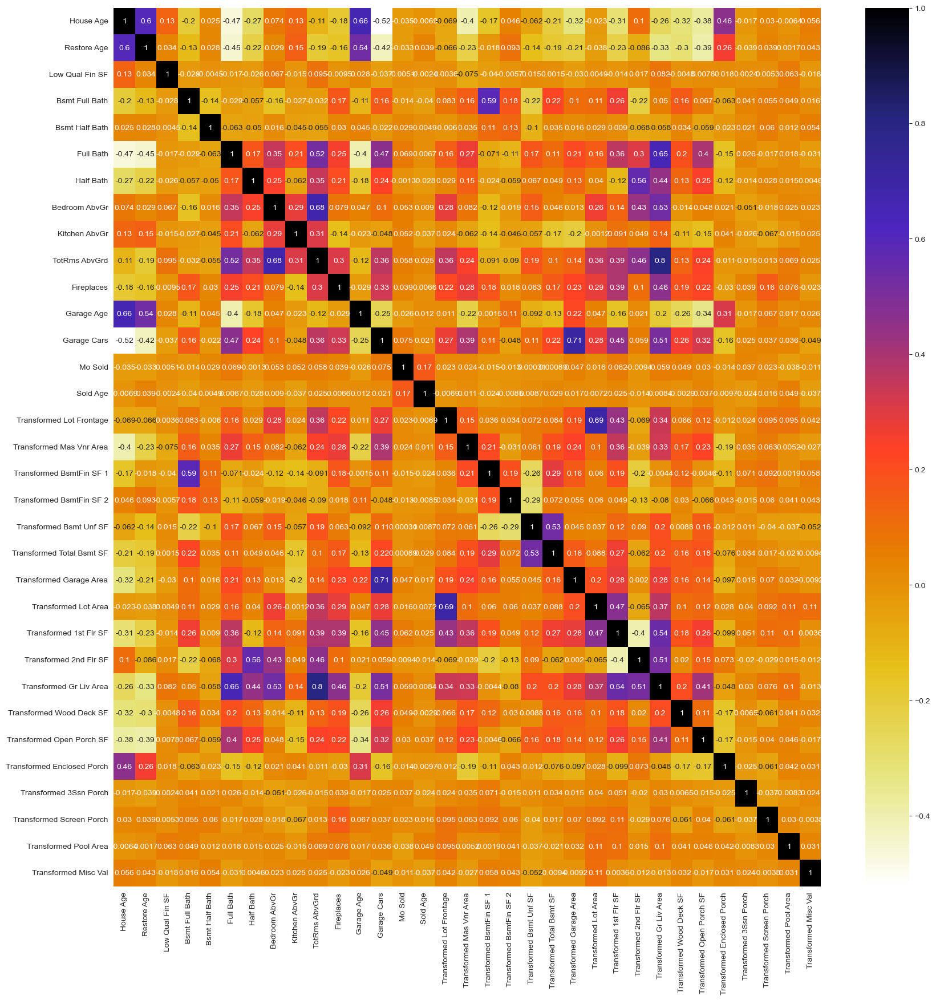

In [687]:
plt.figure(figsize=(20,20))
corr = continuous_countable_feature_data.corr()
sns.heatmap(corr, annot=True, cmap=plt.cm.CMRmap_r)

In [689]:
def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname1 = corr_matrix.columns[i]  # getting the name of column
                colname2 = corr_matrix.columns[j]
                sum_colname1 = 0
                sum_colname2 = 0
                for k in range(len(corr_matrix.columns)):
                    sum_colname1 = sum_colname1 + abs(corr_matrix.iloc[i, k])
                for k in range(len(corr_matrix.columns)):
                    sum_colname2 = sum_colname1 + abs(corr_matrix.iloc[j, k])
                ave_colname1 = (sum_colname1 -1) / (len(corr_matrix.columns)-1) # compute average correlation with other features
                ave_colname2 = (sum_colname2 -1) / (len(corr_matrix.columns)-1)
                col_corr.add((colname1,colname2,ave_colname1,ave_colname2))
    return col_corr

In [719]:
correlation_threshold = 0.8
corr_features = correlation(continuous_countable_feature_data, correlation_threshold)
print(corr_features)

{('Transformed Gr Liv Area', 'TotRms AbvGrd', 0.2599571873901841, 0.2607459678727582)}


#### mutual information

In [696]:
discrete_cols = ohe_label_encoded_cols
discrete_features_indices = [x_train.columns.get_loc(col) for col in discrete_cols]
mutual_info_all = mutual_info_regression(x_train, y_train, discrete_features=discrete_features_indices)

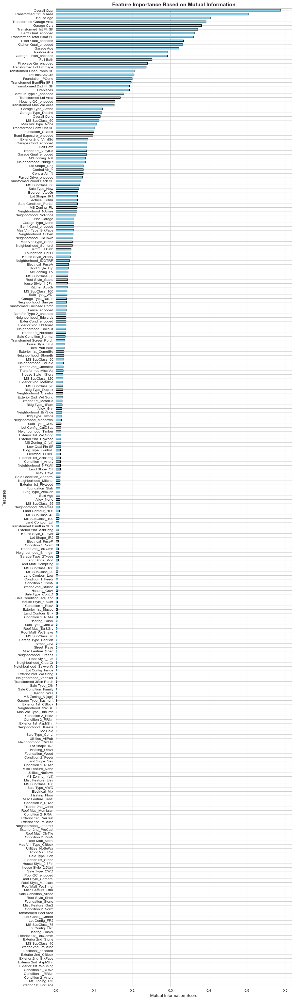

In [ ]:
mutual_info_all = pd.Series(mutual_info_all)
mutual_info_all.index = x_train.columns

ax = mutual_info_all.sort_values(ascending=True).plot.barh(figsize=(12, 50), color='skyblue', edgecolor='black')
plt.title('Feature Importance Based on Mutual Information', fontsize=15, fontweight='bold')
plt.xlabel('Mutual Information Score', fontsize=12)
plt.ylabel('Features', fontsize=12)
plt.show()

Overall Qual                 0.587619
Transformed Gr Liv Area      0.504090
House Age                    0.404516
Transformed Garage Area      0.392613
Garage Cars                  0.381166
Transformed 1st Flr SF       0.371176
Bsmt Qual_encoded            0.362667
Transformed Total Bsmt SF    0.359419
Exter Qual_encoded           0.333701
Kitchen Qual_encoded         0.331871
Garage Age                   0.321953
Restore Age                  0.292545
Garage Finish_encoded        0.292132
Full Bath                    0.251388
Fireplace Qu_encoded         0.239733
Transformed Lot Frontage     0.236346
Transformed Open Porch SF    0.205011
TotRms AbvGrd                0.204173
Foundation_PConc             0.199884
Transformed BsmtFin SF 1     0.197084
Transformed 2nd Flr SF       0.192617
Fireplaces                   0.192156
BsmtFin Type 1_encoded       0.177874
Transformed Lot Area         0.168513
Heating QC_encoded           0.154857
Transformed Mas Vnr Area     0.152795
Garage Type_

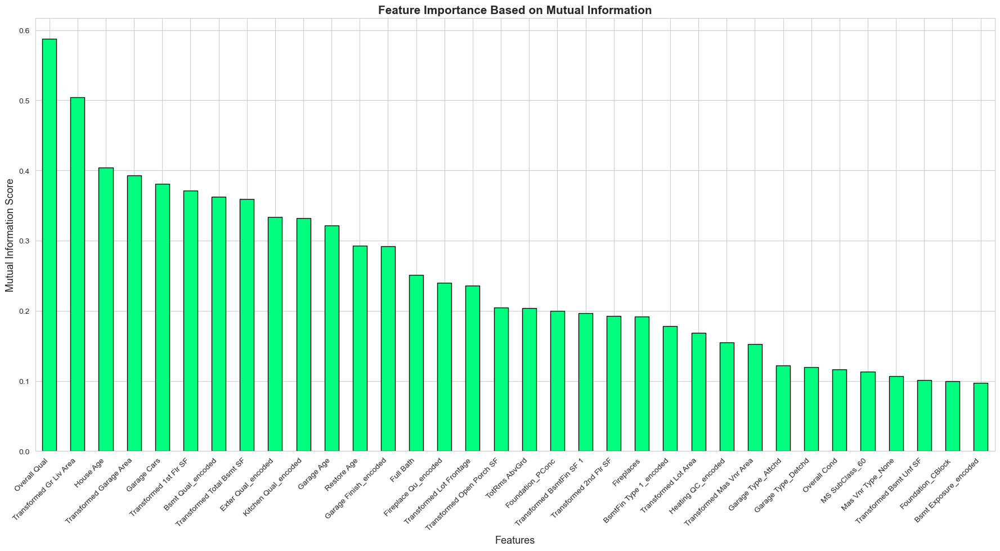

In [ ]:
mutual_info_all_selected = mutual_info_all[mutual_info_all > 0.09] # Select featrues with features importance lower than 0.1
print(mutual_info_all_selected.sort_values(ascending=False))
print('Number of selected features: %i' % len(mutual_info_all_selected))

mutual_info_all_selected.sort_values(ascending=False).plot.bar(figsize = (22,10), color='springgreen', edgecolor='black')
plt.title('Feature Importance Based on Mutual Information', fontsize=15, fontweight='bold')
plt.xlabel('Features', fontsize=13)
plt.ylabel('Mutual Information Score', fontsize=13)
plt.xticks(rotation=45, ha='right')
plt.show()

In [ ]:
# Remove features with high correlation in mutual_info_all_selected

#for i in list(corr_features):
#    j = list(i)
#    if j[0] in mutual_info_all_selected.index:
#        if j[1] in mutual_info_all_selected.index:
#            if mutual_info_all_selected[j[0]] > mutual_info_all_selected[j[1]]:
#                mutual_info_all_selected.drop(j[1], inplace=True)
#            else:
#                mutual_info_all_selected.drop(j[0], inplace=True)

# Choose Selected Feature
x_UnNor_mutual_info = X[mutual_info_all_selected.index]
print('Number of feature selected by mutual information method: ', x_UnNor_mutual_info.shape[1])
print('feature names selected by mutual information method: ', x_UnNor_mutual_info.columns)

Number of feature selected by mutual information method:  34
Number feature names selected by mutual information method:  Index(['Overall Qual', 'Overall Cond', 'House Age', 'Restore Age', 'Full Bath',
       'TotRms AbvGrd', 'Fireplaces', 'Garage Cars',
       'Transformed Lot Frontage', 'Transformed Mas Vnr Area',
       'Transformed BsmtFin SF 1', 'Transformed Bsmt Unf SF',
       'Transformed Total Bsmt SF', 'Transformed Garage Area',
       'Transformed Lot Area', 'Transformed 1st Flr SF',
       'Transformed 2nd Flr SF', 'Transformed Gr Liv Area',
       'Transformed Open Porch SF', 'MS SubClass_60', 'Mas Vnr Type_None',
       'Foundation_CBlock', 'Foundation_PConc', 'Garage Type_Attchd',
       'Garage Type_Detchd', 'Exter Qual_encoded', 'Bsmt Qual_encoded',
       'Heating QC_encoded', 'Kitchen Qual_encoded', 'Fireplace Qu_encoded',
       'Bsmt Exposure_encoded', 'BsmtFin Type 1_encoded',
       'Garage Finish_encoded', 'Garage Age'],
      dtype='object')


In [737]:
score_func = lambda X, y: mutual_info_regression(X, y, discrete_features=discrete_features_indices)
select_K_columns = SelectKBest(score_func,k=34)
select_K_columns.fit(x_train, y_train)

SelectKBest(k=34, score_func=<function <lambda> at 0x000001DE8E422020>)

In [794]:
print('Number of feature selected by mutual information method: ', select_K_columns.get_support().sum())
print('feature names selected by mutual information method: ', X.columns[select_K_columns.get_support()])
X.loc[:,select_K_columns.get_support()]

Number of feature selected by mutual information method:  34
feature names selected by mutual information method:  Index(['Overall Qual', 'Overall Cond', 'House Age', 'Restore Age', 'Full Bath',
       'TotRms AbvGrd', 'Fireplaces', 'Garage Cars',
       'Transformed Lot Frontage', 'Transformed Mas Vnr Area',
       'Transformed BsmtFin SF 1', 'Transformed Bsmt Unf SF',
       'Transformed Total Bsmt SF', 'Transformed Garage Area',
       'Transformed Lot Area', 'Transformed 1st Flr SF',
       'Transformed 2nd Flr SF', 'Transformed Gr Liv Area',
       'Transformed Open Porch SF', 'MS SubClass_60', 'Exterior 2nd_VinylSd',
       'Mas Vnr Type_None', 'Foundation_CBlock', 'Foundation_PConc',
       'Garage Type_Attchd', 'Garage Type_Detchd', 'Exter Qual_encoded',
       'Bsmt Qual_encoded', 'Heating QC_encoded', 'Kitchen Qual_encoded',
       'Fireplace Qu_encoded', 'BsmtFin Type 1_encoded',
       'Garage Finish_encoded', 'Garage Age'],
      dtype='object')


,Overall Qual,Overall Cond,House Age,Restore Age,Full Bath,TotRms AbvGrd,Fireplaces,Garage Cars,Transformed Lot Frontage,Transformed Mas Vnr Area,...,Garage Type_Attchd,Garage Type_Detchd,Exter Qual_encoded,Bsmt Qual_encoded,Heating QC_encoded,Kitchen Qual_encoded,Fireplace Qu_encoded,BsmtFin Type 1_encoded,Garage Finish_encoded,Garage Age
0,6,5,65,65,1,7,2,2,4.96,4.73,...,1,0,3,3,2,3,4,4,3,65
1,5,6,64,64,1,5,0,1,4.39,0.00,...,1,0,3,3,3,3,0,3,1,64
2,6,6,67,67,1,6,0,1,4.41,4.69,...,1,0,3,3,3,4,0,5,1,67
3,7,5,57,57,2,8,2,2,4.54,0.00,...,1,0,4,3,5,5,3,5,3,57
4,5,5,28,27,2,6,1,2,4.32,0.00,...,1,0,3,4,4,3,3,6,3,28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2925,6,6,41,41,1,6,0,2,3.64,0.00,...,0,1,3,3,3,3,0,6,1,41
2926,5,5,42,42,1,5,0,2,4.32,0.00,...,1,0,3,4,3,3,0,4,1,42
2927,5,5,33,33,1,6,0,0,4.14,0.00,...,0,0,3,4,3,3,0,6,0,0
2928,5,5,51,50,1,6,1,2,4.36,0.00,...,1,0,3,4,4,3,3,5,2,50


#### Feature Importance

In [756]:
# ExtraTreesRegressor
model_ETR = ExtraTreesRegressor(n_estimators=200, random_state=42, n_jobs=-1)
model_ETR.fit(x_train_UnNor, y_train_UnNor)

ExtraTreesRegressor(n_estimators=200, n_jobs=-1, random_state=42)

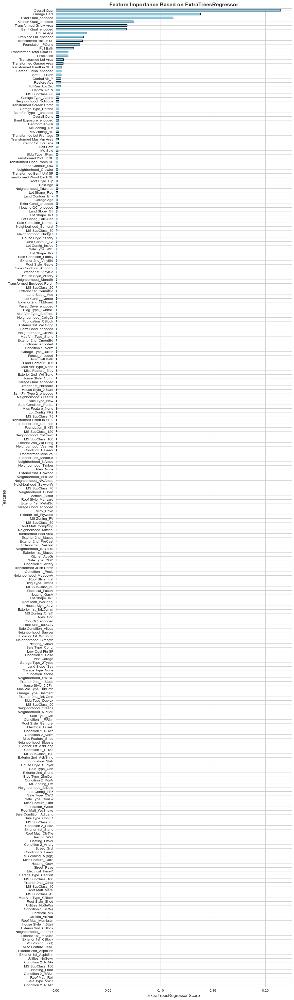

In [757]:
feature_importance_ETR = pd.Series(model_ETR.feature_importances_)
feature_importance_ETR.index = x_train_UnNor.columns

ax = feature_importance_ETR.sort_values(ascending=True).plot.barh(figsize=(12, 50), color='skyblue', edgecolor='black')
plt.title('Feature Importance Based on ExtraTreesRegressor', fontsize=15, fontweight='bold')
plt.xlabel('ExtraTreesRegressor Score', fontsize=12)
plt.ylabel('Features', fontsize=12)
plt.show()

Overall Qual                 0.214512
Garage Cars                  0.138071
Exter Qual_encoded           0.111894
Kitchen Qual_encoded         0.073858
Transformed Gr Liv Area      0.068177
Bsmt Qual_encoded            0.067395
House Age                    0.029575
Fireplace Qu_encoded         0.026352
Transformed 1st Flr SF       0.025486
Foundation_PConc             0.022681
Full Bath                    0.017074
Transformed Total Bsmt SF    0.011736
Fireplaces                   0.011539
dtype: float64
Number of selected features: 13


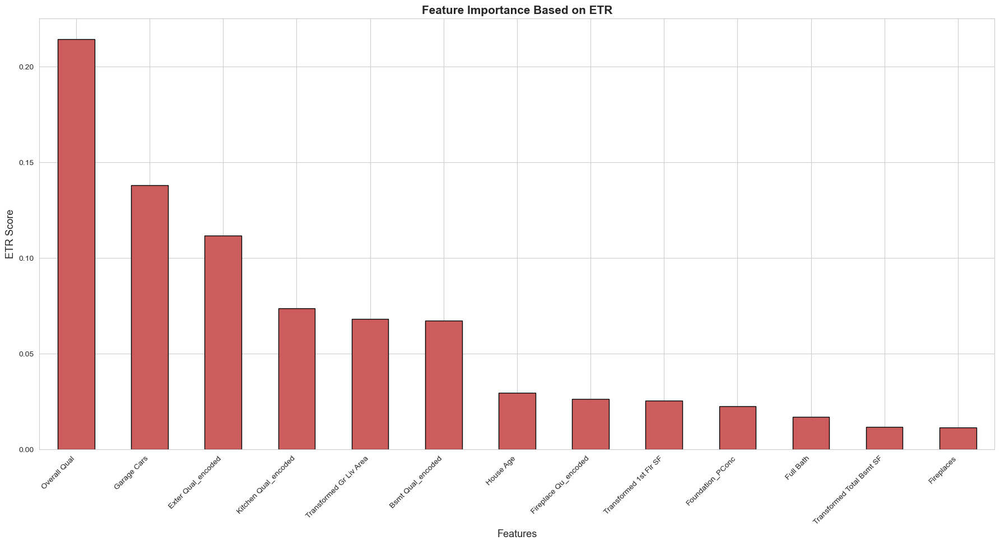

In [758]:
feature_importance_ETR_selected = feature_importance_ETR[ feature_importance_ETR > 0.01]

print(feature_importance_ETR_selected.sort_values(ascending=False))
print('Number of selected features: %i' % len(feature_importance_ETR_selected.index))

ax = feature_importance_ETR_selected.sort_values(ascending=False).plot.bar(figsize = (22,10), color='indianred', edgecolor='black')
plt.title('Feature Importance Based on ETR', fontsize=15, fontweight='bold')
plt.xlabel('Features', fontsize=13)
plt.ylabel('ETR Score', fontsize=13)
plt.xticks(rotation=45, ha='right')
plt.show()

In [759]:
# RandomForest Regressor
model_RF = RandomForestRegressor(n_estimators = 250, random_state=42, n_jobs=-1)
model_RF.fit(x_train_UnNor, y_train_UnNor)

feature_importance_RF = pd.Series(model_RF.feature_importances_, index = x_train_UnNor.columns)

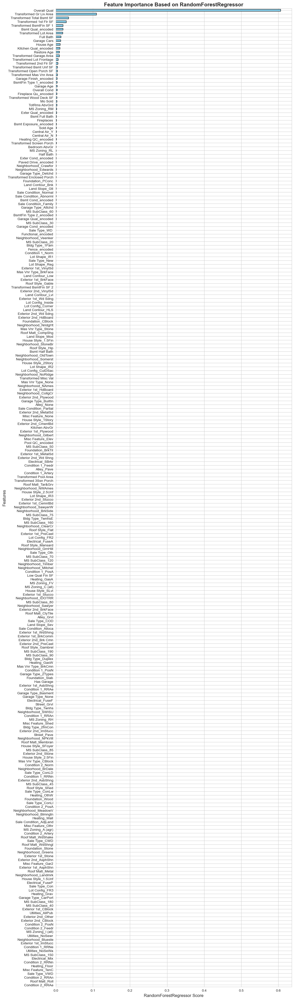

In [760]:
ax = feature_importance_RF.sort_values(ascending=True).plot.barh(figsize=(12, 50), color='skyblue', edgecolor='black')
plt.title('Feature Importance Based on RandomForestRegressor', fontsize=15, fontweight='bold')
plt.xlabel('RandomForestRegressor Score', fontsize=12)
plt.ylabel('Features', fontsize=12)
plt.show()

Overall Qual                 0.605823
Transformed Gr Liv Area      0.109374
Transformed Total Bsmt SF    0.034065
Transformed 1st Flr SF       0.028285
Transformed BsmtFin SF 1     0.019363
Bsmt Qual_encoded            0.019071
Transformed Lot Area         0.018626
Full Bath                    0.013811
Garage Cars                  0.012765
House Age                    0.011376
Kitchen Qual_encoded         0.010695
dtype: float64
Number of selected features: 11


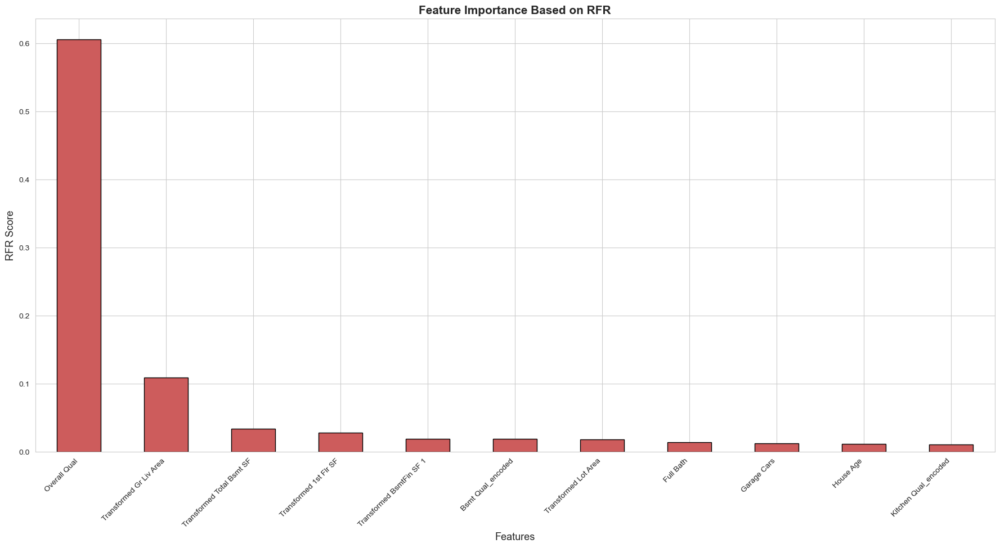

In [761]:
feature_importance_RF_selected = feature_importance_RF[ feature_importance_RF > 0.01]

print(feature_importance_RF_selected.sort_values(ascending=False))
print('Number of selected features: %i' % len(feature_importance_RF_selected.index))

ax = feature_importance_RF_selected.sort_values(ascending=False).plot.bar(figsize = (22,10), color='indianred', edgecolor='black')
plt.title('Feature Importance Based on RFR', fontsize=15, fontweight='bold')
plt.xlabel('Features', fontsize=13)
plt.ylabel('RFR Score', fontsize=13)
plt.xticks(rotation=45, ha='right')
plt.show()

In [793]:
# Remove features with high correlation

#for i in list(corr_features):
#    j = list(i)
#    if j[0] in feature_importance_RF_selected.index:
#        if j[1] in feature_importance_RF_selected.index:
#            if feature_importance_RF_selected[j[0]] > feature_importance_RF_selected[j[1]]:
#                print(j[1])
#                feature_importance_RF_selected.drop(j[1], inplace=True)
#            else:
#                print(j[0])
#                feature_importance_RF_selected.drop(j[0], inplace=True)
                
# Choose Selected Feature 
x_UnNor_rf_feature_impor = X[feature_importance_RF_selected.index]
print('Number of feature selected by Feature Importance calculated with RFR  method : ', x_UnNor_rf_feature_impor.shape[1])
print('feature names selected by Feature Importance calculated with RFR method: \n', x_UnNor_rf_feature_impor.columns)

Number of feature selected by Feature Importance calculated with RFR  method :  11
feature names selected by Feature Importance calculated with RFR method: 
 Index(['Overall Qual', 'House Age', 'Full Bath', 'Garage Cars',
       'Transformed BsmtFin SF 1', 'Transformed Total Bsmt SF',
       'Transformed Lot Area', 'Transformed 1st Flr SF',
       'Transformed Gr Liv Area', 'Bsmt Qual_encoded', 'Kitchen Qual_encoded'],
      dtype='object')


In [767]:
# Lasso

model_LassoCv = LassoCV(cv=5, random_state=42, n_jobs=-1)
model_LassoCv.fit(x_train, y_train)

print(f'Best alpha found: {model_LassoCv.alpha_:.4f}')

feature_coef_lasso = pd.Series(model_LassoCv.coef_, index = x_train.columns)

Best alpha found: 0.0001


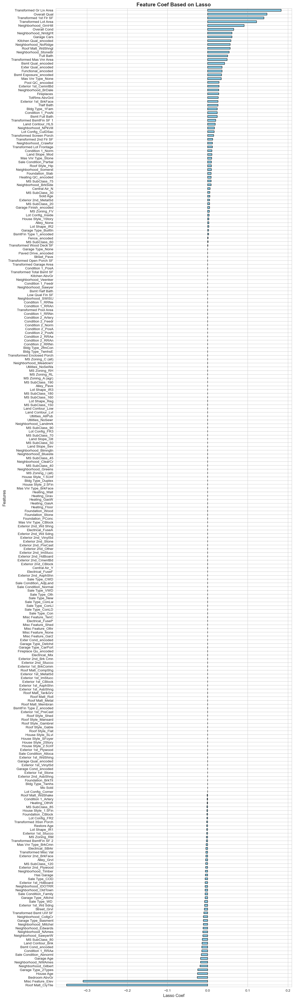

In [768]:
ax = feature_coef_lasso.sort_values(ascending=True).plot.barh(figsize=(12, 50), color='skyblue', edgecolor='black')
plt.title('Feature Coef Based on Lasso', fontsize=15, fontweight='bold')
plt.xlabel('Lasso Coef', fontsize=12)
plt.ylabel('Features', fontsize=12)
plt.show()

Transformed Gr Liv Area    0.182913
Overall Qual               0.147725
Transformed 1st Flr SF     0.140105
Transformed Lot Area       0.122149
Neighborhood_GrnHill       0.090713
                             ...   
Lot Shape_IR2              0.003045
Garage Type_BuiltIn        0.002737
BsmtFin Type 1_encoded     0.002735
Fence_encoded              0.001417
MS SubClass_60             0.001337
Length: 62, dtype: float64
Number of selected features: 62


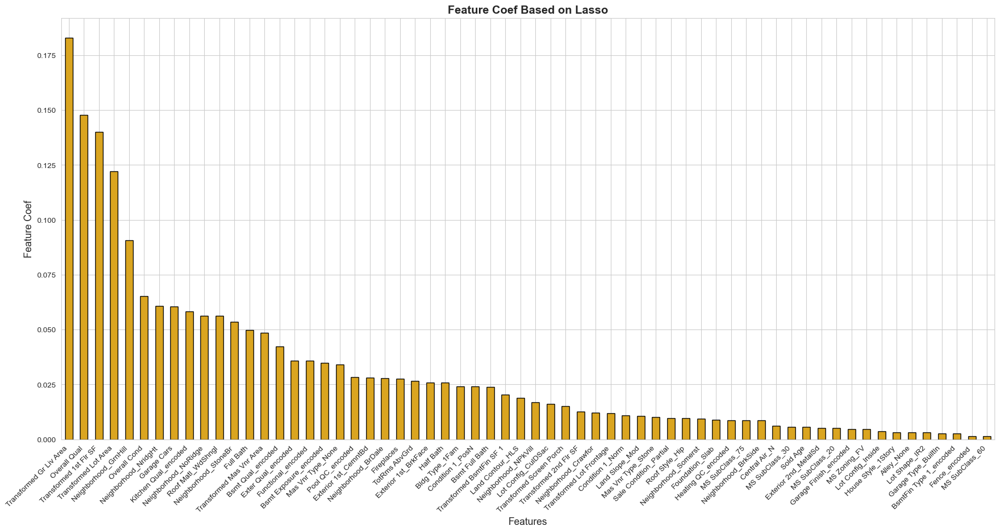

In [778]:
feature_coef_lasso_selected = feature_coef_lasso[feature_coef_lasso > 0.001]

print(feature_coef_lasso_selected.sort_values(ascending=False))
print('Number of selected features: %i' % len(feature_coef_lasso_selected.index))

ax = feature_coef_lasso_selected.sort_values(ascending=False).plot.bar(figsize = (22,10), color='goldenrod', edgecolor='black')
plt.title('Feature Coef Based on Lasso', fontsize=15, fontweight='bold')
plt.xlabel('Features', fontsize=13)
plt.ylabel('Feature Coef', fontsize=13)
plt.xticks(rotation=45, ha='right')
plt.show()

In [795]:
# Choose Selected Feature 
x_UnNor_lasso = X[feature_coef_lasso_selected.index]
print('Number of feature selected by coef calculated with Lasso  method : ', x_UnNor_lasso.shape[1])
print('feature names selected by coef calculated with Lasso method: \n', x_UnNor_lasso.columns)

Number of feature selected by coef calculated with Lasso  method :  62
feature names selected by coef calculated with Lasso method: 
 Index(['Overall Qual', 'Overall Cond', 'Bsmt Full Bath', 'Full Bath',
       'Half Bath', 'TotRms AbvGrd', 'Fireplaces', 'Garage Cars', 'Sold Age',
       'Transformed Lot Frontage', 'Transformed Mas Vnr Area',
       'Transformed BsmtFin SF 1', 'Transformed Lot Area',
       'Transformed 1st Flr SF', 'Transformed 2nd Flr SF',
       'Transformed Gr Liv Area', 'Transformed Screen Porch', 'MS SubClass_20',
       'MS SubClass_30', 'MS SubClass_60', 'MS SubClass_75', 'MS Zoning_FV',
       'Alley_None', 'Lot Shape_IR2', 'Land Contour_HLS', 'Lot Config_CulDSac',
       'Lot Config_Inside', 'Land Slope_Mod', 'Neighborhood_BrDale',
       'Neighborhood_BrkSide', 'Neighborhood_Crawfor', 'Neighborhood_GrnHill',
       'Neighborhood_NPkVill', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt',
       'Neighborhood_Somerst', 'Neighborhood_StoneBr', 'Condition 1_Norm'

#### Sequential Feature Selector

In [786]:
model_RF_SFS = RandomForestRegressor(n_estimators = 100,random_state=42, n_jobs=-1)
model_svr_SFS = SVR(kernel='rbf', C=1)

In [ ]:
# R2 method is cosidered to score prediction 

#sfs_RF_R2 = SFS(model_RF_SFS, 
#          k_features='best', 
#          forward=False, 
#          floating=True, 
#          scoring='r2',
#          cv=KFold(5, shuffle=True, random_state=42),
#          n_jobs=-1)

#sfs_RF_R2.fit(x_train_UnNor, y_train_UnNor)

In [ ]:
#pd.DataFrame.from_dict(sfs_RF_R2.get_metric_dict()).T

In [ ]:
#print(f"Best score achieved: {sfs_RF_R2.k_score_:.4f}")
#print(f"Selected feature names: {sfs_RF_R2.k_feature_names_}")

In [ ]:
#sfs_RF_NRMS = SFS(model_RF_SFS, 
#          k_features='best', 
#          forward=False, 
#          floating=True, 
#          scoring='neg_root_mean_squared_error',
#          cv=5,
#          n_jobs=-1)

#sfs_RF_NRMS.fit(x_train_UnNor, y_train_UnNor)

In [ ]:
#pd.DataFrame.from_dict(sfs_RF_NRMS.get_metric_dict()).T
#print(f"Best score achieved: {sfs_RF_NRMS.k_score_:.4f}")
#print(f"Selected feature names: {sfs_RF_NRMS.k_feature_names_}")

In [788]:
#sfs_svr_R2 = SFS(model_svr_SFS, 
#          k_features='best', 
#          forward=False, 
#          floating=True, 
#          scoring='r2',
#          cv=KFold(5, shuffle=True, random_state=42),
#          n_jobs=-1)

#sfs_svr_R2.fit(x_train, y_train)

In [789]:
#pd.DataFrame.from_dict(sfs_svr_R2.get_metric_dict()).T

In [790]:
#print(f"Best score achieved: {sfs_svr_R2.k_score_:.4f}")
#print(f"Selected feature names: {sfs_svr_R2.k_feature_names_}")

In [791]:
# Remove features with high correlation

#for i in list(corr_features):
#    j = list(i)
#    if j[0] in list(sfs_svr_R2.k_feature_names_):
#        if j[1] in list(sfs_svr_R2.k_feature_names_):
#            if j[2] > j[3]:
#                print((j[0],j[2]))
#                list(sfs_svr_R2.k_feature_names_).remove(j[0], inplace=True)
#            else:
#                print((j[1],j[3]))
#                list(sfs_svr_R2.k_feature_names_).remove(j[1], inplace=True)
                
# Choose Selected Feature

#x_UnNor_sfs_svr_R2 = X[list(sfs_svr_R2.k_feature_names_)]
#print('Number of feature selected by SFS SVR_RBF method : ', x_UnNor_sfs_svr_R2.shape[1])
#print('Number feature names selected by SFS SVR_RBF method: \n', x_UnNor_sfs_svr_R2.columns)

In [792]:
sfs_svr_NRMS = SFS(model_svr_SFS, 
          k_features='best', # Running time is too long 
          forward=False, 
          floating=True, 
          scoring='neg_root_mean_squared_error',
          cv=KFold(5, shuffle=True, random_state=42),
          n_jobs=-1)

sfs_svr_NRMS.fit(x_train, y_train)

print(f"Best score achieved: {sfs_svr_NRMS.k_score_:.4f}")
print(f"Selected feature names: {sfs_svr_NRMS.k_feature_names_}")
pd.DataFrame.from_dict(sfs_svr_NRMS.get_metric_dict()).T

Best score achieved: -0.0429
Selected feature names: ('Overall Qual', 'Overall Cond', 'Bsmt Full Bath', 'Full Bath', 'Kitchen AbvGr', 'Transformed Lot Area', 'Transformed 1st Flr SF', 'Transformed Gr Liv Area', 'MS SubClass_85', 'MS SubClass_180', 'MS Zoning_FV', 'Land Contour_Bnk', 'Neighborhood_Edwards', 'Neighborhood_NAmes', 'Neighborhood_NWAmes', 'Neighborhood_StoneBr', 'Condition 2_Artery', 'Condition 2_PosN', 'House Style_2.5Unf', 'Roof Style_Flat', 'Exterior 1st_PreCast', 'Exterior 1st_Stone', 'Exterior 2nd_PreCast', 'Foundation_CBlock', 'Central Air_Y', 'Sale Condition_Family', 'Bsmt Qual_encoded', 'Kitchen Qual_encoded', 'Fireplace Qu_encoded', 'Garage Cond_encoded', 'Paved Drive_encoded')


,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
258,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[-0.05352822270491407, -0.06202952918974636, -...",-0.0602,"(Overall Qual, Overall Cond, House Age, Restor...",0.006369,0.004955,0.002478
257,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[-0.053638188327984684, -0.06167113737773914, ...",-0.059908,"(Overall Qual, Overall Cond, House Age, Restor...",0.006459,0.005026,0.002513
256,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[-0.05320979293599851, -0.06097093006413346, -...",-0.059584,"(Overall Qual, Overall Cond, House Age, Restor...",0.006477,0.005039,0.00252
255,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[-0.05265764182857967, -0.06028096876819949, -...",-0.059309,"(Overall Qual, Overall Cond, House Age, Restor...",0.006708,0.005219,0.002609
254,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[-0.05235535290005509, -0.06011368163678096, -...",-0.05907,"(Overall Qual, Overall Cond, House Age, Restor...",0.006839,0.005321,0.00266
...,...,...,...,...,...,...,...
5,"(0, 24, 26, 143, 257)","[-0.04797301059096976, -0.05056331195638839, -...",-0.049396,"(Overall Qual, Transformed 1st Flr SF, Transfo...",0.004185,0.003256,0.001628
4,"(0, 24, 26, 193)","[-0.04962959237123725, -0.051793418784694664, ...",-0.051053,"(Overall Qual, Transformed 1st Flr SF, Transfo...",0.002668,0.002076,0.001038
3,"(0, 18, 26)","[-0.045067883701011044, -0.04905556873336281, ...",-0.052689,"(Overall Qual, Transformed BsmtFin SF 1, Trans...",0.006869,0.005345,0.002672
2,"(0, 26)","[-0.05627925172733344, -0.053263199496176326, ...",-0.059041,"(Overall Qual, Transformed Gr Liv Area)",0.005017,0.003904,0.001952


In [796]:


# Remove features with high correlation

#for i in list(corr_features):
#    j = list(i)
#    if j[0] in list(sfs_svr_NRMS.k_feature_names_):
#        if j[1] in list(sfs_svr_NRMS.k_feature_names_):
#            if j[2] > j[3]:
#                print((j[0],j[2]))
#                list(sfs_svr_NRMS.k_feature_names_).remove(j[0], inplace=True)
#            else:
#                print((j[1],j[3]))
#                list(sfs_svr_NRMS.k_feature_names_).remove(j[1], inplace=True)

x_UnNor_sfs_svr_NRMS = X[list(sfs_svr_NRMS.k_feature_names_)]
print('Number of feature selected by SFS SVR_RBF method : ', x_UnNor_sfs_svr_NRMS.shape[1])
print('Number feature names selected by SFS SVR_RBF method: \n', x_UnNor_sfs_svr_NRMS.columns)

Number of feature selected by SFS SVR_RBF method :  31
Number feature names selected by SFS SVR_RBF method: 
 Index(['Overall Qual', 'Overall Cond', 'Bsmt Full Bath', 'Full Bath',
       'Kitchen AbvGr', 'Transformed Lot Area', 'Transformed 1st Flr SF',
       'Transformed Gr Liv Area', 'MS SubClass_85', 'MS SubClass_180',
       'MS Zoning_FV', 'Land Contour_Bnk', 'Neighborhood_Edwards',
       'Neighborhood_NAmes', 'Neighborhood_NWAmes', 'Neighborhood_StoneBr',
       'Condition 2_Artery', 'Condition 2_PosN', 'House Style_2.5Unf',
       'Roof Style_Flat', 'Exterior 1st_PreCast', 'Exterior 1st_Stone',
       'Exterior 2nd_PreCast', 'Foundation_CBlock', 'Central Air_Y',
       'Sale Condition_Family', 'Bsmt Qual_encoded', 'Kitchen Qual_encoded',
       'Fireplace Qu_encoded', 'Garage Cond_encoded', 'Paved Drive_encoded'],
      dtype='object')


#### RECURSIVE FEATURE ELIMINATION

In [797]:
model_svr_refcv = SVR(kernel='linear', C=1) 
model_RF_refcv = RandomForestRegressor(n_estimators = 100, random_state=42)

In [798]:
# SVR RFECV
model_svr_refcv = RFECV(model_svr_refcv, cv=KFold(5, shuffle=True, random_state=42)) 
values_svr = model_svr_refcv.fit(x_train, y_train)

print("Num Features: %s" % (values_svr.n_features_))
#print("Selected Features: %s" % (values_svr.support_))
print("Feature Ranking: %s" % (values_svr.ranking_)) 
print("Selected Feature names: %s" % (values_svr.get_feature_names_out())) 

Num Features: 32
Feature Ranking: [  1   3  11 141 105  41  85   1   1   1   1   1   1   1 104  46   4   1
  18  58 113  10 150   1   1  37   1  87  54 107 125  22   1  14  39  36
 117 221 189 156 191 187 192  99  71  62 211  40 122  65 208  98  33 151
 162 137 114 198 195  57 169 119 152  92  25 153  31  83 158 157  70  59
 227 166   5 118 154 171 176  49 163 220  84  72  50  63  48 181  96   1
 103   1 177 196  74  20  13  42   1 115   1 194  79 174  91  34   1  26
   1 155 120  89 143  68   8  32  38 199 178 106  35 214 203 216 207 110
 123 164  94 165 135 148 206 100 217 185 121 138 172 175  81  95  80  12
 131   1   1 226  90 212   1   7   1 186 200 127   2 209  61 130 168  66
 167  93 197  27 129  60 160 184 222  47  86  78   6 183  75  67 205 101
  82 149  88 128 111 159  23  24 133   1 109  29  28  30  56  97 225 219
 108 182 223 132 224 134 145 179 180  52 201  69   1 193 170  45 204  43
   1   1  17  19  15  16 218 144 213 210  44 202 161 136 188 215  76  73
 190 147 126  77 

In [799]:
# Remove features with high correlation

#for i in list(corr_features):
#    j = list(i)
#    if j[0] in values_svr.get_feature_names_out():
#        if j[1] in values_svr.get_feature_names_out():
#           if j[2] > j[3]:
#               print((j[0],j[2]))
#                values_svr.get_feature_names_out() = np.delete(A,np.where(A == j[0]))
#            else:
#                print((j[1],j[3]))
#                values_svr.get_feature_names_out() = np.delete(A,np.where(A == j[1]))
               
# Choose Selected Feature For X_train and X_test

x_UnNor_svr_refcv = X[values_svr.get_feature_names_out()]
print('Number of feature selected by SVR RFECV method : ', x_UnNor_svr_refcv.shape[1])
print('Number feature names selected by SVR RFECV method: \n', x_UnNor_svr_refcv.columns)

Number of feature selected by SVR RFECV method :  32
Number feature names selected by SVR RFECV method: 
 Index(['Overall Qual', 'Full Bath', 'Half Bath', 'Bedroom AbvGr',
       'Kitchen AbvGr', 'TotRms AbvGrd', 'Fireplaces', 'Garage Cars',
       'Transformed Mas Vnr Area', 'Transformed Lot Area',
       'Transformed 1st Flr SF', 'Transformed Gr Liv Area',
       'Transformed Pool Area', 'Neighborhood_Gilbert', 'Neighborhood_GrnHill',
       'Neighborhood_NWAmes', 'Neighborhood_NridgHt', 'Neighborhood_StoneBr',
       'Neighborhood_Veenker', 'Roof Matl_ClyTile', 'Roof Matl_CompShg',
       'Roof Matl_Tar&Grv', 'Roof Matl_WdShngl', 'Mas Vnr Type_None',
       'Garage Type_2Types', 'Garage Type_None', 'Misc Feature_Elev',
       'Kitchen Qual_encoded', 'Pool QC_encoded', 'Bsmt Exposure_encoded',
       'Functional_encoded', 'Has Garage'],
      dtype='object')


In [800]:
model_RF_refcv = RFECV(model_RF_refcv, cv=KFold(5, shuffle=True, random_state=42)) 
values_RF = model_RF_refcv.fit(x_train_UnNor, y_train_UnNor)

print("Num Features: %s" % (values_RF.n_features_))
print("Selected Features: %s" % (values_RF.support_))
print("Feature Ranking: %s" % (values_RF.ranking_)) 
print("Selected Feature names: %s" % (values_RF.get_feature_names_out())) 

Num Features: 55
Selected Features: [ True  True  True  True False  True False  True  True  True False  True
  True  True  True  True  True  True  True False  True  True  True  True
  True  True  True  True  True  True False  True False False  True False
 False False False False False False False False False False False False
 False False False False False False False  True  True False False False
 False False False False False  True False False False False False False
 False False False False False False  True False False False False False
 False False False  True  True False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False  True False False False False False False False False False
 False False Fa

In [801]:
x_UnNor_RF_refcv = X[values_RF.get_feature_names_out()]
print('Number of feature selected by RF RFECV method : ', x_UnNor_RF_refcv.shape[1])
print('Number feature names selected by RF RFECV method: \n', x_UnNor_RF_refcv.columns)

Number of feature selected by RF RFECV method :  55
Number feature names selected by RF RFECV method: 
 Index(['Overall Qual', 'Overall Cond', 'House Age', 'Restore Age',
       'Bsmt Full Bath', 'Full Bath', 'Half Bath', 'Bedroom AbvGr',
       'TotRms AbvGrd', 'Fireplaces', 'Garage Cars', 'Mo Sold', 'Sold Age',
       'Transformed Lot Frontage', 'Transformed Mas Vnr Area',
       'Transformed BsmtFin SF 1', 'Transformed Bsmt Unf SF',
       'Transformed Total Bsmt SF', 'Transformed Garage Area',
       'Transformed Lot Area', 'Transformed 1st Flr SF',
       'Transformed 2nd Flr SF', 'Transformed Gr Liv Area',
       'Transformed Wood Deck SF', 'Transformed Open Porch SF',
       'Transformed Enclosed Porch', 'Transformed Screen Porch',
       'MS SubClass_20', 'MS Zoning_RL', 'MS Zoning_RM', 'Lot Shape_Reg',
       'Land Slope_Gtl', 'Neighborhood_Crawfor', 'Neighborhood_Edwards',
       'Roof Matl_CompShg', 'Central Air_N', 'Central Air_Y',
       'Garage Type_Detchd', 'Sale Type_WD

In [802]:
# Selected Features By Different Methods

print('features with most correlation:\n %s \n' % corr_features)
print('selected features by mutual information method:\n %s \n' % mutual_info_all_selected.index)
print('selected features by random forest features importance method:\n %s \n' % feature_importance_RF_selected.index)
print('selected features by Lasso method: \n', feature_coef_lasso_selected.index)
print('selected features by SVR Sequential Feature Selector method:\n %s \n' % list(sfs_svr_NRMS.k_feature_names_))
print('selected features by SVR RECURSIVE FEATURE ELIMINATION method:\n %s \n' % values_svr.get_feature_names_out())
print('selected features by Random Forest RECURSIVE FEATURE ELIMINATION method:\n %s \n' % values_RF.get_feature_names_out())

features with most correlation:
 {('Transformed Gr Liv Area', 'TotRms AbvGrd', 0.2599571873901841, 0.2607459678727582)} 

selected features by mutual information method:
 Index(['Overall Qual', 'Overall Cond', 'House Age', 'Restore Age', 'Full Bath',
       'TotRms AbvGrd', 'Fireplaces', 'Garage Cars',
       'Transformed Lot Frontage', 'Transformed Mas Vnr Area',
       'Transformed BsmtFin SF 1', 'Transformed Bsmt Unf SF',
       'Transformed Total Bsmt SF', 'Transformed Garage Area',
       'Transformed Lot Area', 'Transformed 1st Flr SF',
       'Transformed 2nd Flr SF', 'Transformed Gr Liv Area',
       'Transformed Open Porch SF', 'MS SubClass_60', 'Mas Vnr Type_None',
       'Foundation_CBlock', 'Foundation_PConc', 'Garage Type_Attchd',
       'Garage Type_Detchd', 'Exter Qual_encoded', 'Bsmt Qual_encoded',
       'Heating QC_encoded', 'Kitchen Qual_encoded', 'Fireplace Qu_encoded',
       'Bsmt Exposure_encoded', 'BsmtFin Type 1_encoded',
       'Garage Finish_encoded', 'Garage

In [803]:
pd.DataFrame(cont_count_features).to_csv('cont_count_features.csv', index=False)
pd.DataFrame(ohe_label_encoded_cols).to_csv('ohe_label_encoded_cols.csv', index=False)
pd.DataFrame(ordinal_encoded_features).to_csv('ordinal_encoded_features.csv', index=False)

In [804]:
x_UnNor_RF_refcv.to_csv('x_UnNor_RF_refcv.csv', index=False)

x_UnNor_svr_refcv.to_csv('x_UnNor_svr_refcv.csv', index=False)

x_UnNor_sfs_svr_NRMS.to_csv('x_UnNor_sfs_svr_NRMS.csv', index=False)

x_UnNor_rf_feature_impor.to_csv('x_UnNor_rf_feature_impor.csv', index=False)

x_UnNor_mutual_info.to_csv('x_UnNor_mutual_info.csv', index=False)

x_UnNor_lasso.to_csv('x_UnNor_lasso.csv', index=False)


In [805]:
y.to_csv('y_UnNor.csv', index=False)
X.to_csv('x_UnNor.csv', index=False)